In [11]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tqdm.notebook import tqdm
from sklearn.metrics import accuracy_score, f1_score, recall_score, confusion_matrix
import os
from sklearn.metrics import roc_auc_score

In [2]:
data=pd.read_csv('sensor.csv')
print(data.head(3))
print('all class labels:',data['machine_status'].unique())

   Unnamed: 0            timestamp  sensor_00  sensor_01  sensor_02  \
0           0  2018-04-01 00:00:00   2.465394   47.09201    53.2118   
1           1  2018-04-01 00:01:00   2.465394   47.09201    53.2118   
2           2  2018-04-01 00:02:00   2.444734   47.35243    53.2118   

   sensor_03  sensor_04  sensor_05  sensor_06  sensor_07  ...  sensor_43  \
0   46.31076   634.3750   76.45975   13.41146   16.13136  ...   41.92708   
1   46.31076   634.3750   76.45975   13.41146   16.13136  ...   41.92708   
2   46.39757   638.8889   73.54598   13.32465   16.03733  ...   41.66666   

   sensor_44  sensor_45  sensor_46  sensor_47  sensor_48  sensor_49  \
0  39.641200   65.68287   50.92593  38.194440   157.9861   67.70834   
1  39.641200   65.68287   50.92593  38.194440   157.9861   67.70834   
2  39.351852   65.39352   51.21528  38.194443   155.9606   67.12963   

   sensor_50  sensor_51  machine_status  
0   243.0556   201.3889          NORMAL  
1   243.0556   201.3889          NORMAL  

In [3]:
data.drop(['sensor_15','Unnamed: 0'],inplace=True,axis=1)

In [4]:
mean=data.iloc[0:int((data.shape[0]*50)/100)][data.columns[1:-1]].mean().values
for i in tqdm(range(1,len(data.columns)-1)):
    col=data.columns[i]
    data[col]=data[col].fillna(mean[i-1])

## Feature set 1:
- We are using roling window method to create feature set, for each window we are going to take min, max, standerd deviation, midian and mean.
- We are using window of 60 samples and we are preding failure 60 minutes befor it happen.
- We have very few data points of failure class, hence we are using window spacing of 1 for failure and window spacing 2 for normal class.
- if samples are like s1,s2,s3....... then 1st window for failure class is s1 - s60 and 2nd should be s2-s61 and so on. for normal class 1st window is s1-s60 then next window is s2-s62.
- here we are removing 'RECOVERING' class. and making class 'NORMAL' as 0 and 'BROKEN' as 1.

In [5]:
data=data[data['machine_status']!='RECOVERING']
data['machine_status'][data['machine_status']=='BROKEN']= 1
data['machine_status'][data['machine_status']=='NORMAL']= 0

D:\study\anna\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [ ]:
if not os.path.isfile('final_data_1.csv'):
    # here we are making column's name for our dataframe. 
    columns=[]
    columns.append(data.columns[0]) 
    for col in data.columns[1:-1]:
        columns.append('s{0}_mean'.format(col[7:])) #to select sensor number
        columns.append('s{0}_std'.format(col[7:]))
        columns.append('s{0}_mid'.format(col[7:]))
        columns.append('s{0}_min'.format(col[7:]))
        columns.append('s{0}_max'.format(col[7:]))
    columns.append('machine_status')
    index=0
    final_data=pd.DataFrame(columns=columns)
    while index < data.shape[0]-120:
        print(index)
        window=data[data.columns[1:-1]].iloc[index:index+60]
        l=[] # this list store single row
        l.append(data['timestamp'].iloc[index+60]) #taking timestamp
        for col in window.columns:
            l.append(window[col].mean())#calculating features
            l.append(window[col].std())
            l.append(window[col].median())
            l.append(window[col].min())
            l.append(window[col].max())
        ms=data['machine_status'].iloc[index+120:index+180].max() #taking max class label from window so that if there is----
        #failure, we can detect it.
        l.append(ms)
        if (ms==1) and (data['machine_status'].iloc[index+120+1:index+180+1].max()==0): #if failure window is over then---
            #we should move index to next point after failutr point because we are not uing that failure window for prediction.
            index=index+121
        else:
            if ms==1:
                index=index+1 #1 spacing
            else:
                index=index+2 #2 spacing
        final_data=final_data.append(pd.Series(l, index=columns), ignore_index=True)
    final_data.to_csv('final_data_1.csv') 

## Modeling 1

## Train Test Split:

In [3]:
X=pd.read_csv('final_data_1.csv')
fail_point=X[X['machine_status']==1]
X=X[X['machine_status']==0] #store only points belonging to class 0

In [4]:
#devide 0 labeled points into train,cv and test
X_train=X.iloc[0:int((X.shape[0]*50)/100)]
X_cv=X.iloc[int((X.shape[0]*50)/100):int((X.shape[0]*76)/100)]
X_test=X.iloc[int((X.shape[0]*76)/100):]
print('train shape:',X_train.shape)
print('cv shape:',X_cv.shape)
print('test shape:',X_test.shape)

train shape: (51116, 258)
cv shape: (26581, 258)
test shape: (24536, 258)


#### Adding positive points into train,cv and test

In [5]:
fail_point['timestamp']=pd.to_datetime(fail_point['timestamp'])
g=fail_point.groupby(by=fail_point['timestamp'].dt.date) #group 1 labeled points by date, so that we should not do data leakage
cnt=0
for date in list(g.groups.keys()):
    if cnt < 4:
        X_train=pd.concat([g.get_group(date),X_train]) 
        cnt=cnt+1
    else:
        cnt=cnt+1

cnt=0
for date in list(g.groups.keys()):
    if cnt > 3 and cnt < 6:
        X_cv=pd.concat([g.get_group(date),X_cv]) 
        cnt=cnt+1
    else:
        cnt=cnt+1
    
cnt=0
for date in list(g.groups.keys()):
    if cnt == 6:
        X_test=pd.concat([g.get_group(date),X_test]) 
        cnt=cnt+1
    else:
        cnt=cnt+1

In [6]:
g=X_train.groupby('machine_status')
print('total BROKEN class data points in train data:',len(g.get_group(1)))
g=X_cv.groupby('machine_status')
print('total BROKEN class data points in train data:',len(g.get_group(1)))
g=X_test.groupby('machine_status')
print('total BROKEN class data points in train data:',len(g.get_group(1)))
y_train=X_train['machine_status']
y_cv=X_cv['machine_status']

total BROKEN class data points in train data: 239
total BROKEN class data points in train data: 118
total BROKEN class data points in train data: 60


In [7]:
y_train = X_train['machine_status']
X_train = X_train.drop(['machine_status','Unnamed: 0'], axis=1)
y_cv = X_cv['machine_status']
X_cv = X_cv.drop(['machine_status','Unnamed: 0'], axis=1)
y_test = X_test['machine_status']
X_test = X_test.drop(['machine_status','Unnamed: 0'], axis=1)

In [8]:
def plot_confusion_matrix(test_y, predict_y,size):
    """ this function print cunfusion matrix and recall matrix
    """
    labels = list(np.unique(test_y))
    C = confusion_matrix(test_y, predict_y,labels=labels)
    A =(((C.T)/(C.sum(axis=1))).T)
    # representing A in heatmap format
    print("-"*20, "Confusion matrix", "-"*20)
    plt.figure(figsize=size)
    sns.heatmap(C, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

    print("-"*20, "Recall matrix (Row sum=1)", "-"*20)
    plt.figure(figsize=size)
    sns.heatmap(A, annot=True, cmap="YlGnBu", fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

## Simple Model: 

- Our data is highly imbalance, we have only 7 data points of the positive class.
- We know that the decision tree-based model performs well with imbalanced data and the random forest is itself reduces variance.
- That's why I have decided to experiment with the random forest.

train Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


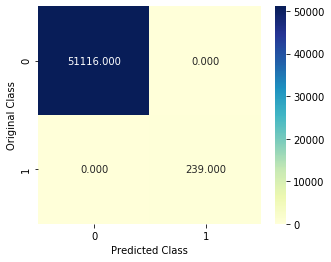

-------------------- Recall matrix (Row sum=1) --------------------


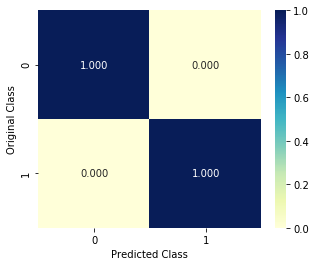

cv Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


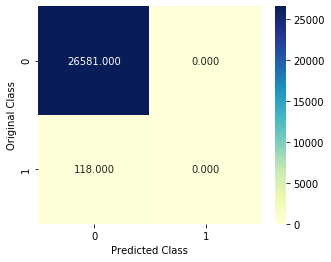

-------------------- Recall matrix (Row sum=1) --------------------


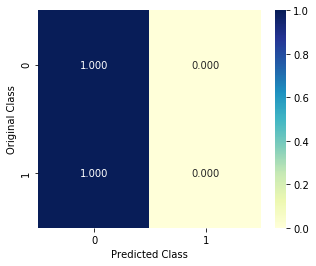

train AUC score: 1.0
cv AUC score: 0.4692497317122783


In [12]:
clf = RandomForestClassifier()
clf.fit(X_train[X_train.columns[1:]],y_train)
print('train Confusion matrix and Recall matrix')
plot_confusion_matrix(y_train, clf.predict(X_train[X_train.columns[1:]]),(5,4))
print('cv Confusion matrix and Recall matrix')
plot_confusion_matrix(y_cv, clf.predict(X_cv[X_train.columns[1:]]),(5,4))
print('train AUC score:',roc_auc_score(y_train, clf.predict_proba(X_train[X_train.columns[1:]])[:,1]))
print('cv AUC score:',roc_auc_score(y_cv, clf.predict_proba(X_cv[X_train.columns[1:]])[:,1]))

- checking probability of data points having class label 1 in train dataset. 

In [9]:
a=X_train[y_train==1]
clf.predict_proba(a[X_train.columns[1:]])[:,1]

array([0.81, 0.94, 0.99, 0.97, 0.97, 0.99, 1.  , 0.99, 0.99, 0.98, 0.99,
       1.  , 1.  , 0.98, 0.99, 0.98, 0.98, 1.  , 1.  , 1.  , 1.  , 1.  ,
       0.99, 0.99, 0.98, 0.98, 1.  , 0.99, 0.99, 0.98, 1.  , 1.  , 0.99,
       1.  , 0.99, 1.  , 1.  , 0.99, 1.  , 1.  , 1.  , 0.94, 0.98, 0.99,
       0.96, 0.99, 0.99, 0.98, 0.97, 0.96, 0.97, 0.99, 0.96, 0.97, 0.98,
       0.94, 0.93, 0.98, 0.92, 0.93, 0.9 , 0.94, 0.93, 0.99, 0.99, 0.98,
       1.  , 0.99, 1.  , 0.98, 0.96, 1.  , 0.98, 0.98, 0.99, 0.98, 0.99,
       0.99, 0.99, 0.98, 0.97, 0.99, 1.  , 1.  , 1.  , 0.99, 0.99, 1.  ,
       1.  , 0.98, 0.99, 0.99, 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 0.99,
       1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 0.99, 1.  , 1.  , 1.  , 1.  ,
       0.97, 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 0.99, 0.94, 0.81,
       0.91, 0.95, 0.99, 0.99, 1.  , 1.  , 0.99, 1.  , 1.  , 1.  , 1.  ,
       0.99, 0.99, 1.  , 1.  , 1.  , 1.  , 0.99, 0.99, 0.99, 1.  , 1.  ,
       0.99, 1.  , 1.  , 1.  , 1.  , 1.  , 1.  , 1.

- checking probability of data points having class label 1 in cv dataset.

In [10]:
a=X_cv[y_cv==1]
clf.predict_proba(a[X_train.columns[1:]])[:,1]

array([0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02,
       0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02, 0.02,
       0.02, 0.02, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05,
       0.05, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04, 0.04,
       0.05, 0.05, 0.06, 0.06, 0.06, 0.05, 0.04, 0.04, 0.04, 0.04, 0.04,
       0.04, 0.05, 0.05, 0.04, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08,
       0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08, 0.08,
       0.08, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07,
       0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07, 0.07,
       0.07, 0.07, 0.07, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06,
       0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06, 0.06])

- Due to huge imbalance in data our model is overfitted.
- We have some hyperparameter by tuning them properly we can adjust overfitting and underfitting of random forest.
- Here I have experimented with various values of hyperparameters still overfitting stayed the same.

## Random forest with keeping less threshold:

train Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


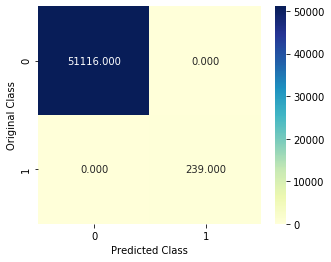

-------------------- Recall matrix (Row sum=1) --------------------


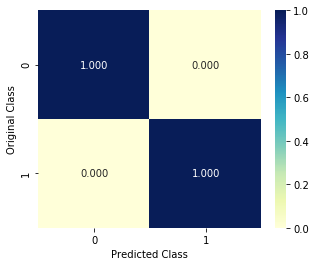

cv Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


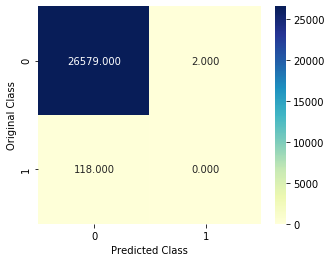

-------------------- Recall matrix (Row sum=1) --------------------


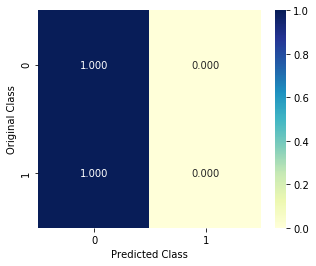

train AUC score: 0.9999999999999999
cv AUC score: 0.692828253136081


In [13]:
clf = RandomForestClassifier(n_estimators=120,max_depth=23,min_samples_split=3,max_features='sqrt',n_jobs=-1,random_state=1)
clf.fit(X_train[X_train.columns[1:]],y_train)
pred=clf.predict_proba(X_train[X_train.columns[1:]])[:,1]
pred[pred>=0.30]=1
pred[pred<0.30]=0
print('train Confusion matrix and Recall matrix')
plot_confusion_matrix(y_train, pred,(5,4))
pred=clf.predict_proba(X_cv[X_train.columns[1:]])[:,1]
pred[pred>=0.30]=1
pred[pred<0.30]=0
print('cv Confusion matrix and Recall matrix')
plot_confusion_matrix(y_cv, pred,(5,4))
print('train AUC score:',roc_auc_score(y_train, clf.predict_proba(X_train[X_train.columns[1:]])[:,1]))
print('cv AUC score:',roc_auc_score(y_cv, clf.predict_proba(X_cv[X_train.columns[1:]])[:,1]))

# Checking distribution of train,cv and test dataset:

- our model is overfitting, so there might be difference in distribution of train,cv and test.
- we have plotted PDF of each feature for train, test and cv data set to check difference in distribution.

plot for: s00_mean


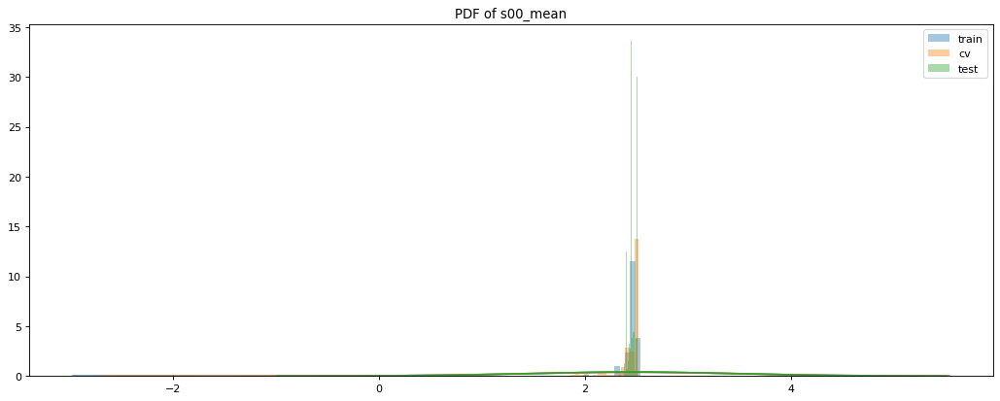

plot for: s00_std


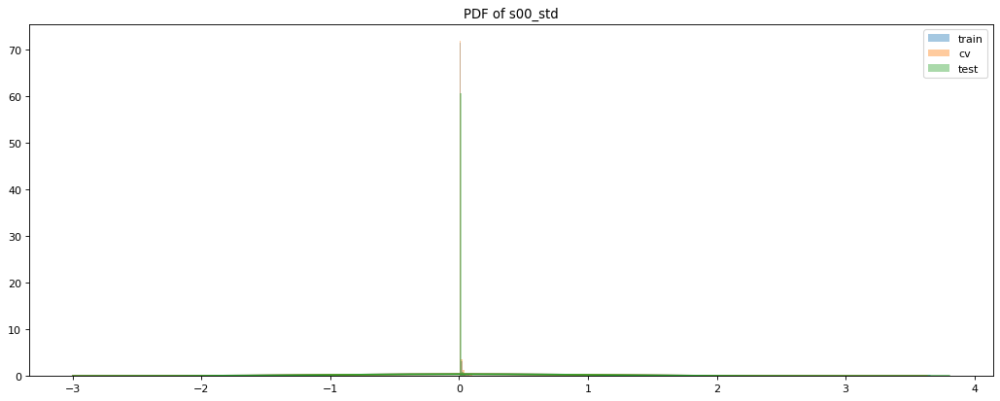

plot for: s00_mid


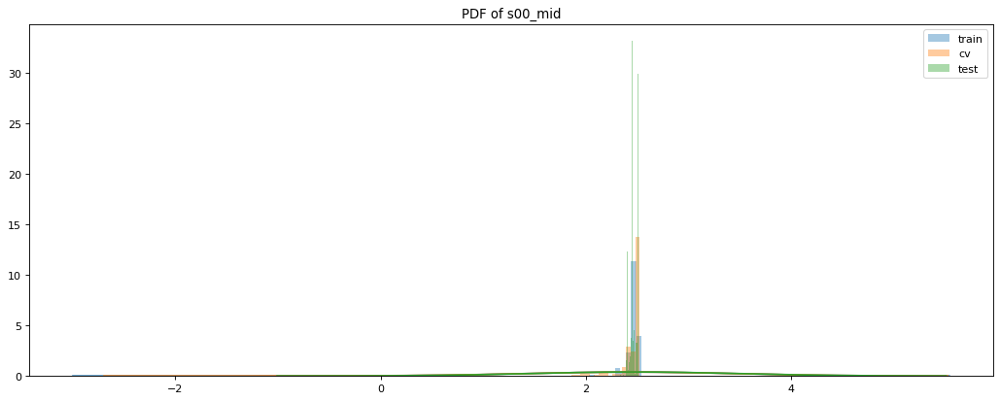

plot for: s00_min


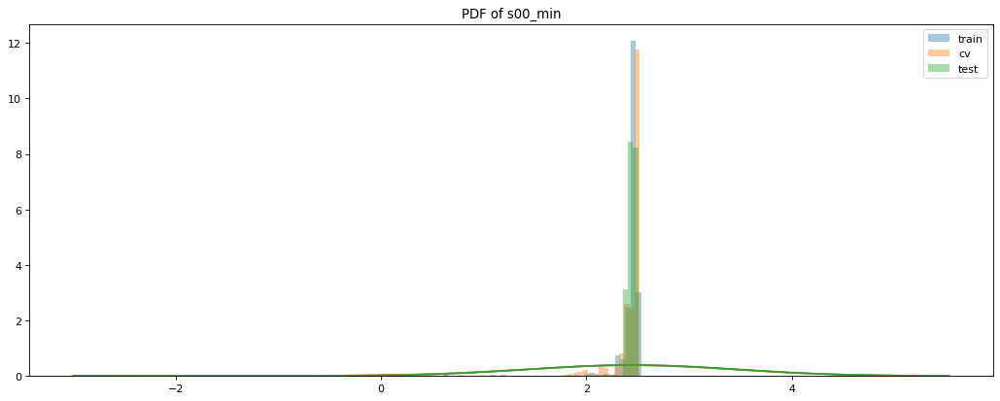

plot for: s00_max


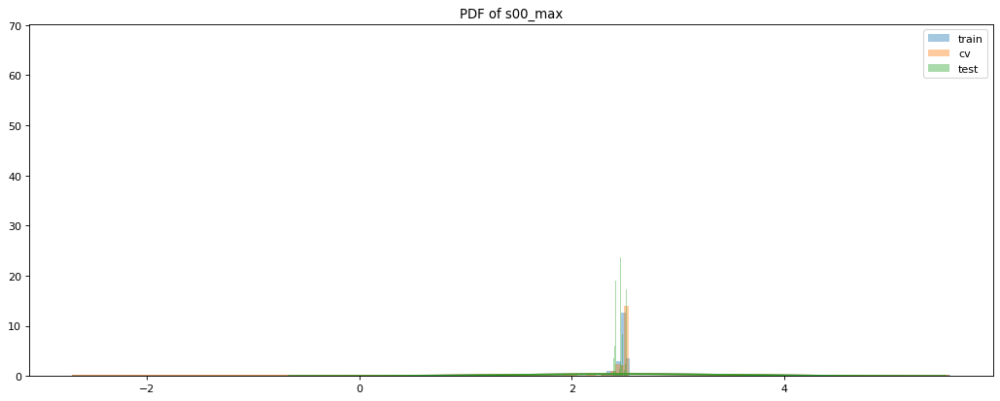

plot for: s01_mean


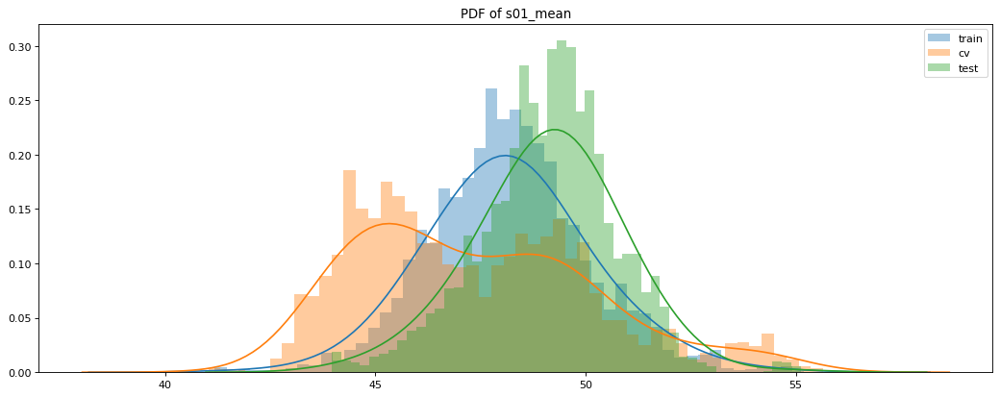

plot for: s01_std


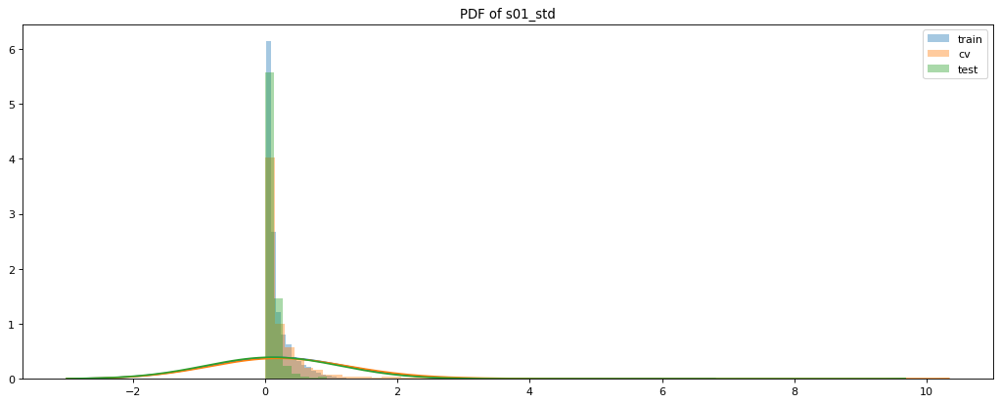

plot for: s01_mid


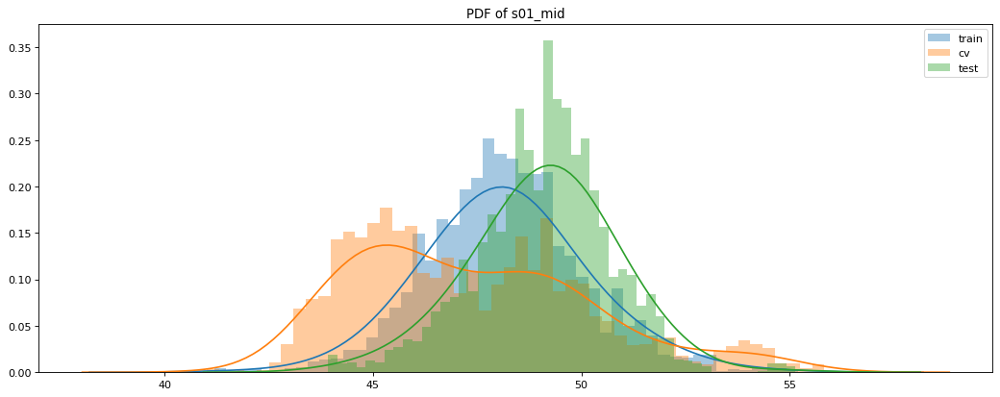

plot for: s01_min


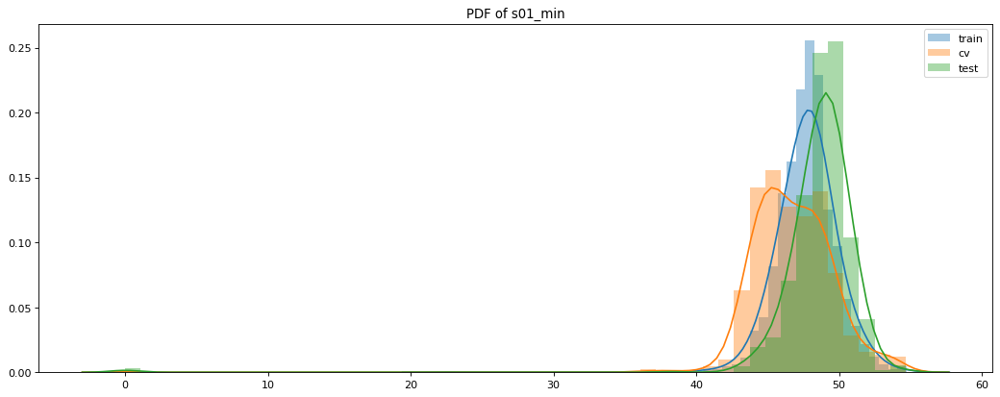

plot for: s01_max


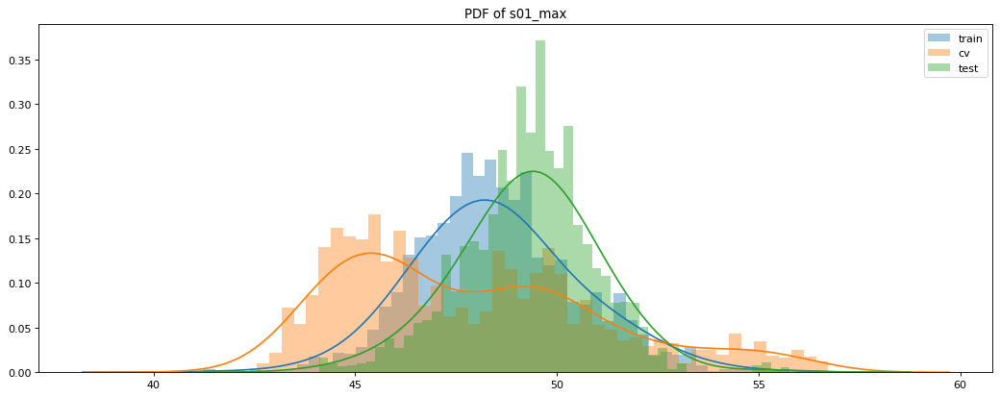

plot for: s02_mean


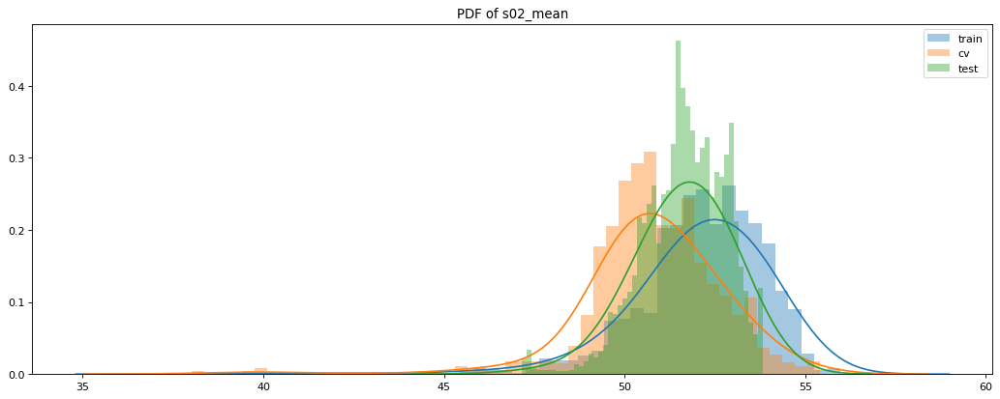

plot for: s02_std


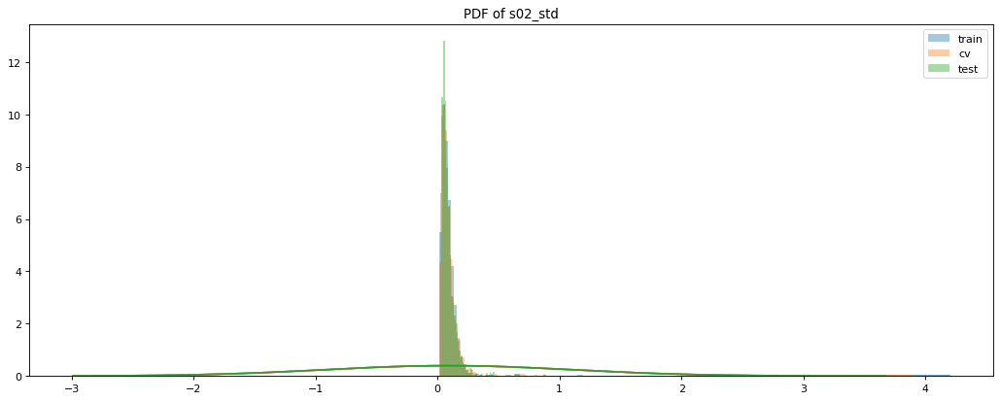

plot for: s02_mid


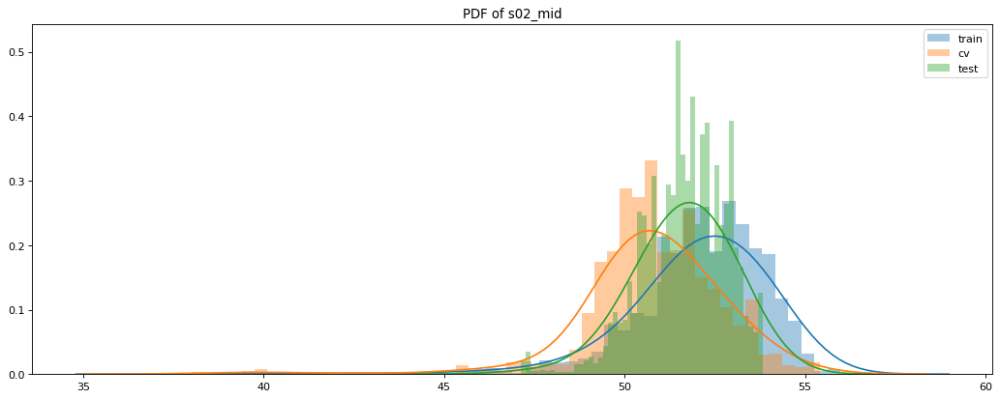

plot for: s02_min


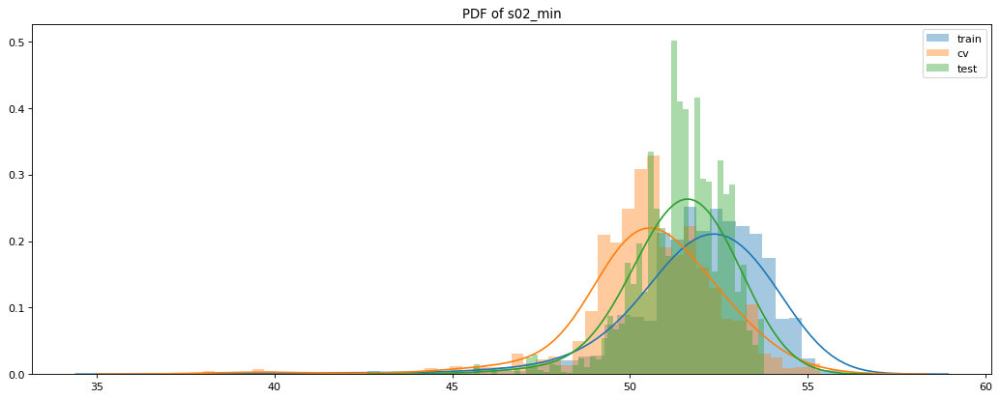

plot for: s02_max


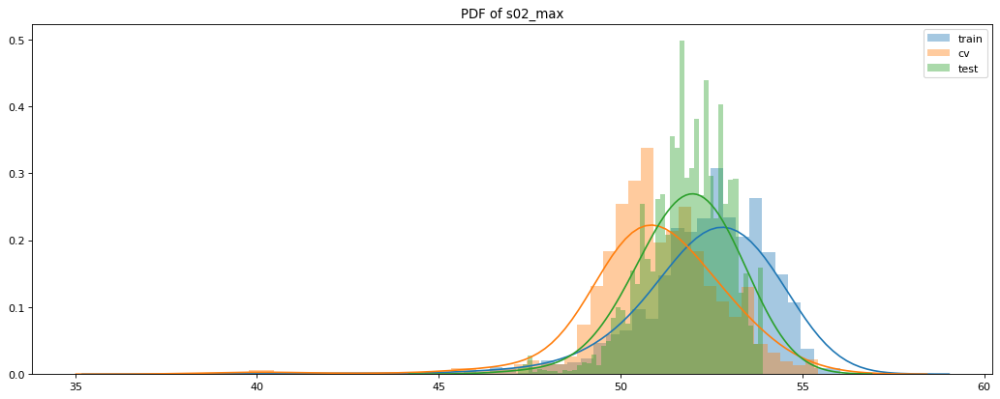

plot for: s03_mean


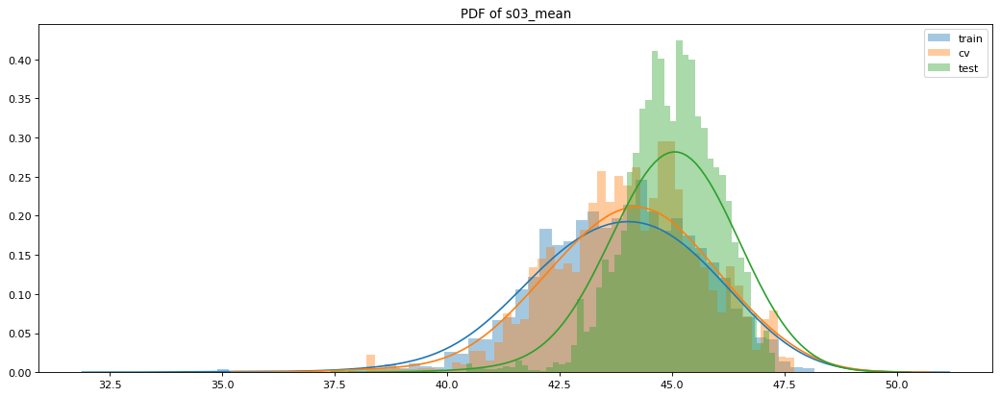

plot for: s03_std


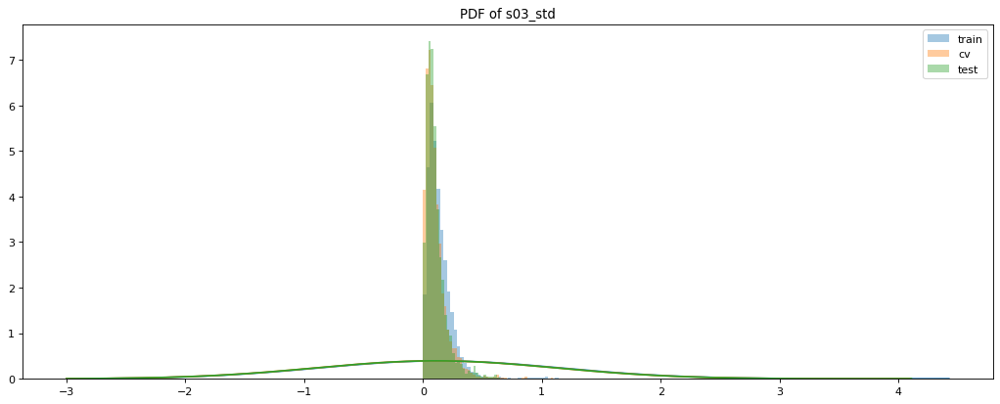

plot for: s03_mid


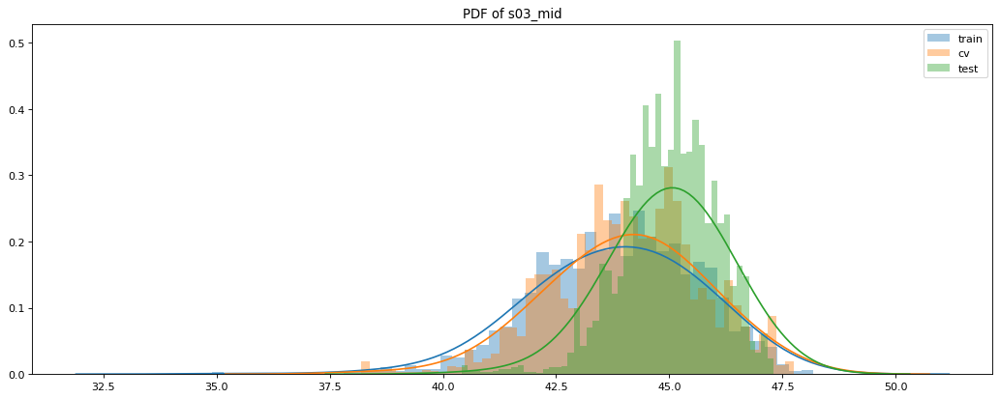

plot for: s03_min


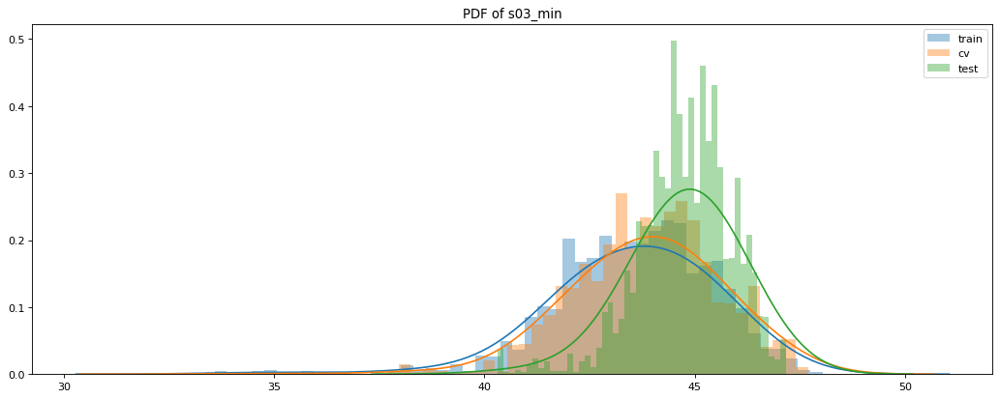

plot for: s03_max


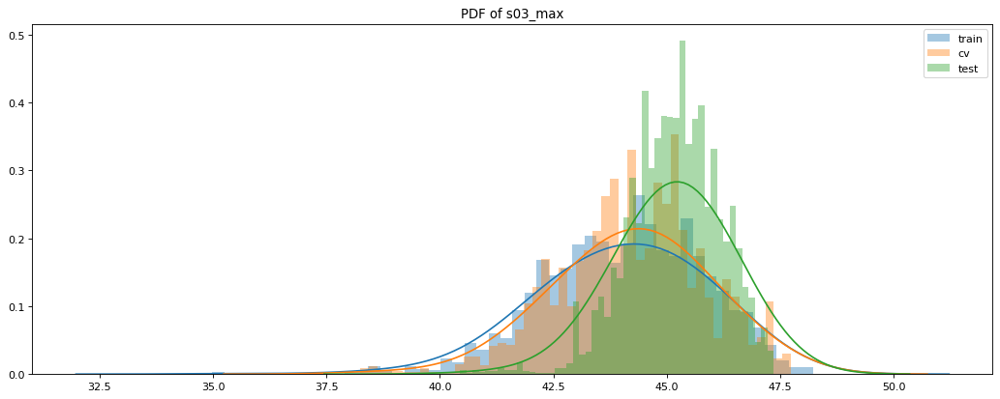

plot for: s04_mean


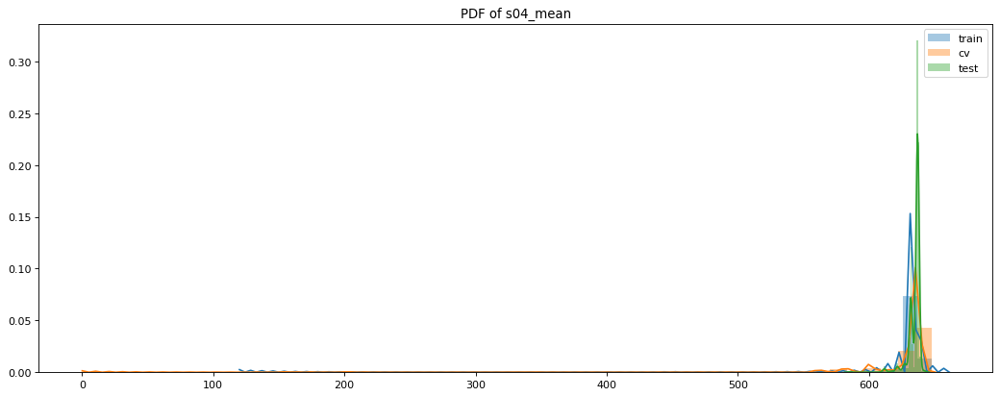

plot for: s04_std


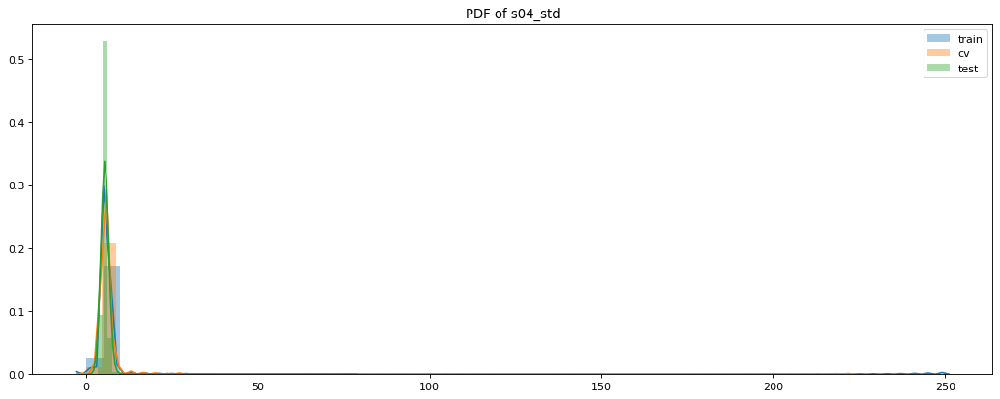

plot for: s04_mid


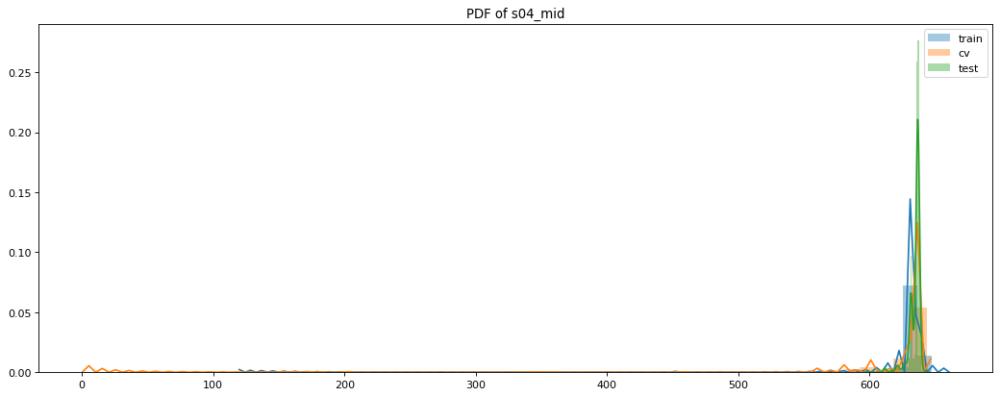

plot for: s04_min


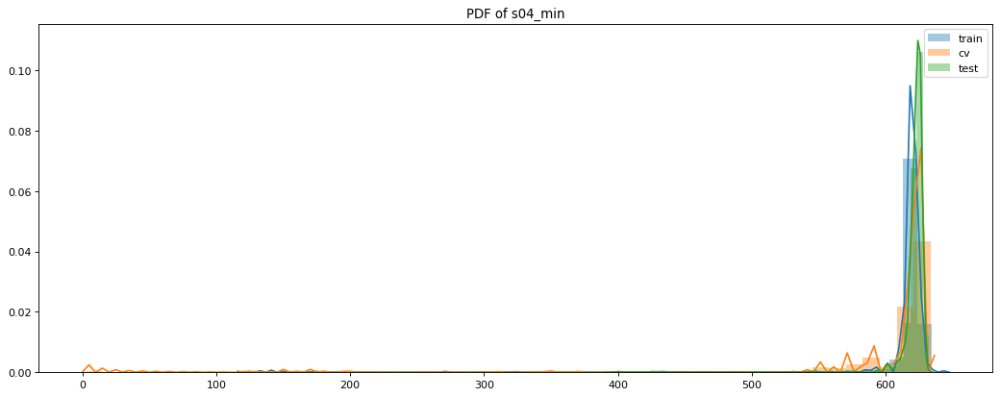

plot for: s04_max


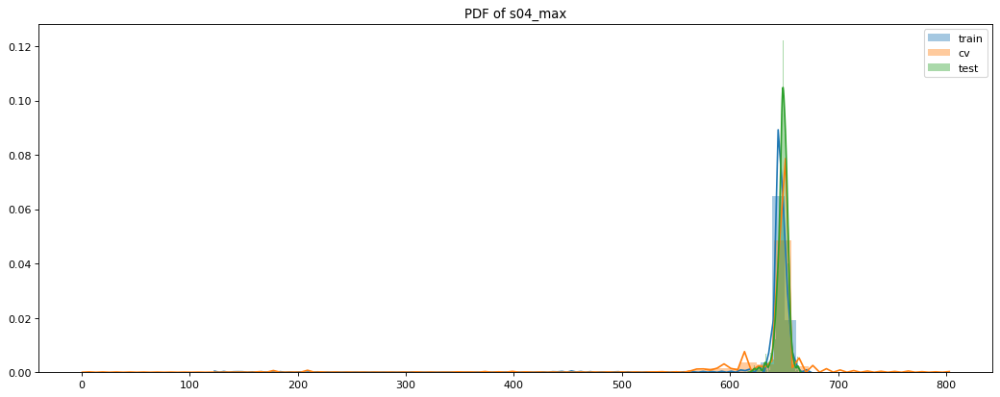

plot for: s05_mean


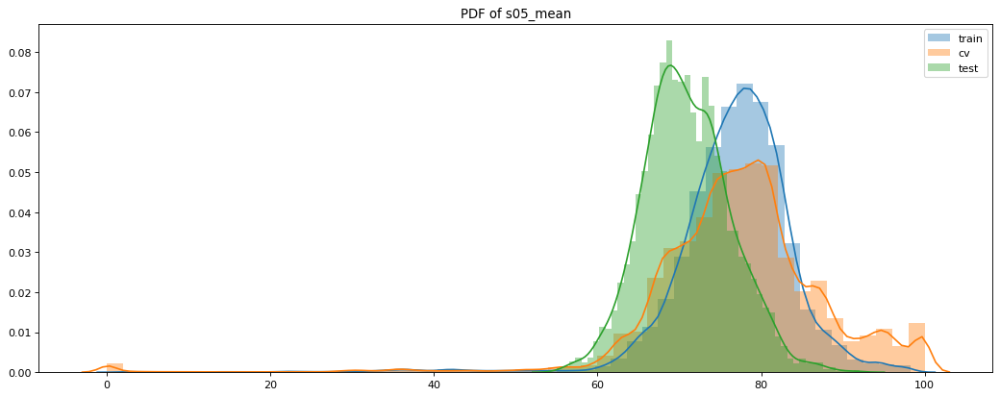

plot for: s05_std


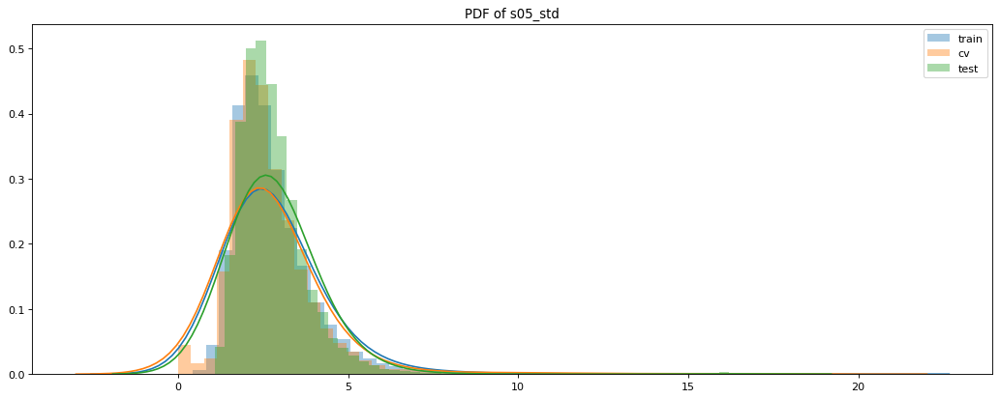

plot for: s05_mid


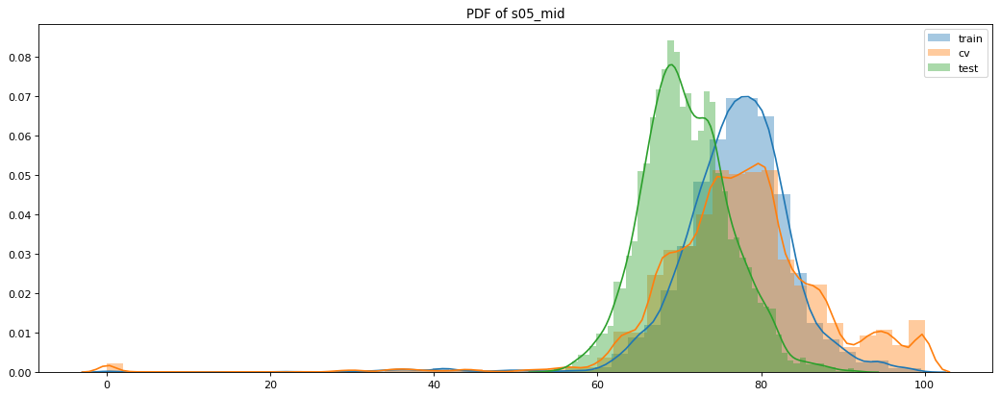

plot for: s05_min


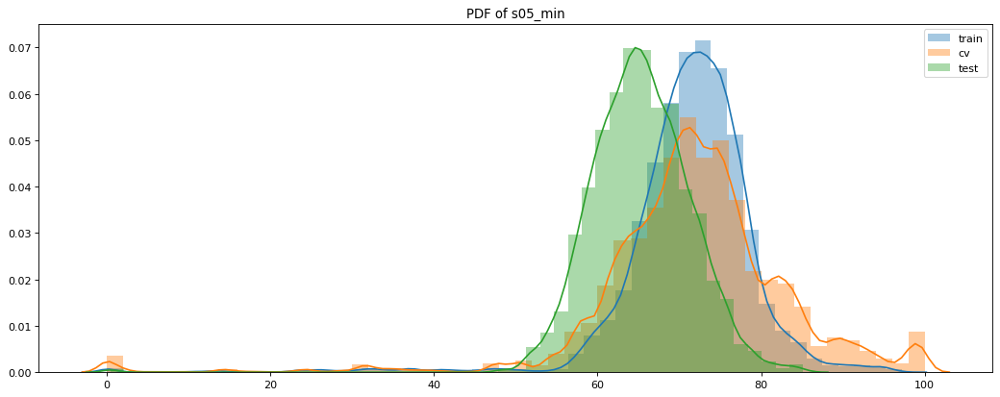

plot for: s05_max


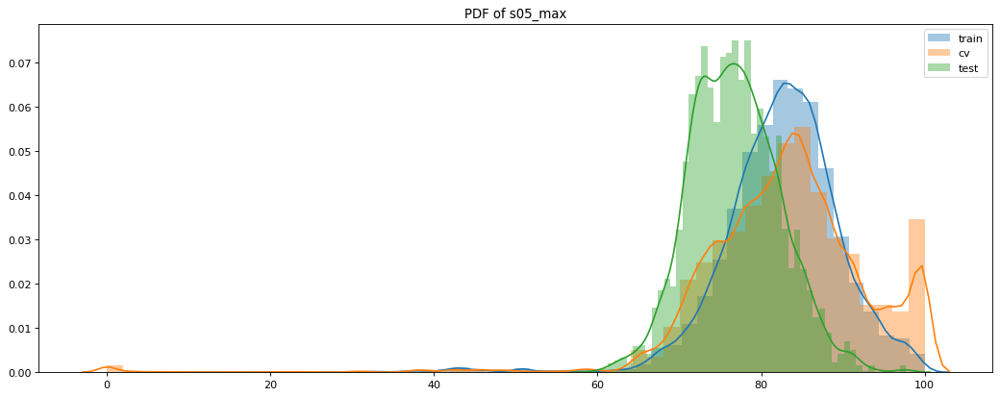

plot for: s06_mean


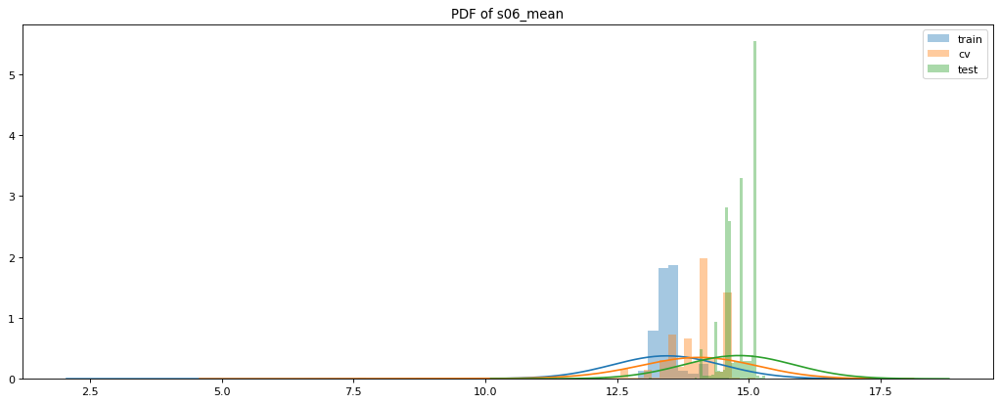

plot for: s06_std


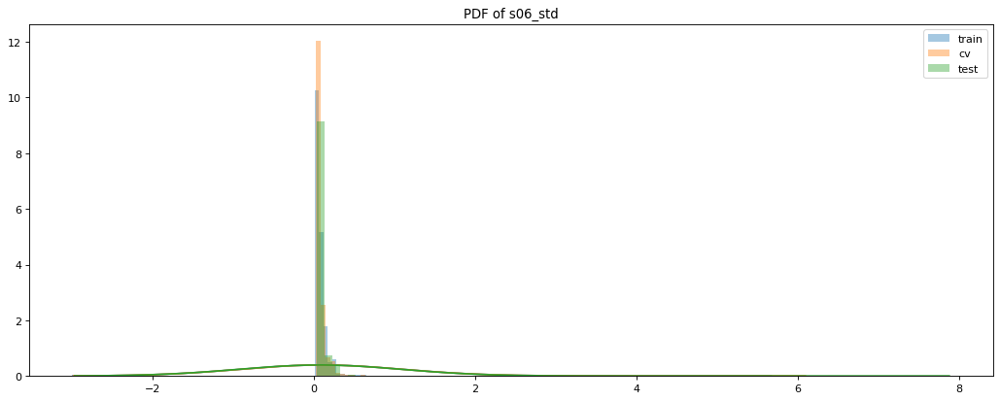

plot for: s06_mid


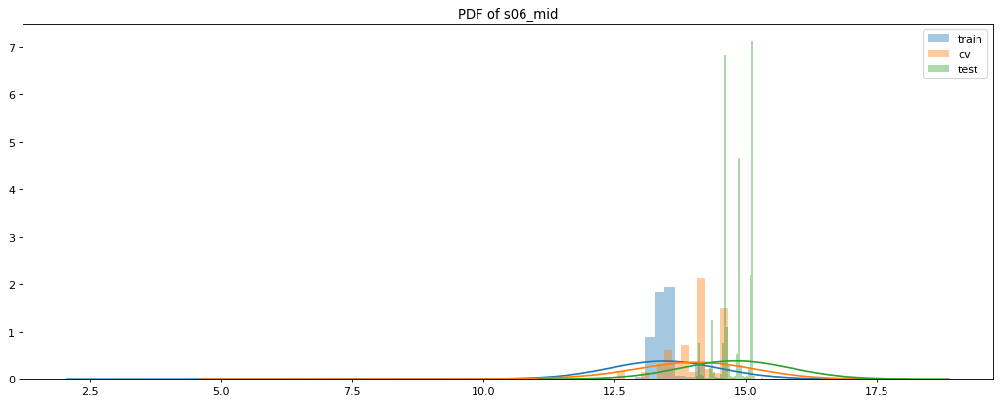

plot for: s06_min


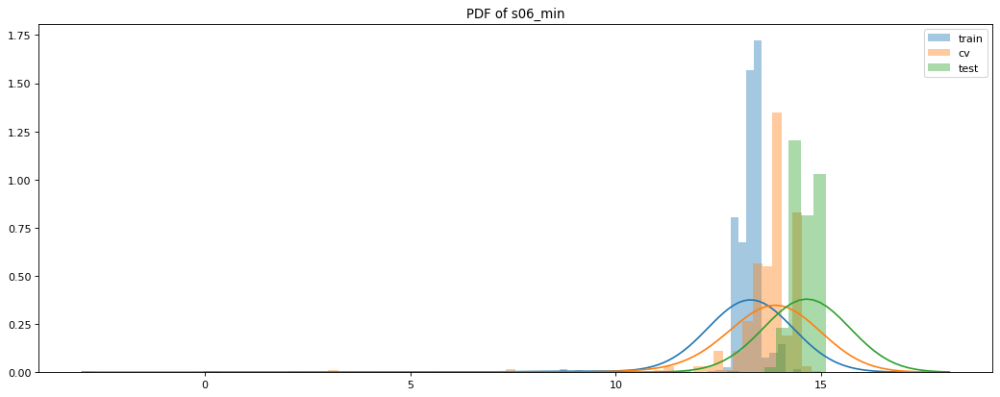

plot for: s06_max


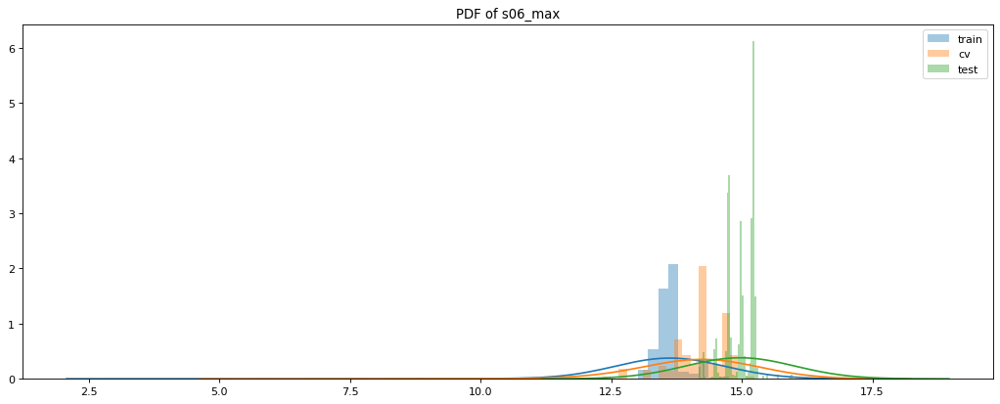

plot for: s07_mean


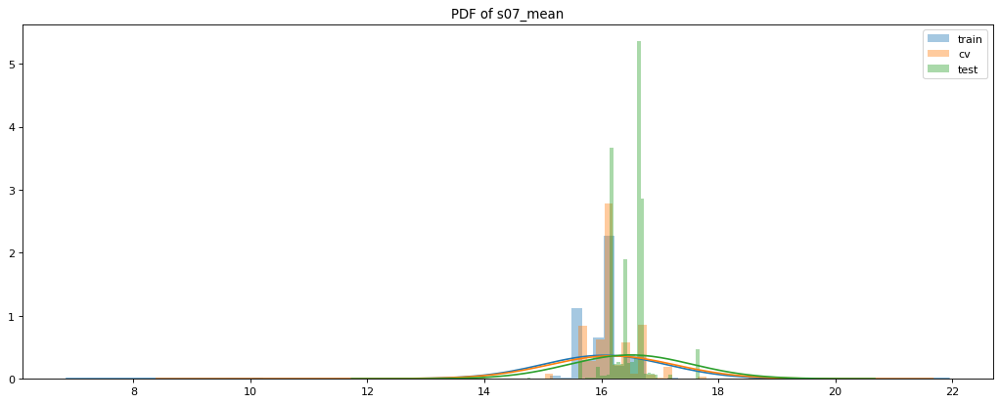

plot for: s07_std


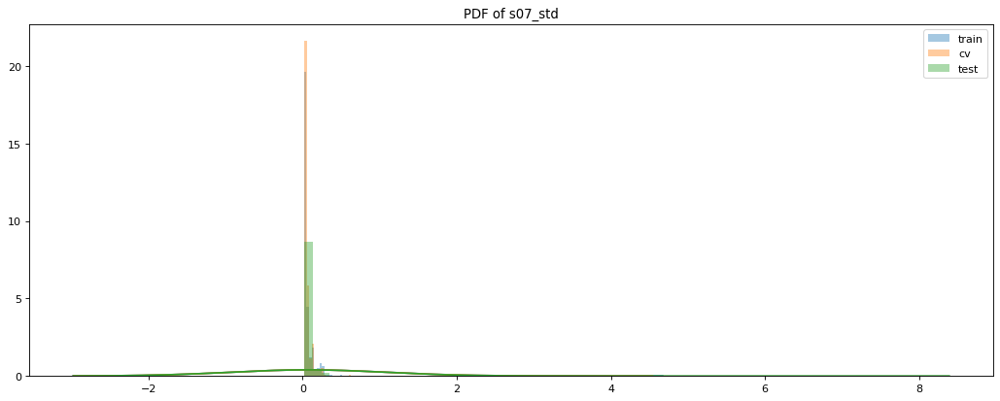

plot for: s07_mid


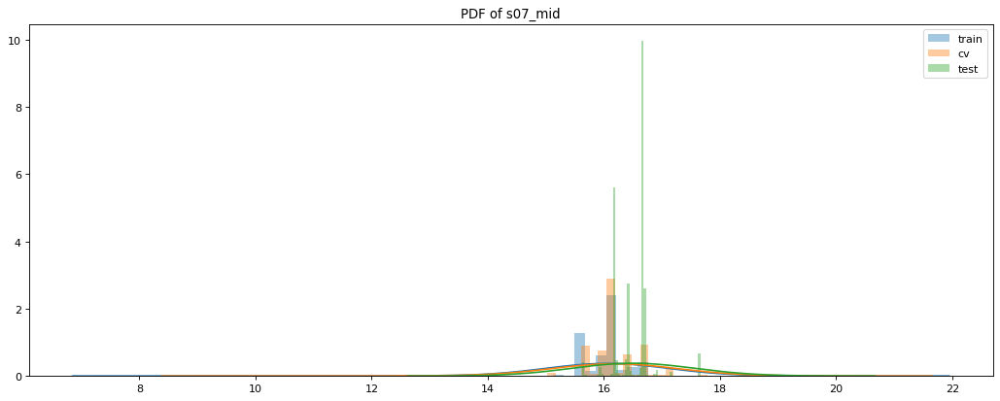

plot for: s07_min


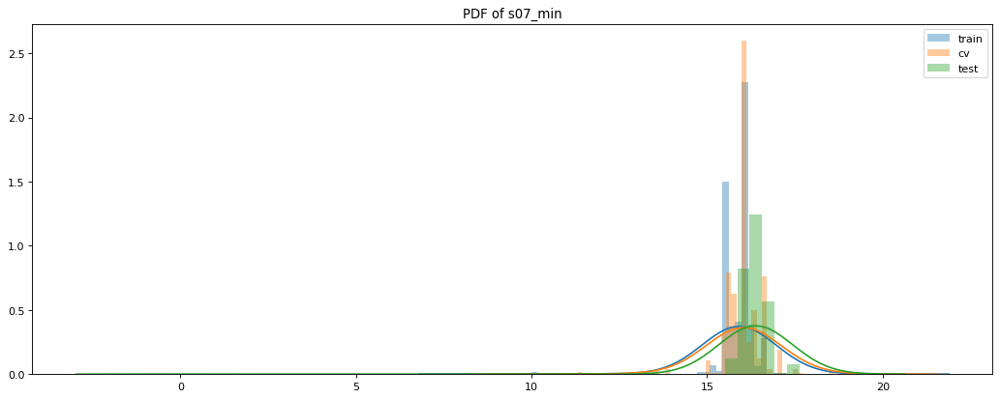

plot for: s07_max


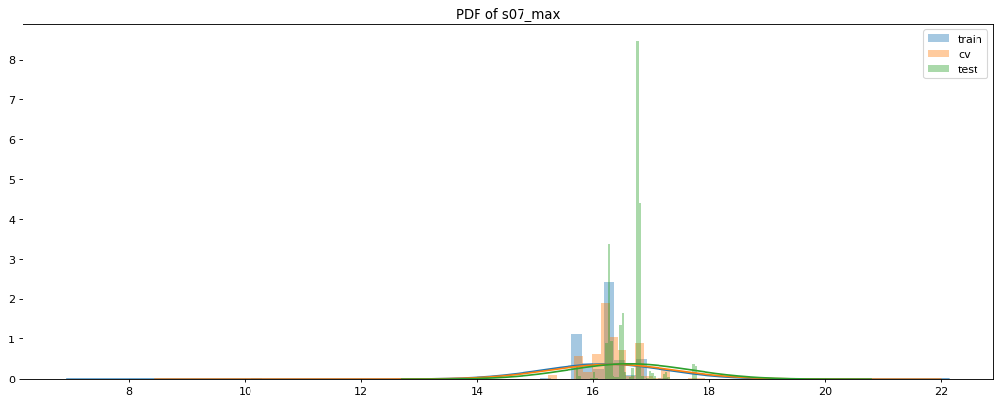

plot for: s08_mean


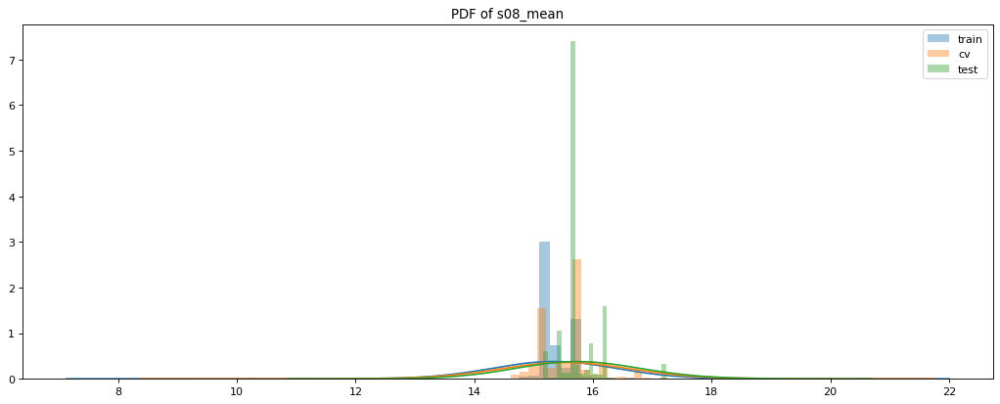

plot for: s08_std


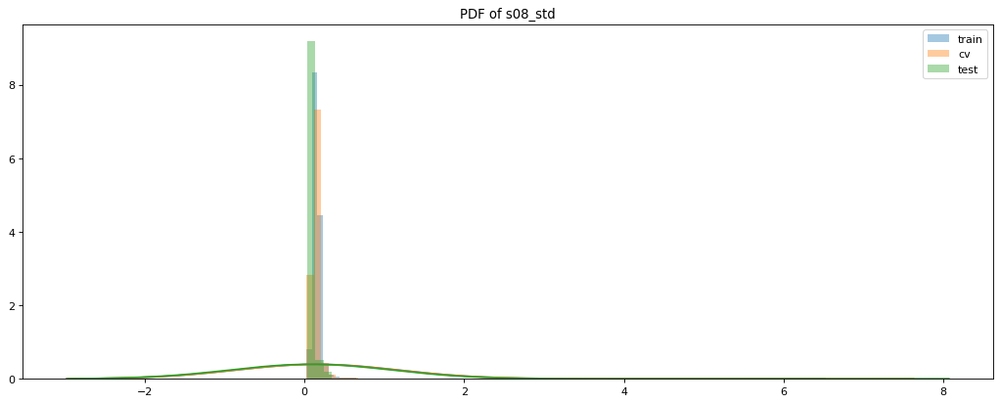

plot for: s08_mid


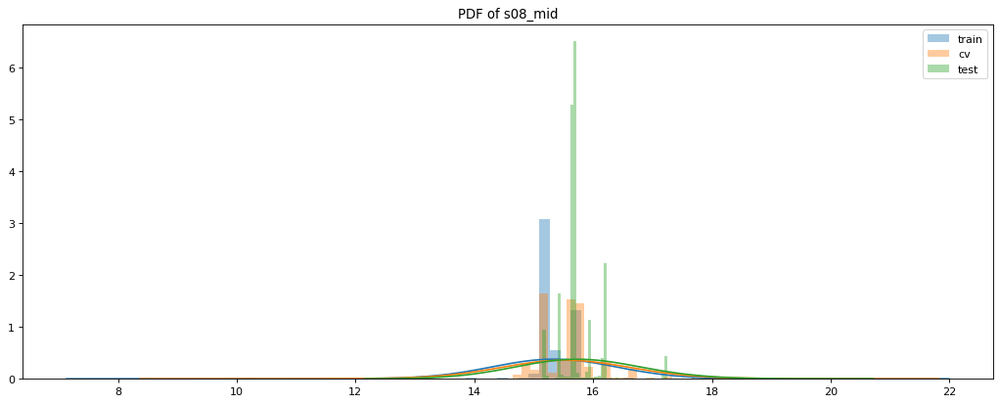

plot for: s08_min


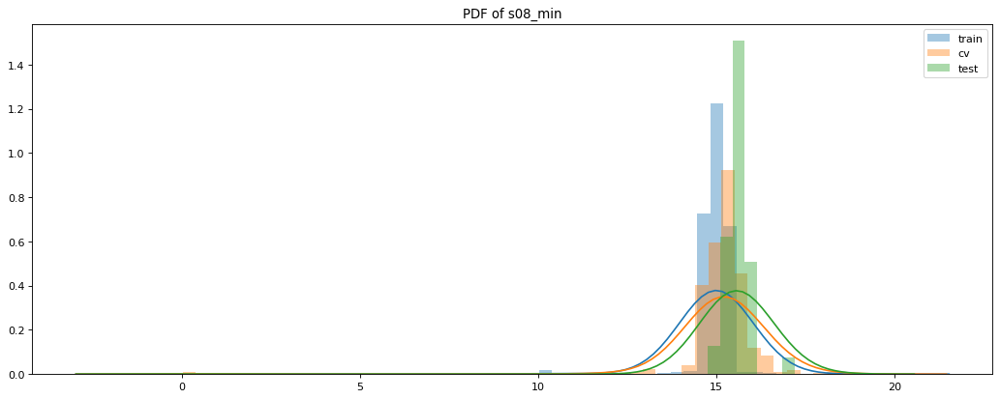

plot for: s08_max


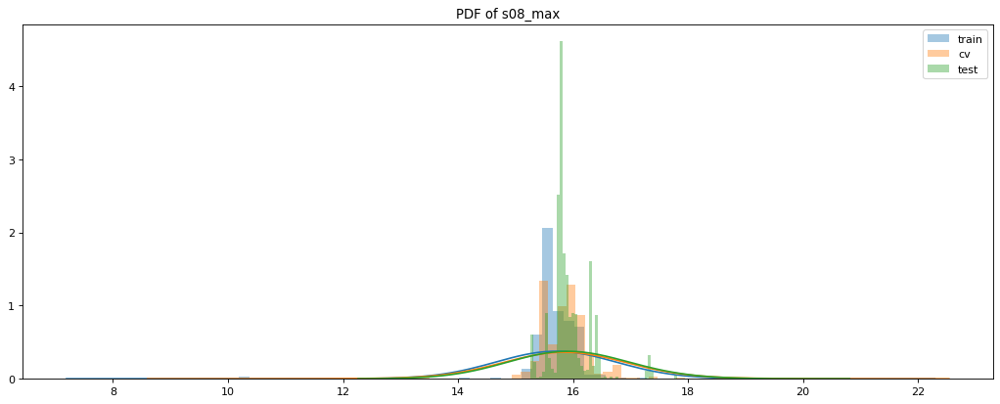

plot for: s09_mean


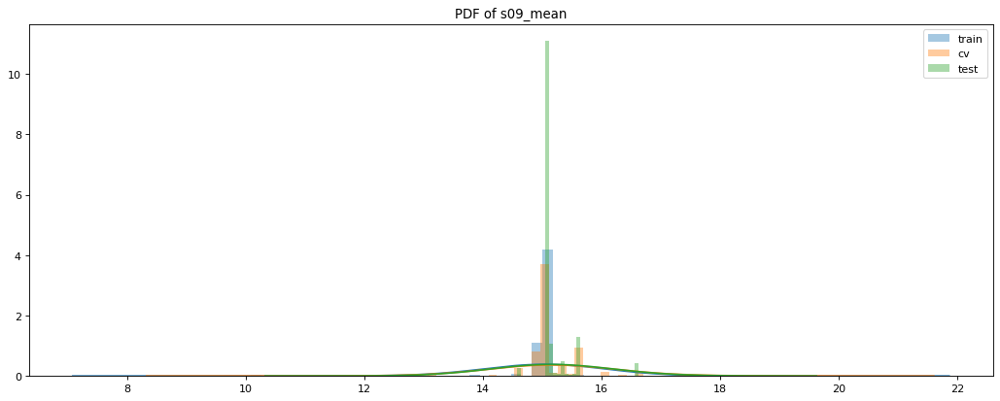

plot for: s09_std


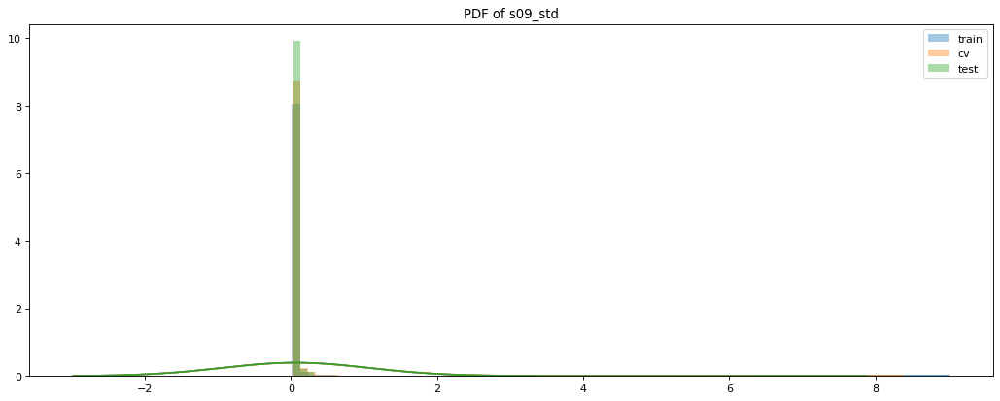

plot for: s09_mid


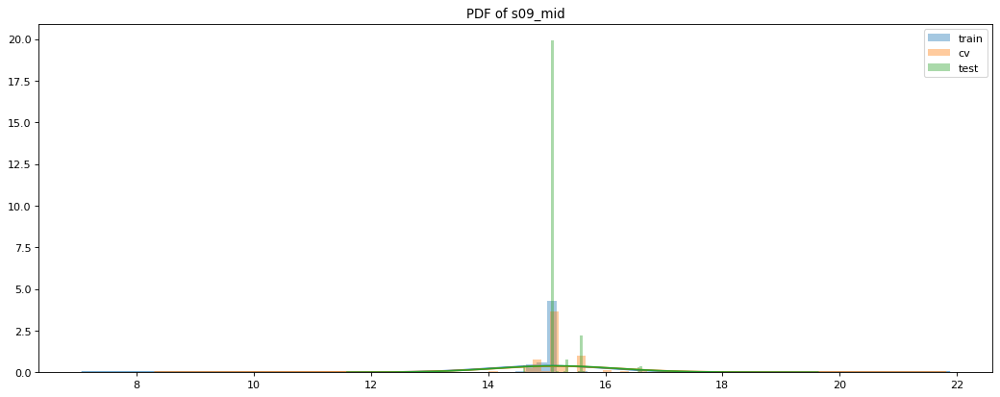

plot for: s09_min


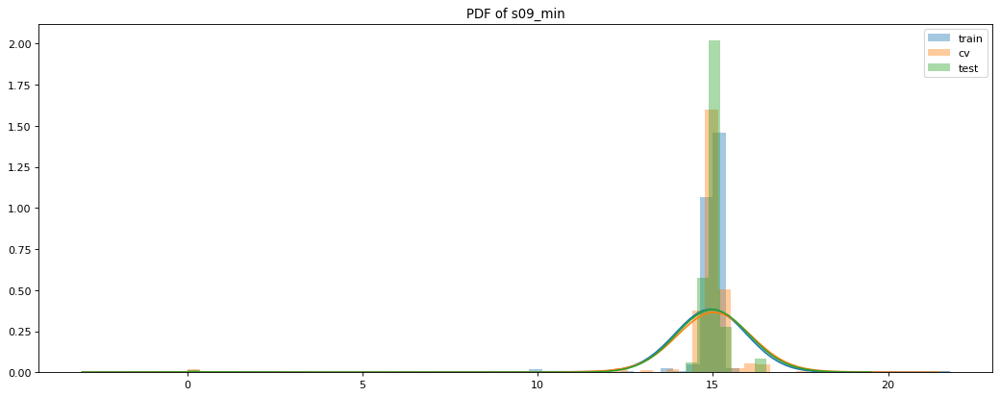

plot for: s09_max


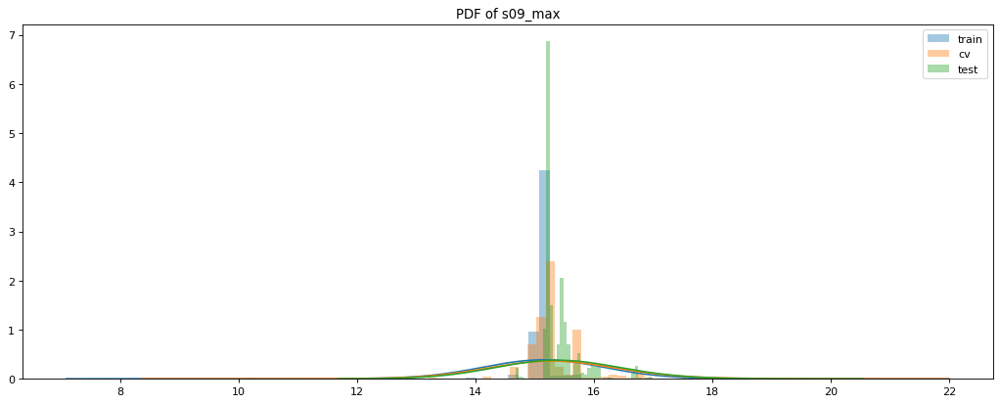

plot for: s10_mean


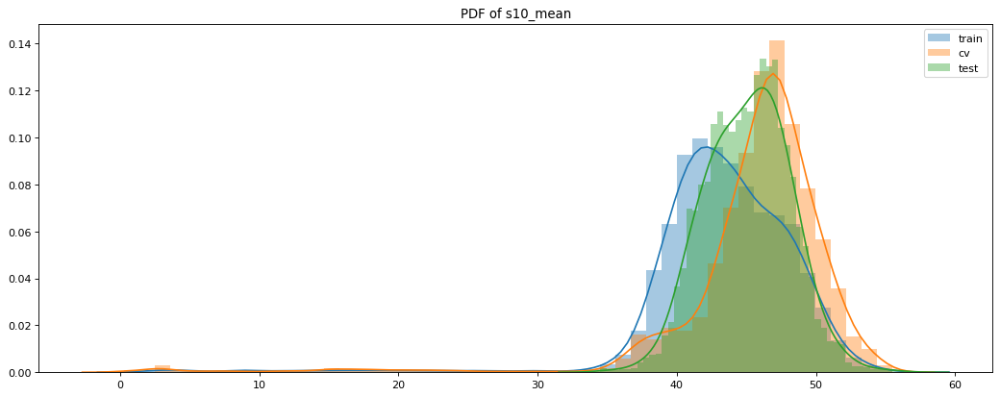

plot for: s10_std


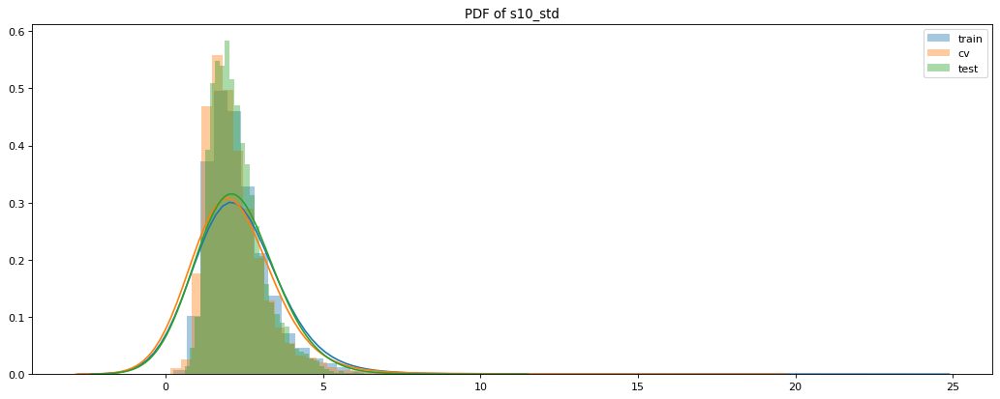

plot for: s10_mid


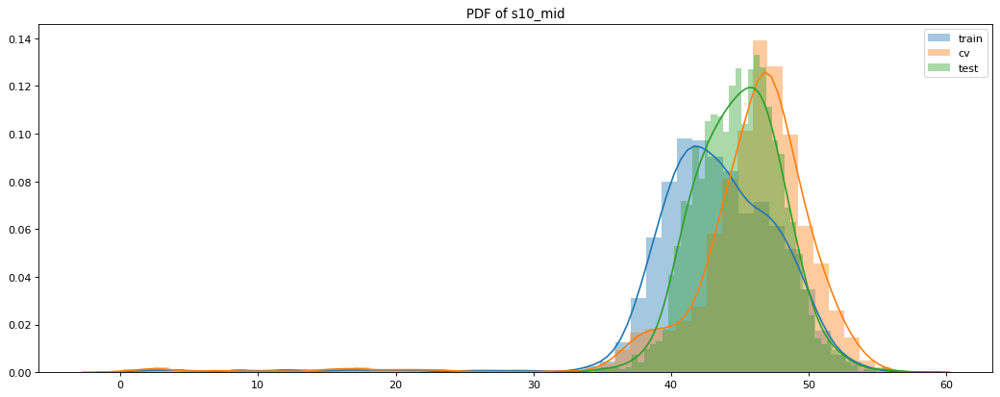

plot for: s10_min


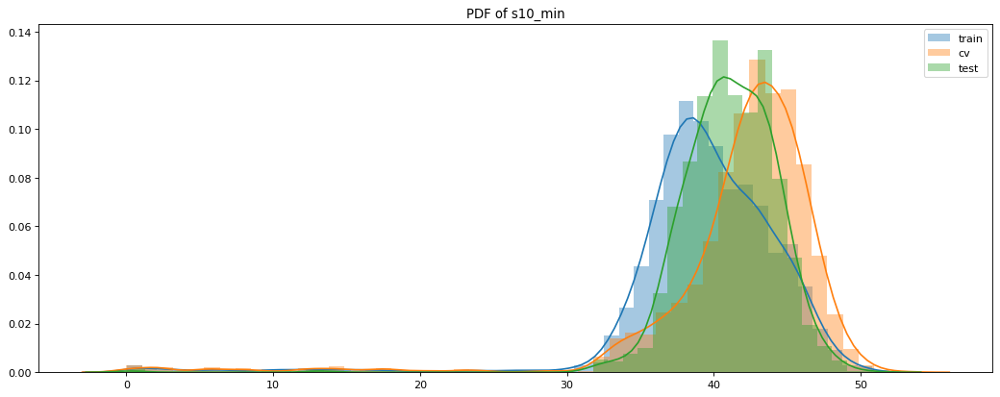

plot for: s10_max


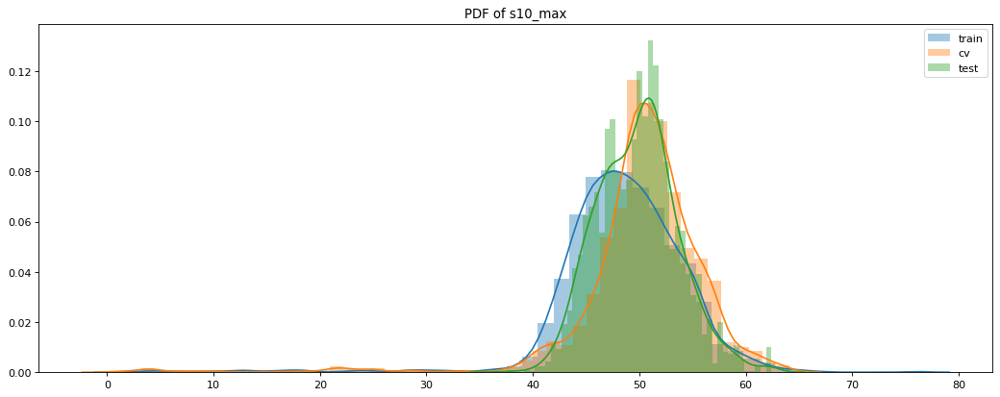

plot for: s11_mean


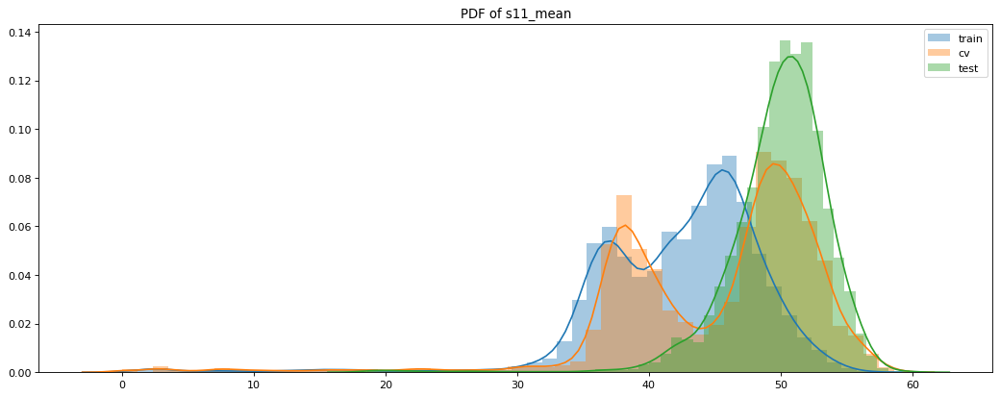

plot for: s11_std


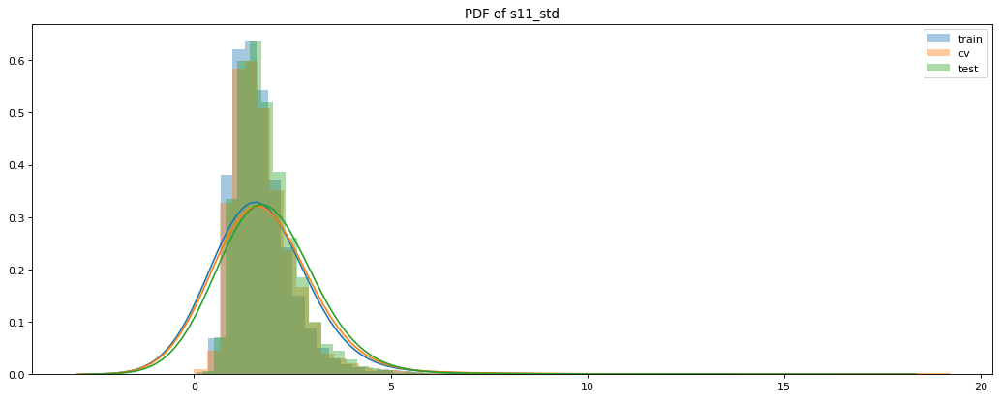

plot for: s11_mid


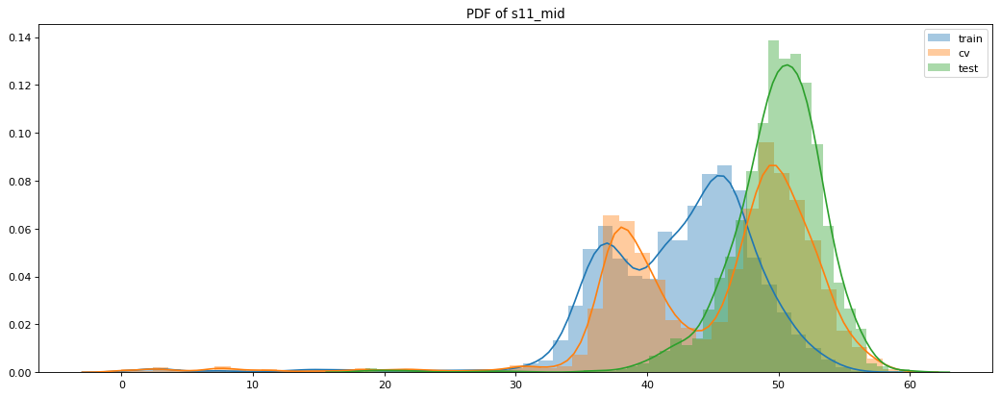

plot for: s11_min


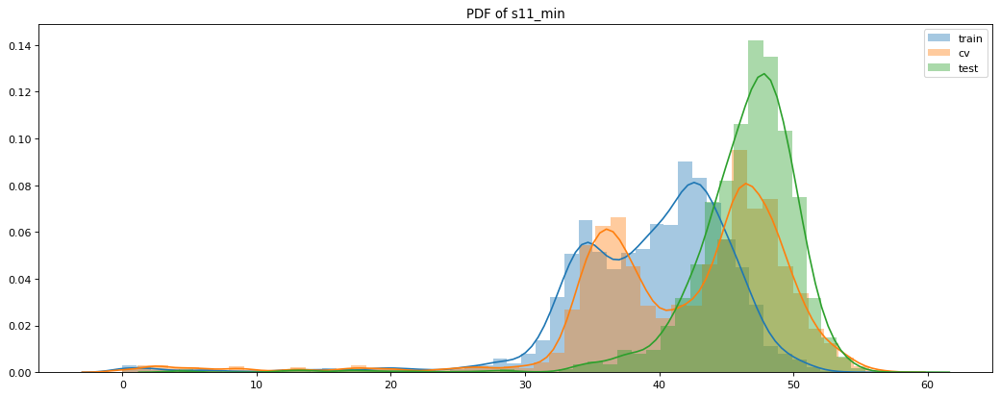

plot for: s11_max


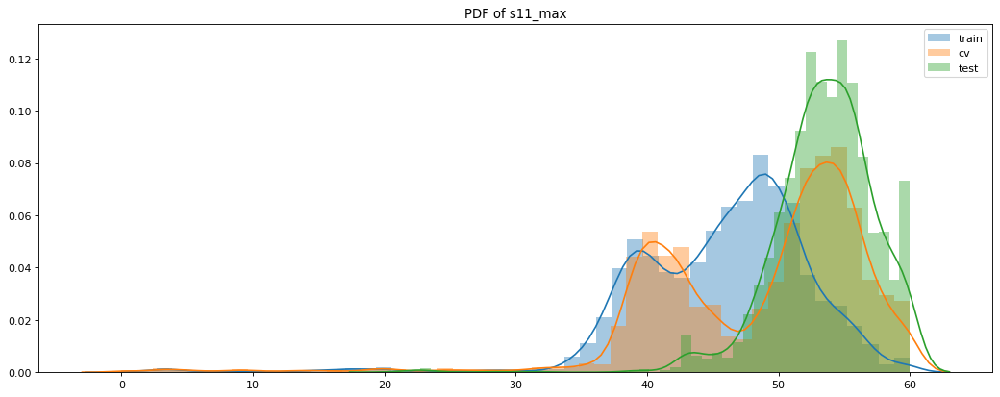

plot for: s12_mean


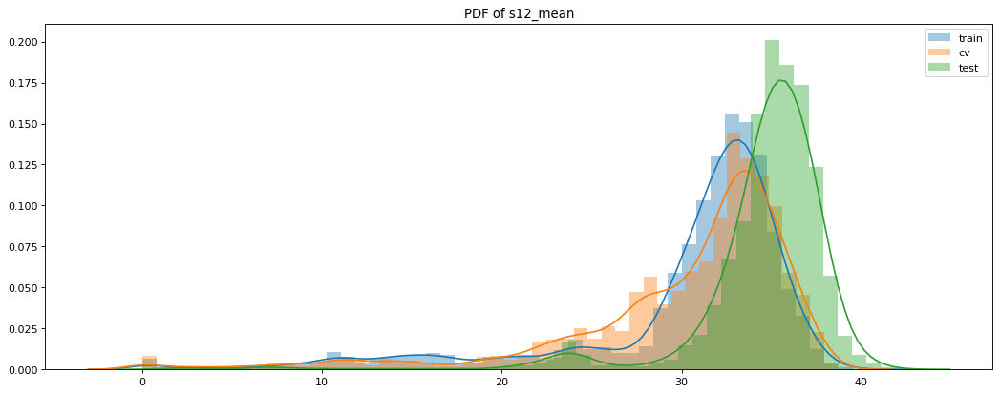

plot for: s12_std


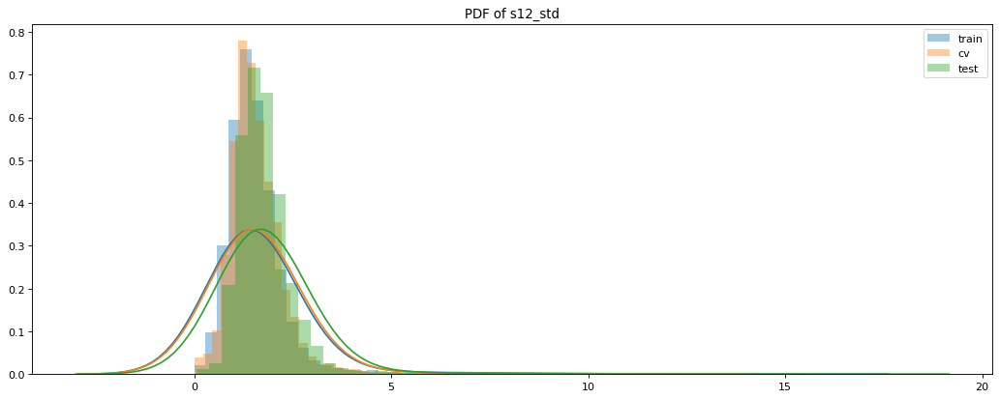

plot for: s12_mid


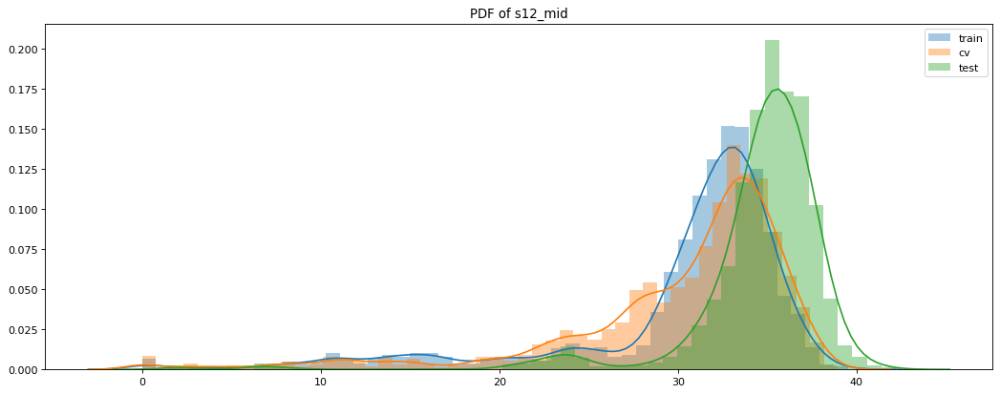

plot for: s12_min


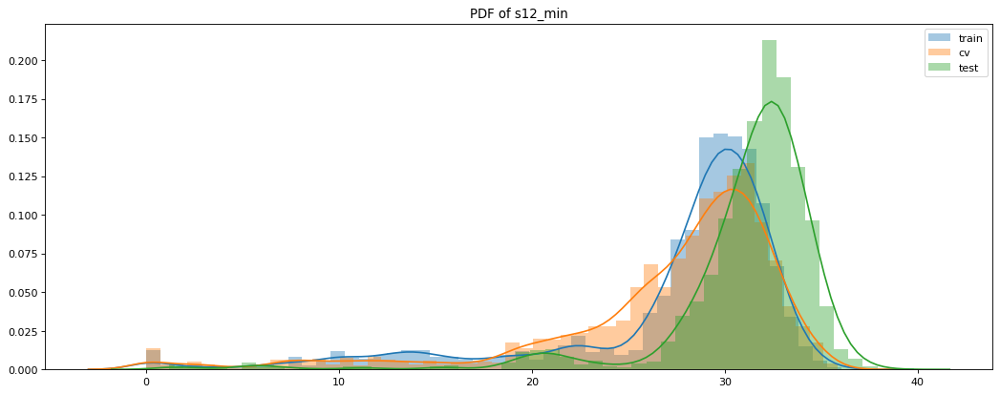

plot for: s12_max


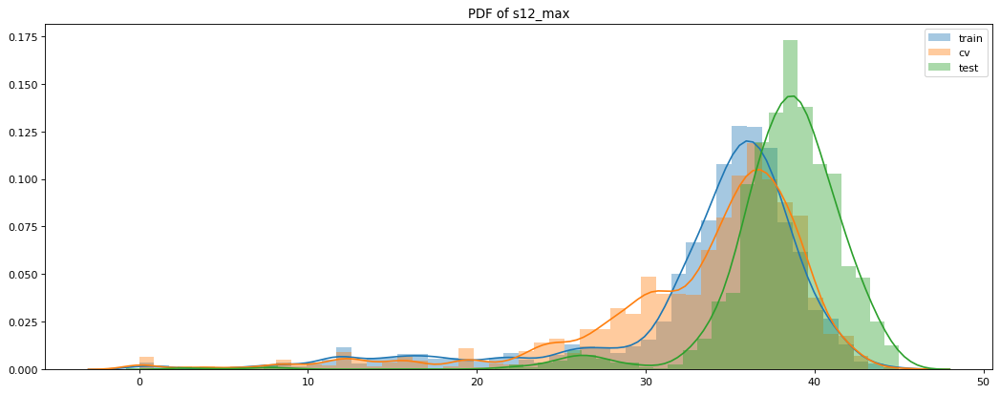

plot for: s13_mean


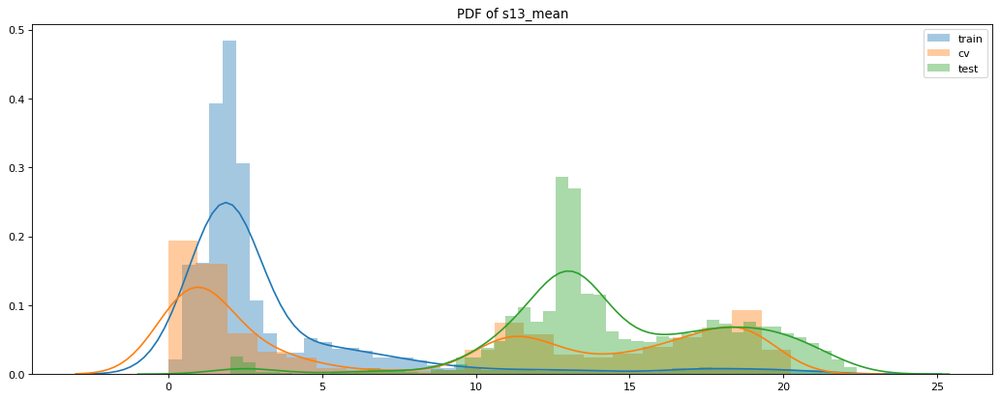

plot for: s13_std


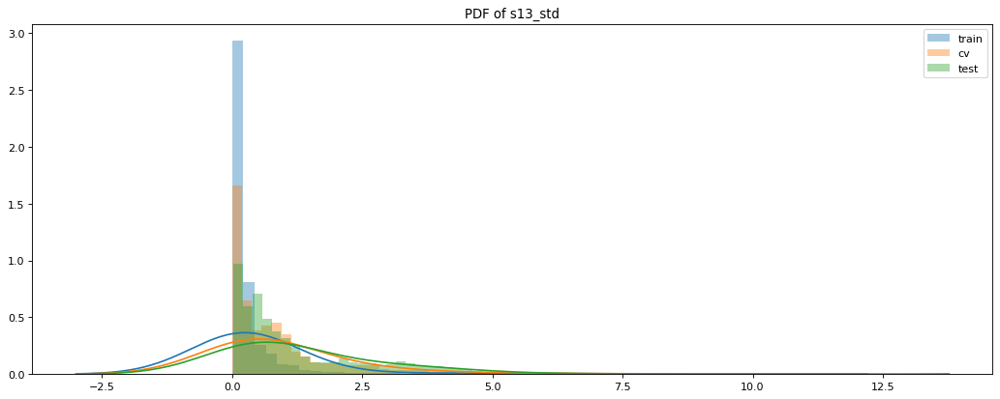

plot for: s13_mid


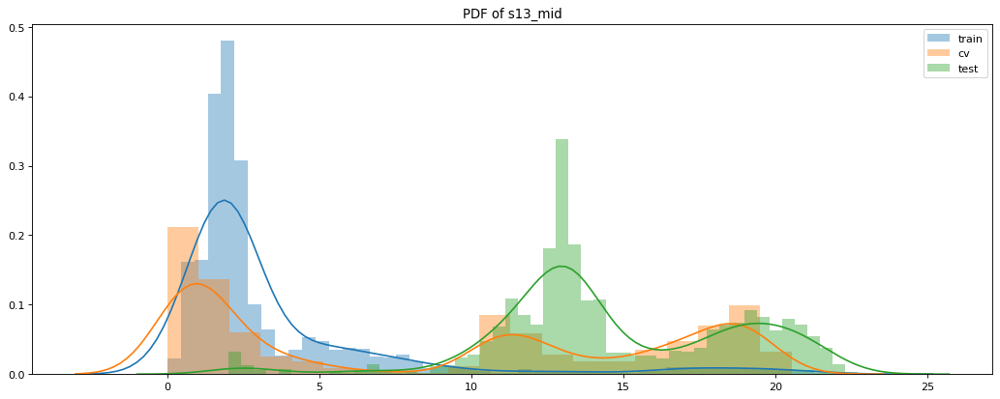

plot for: s13_min


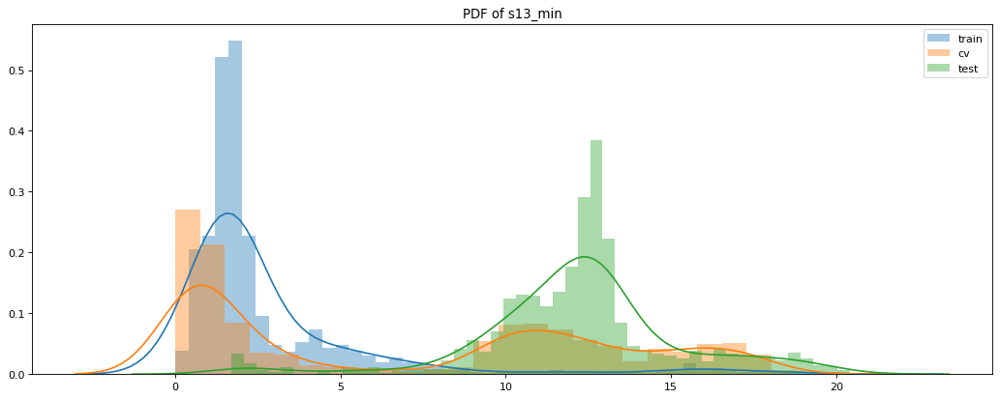

plot for: s13_max


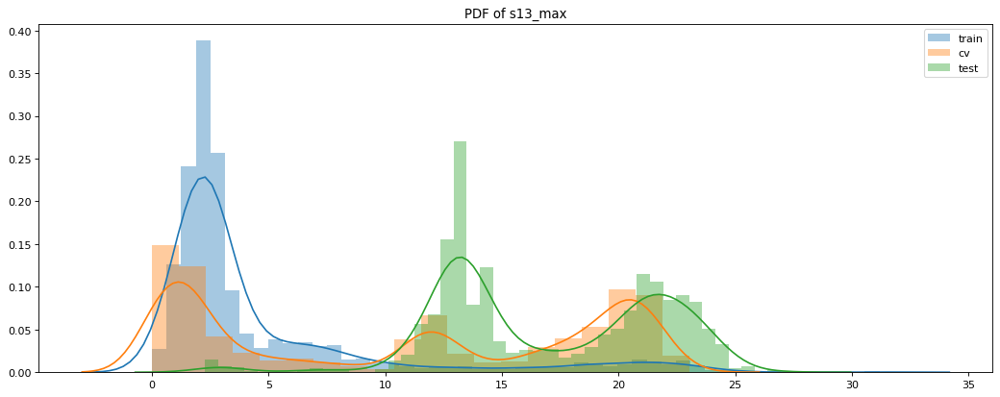

plot for: s14_mean


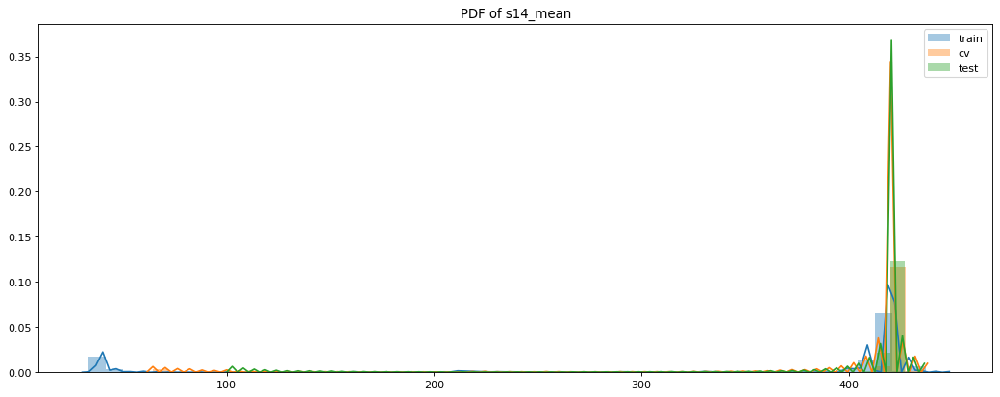

plot for: s14_std


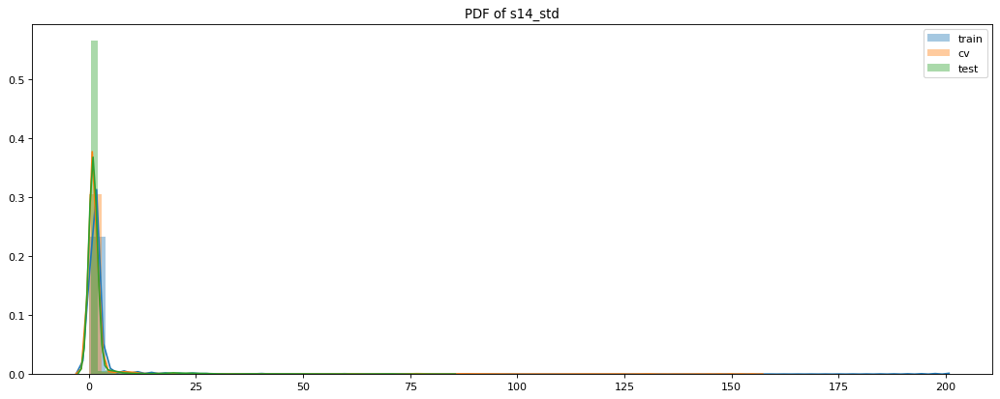

plot for: s14_mid


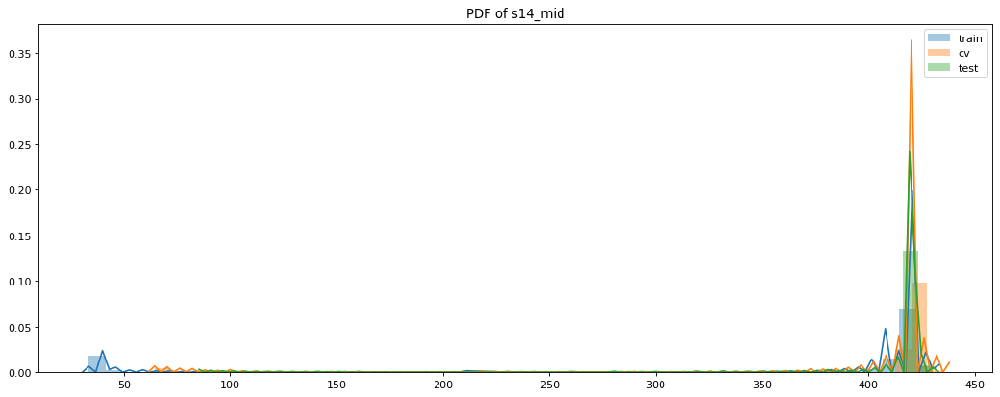

plot for: s14_min


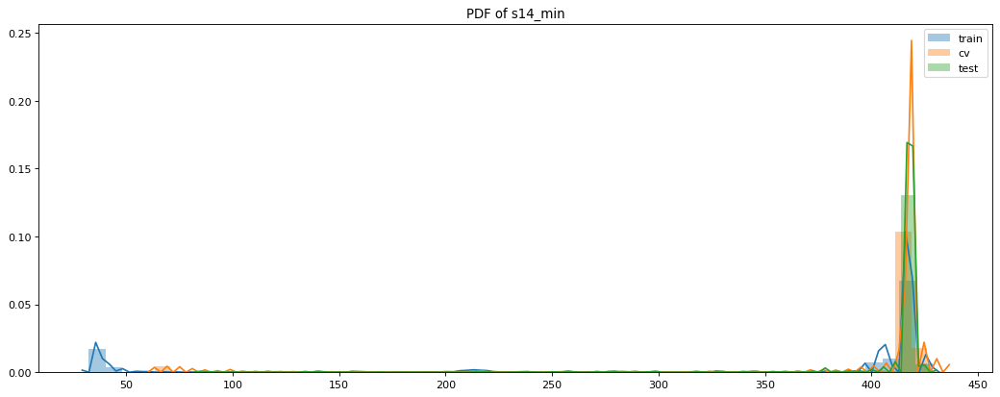

plot for: s14_max


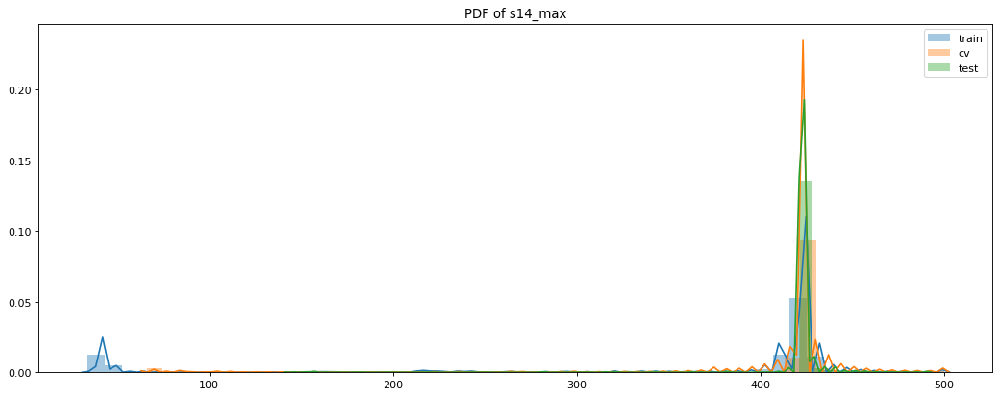

plot for: s16_mean


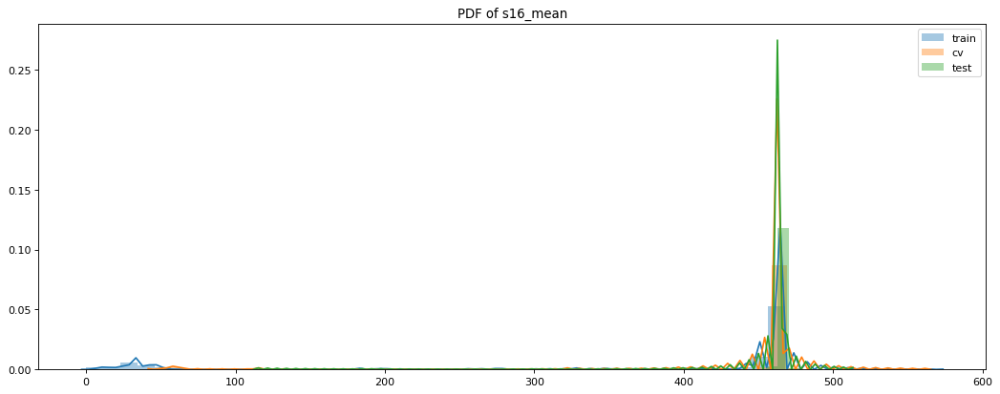

plot for: s16_std


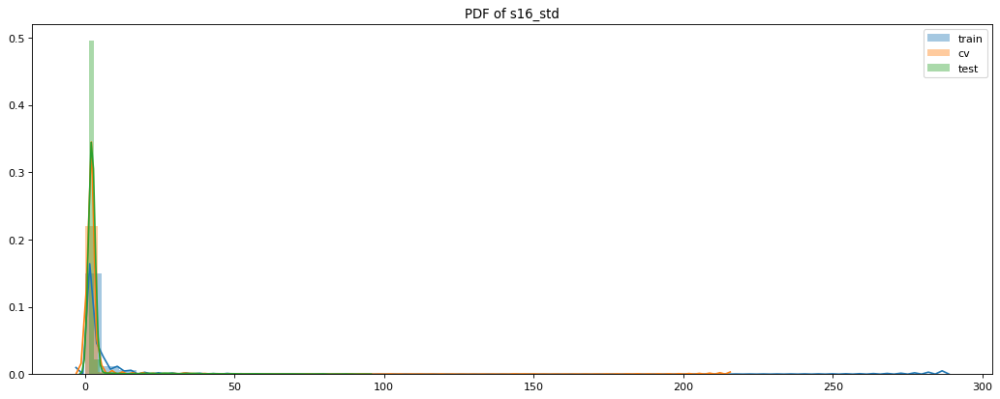

plot for: s16_mid


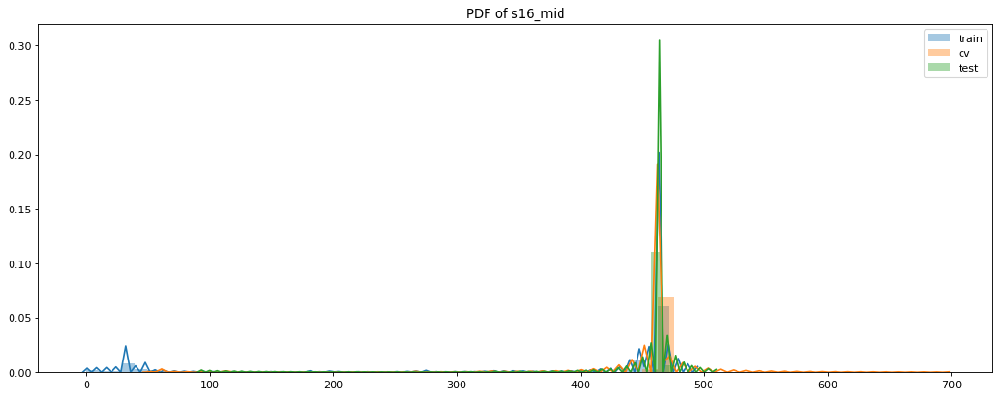

plot for: s16_min


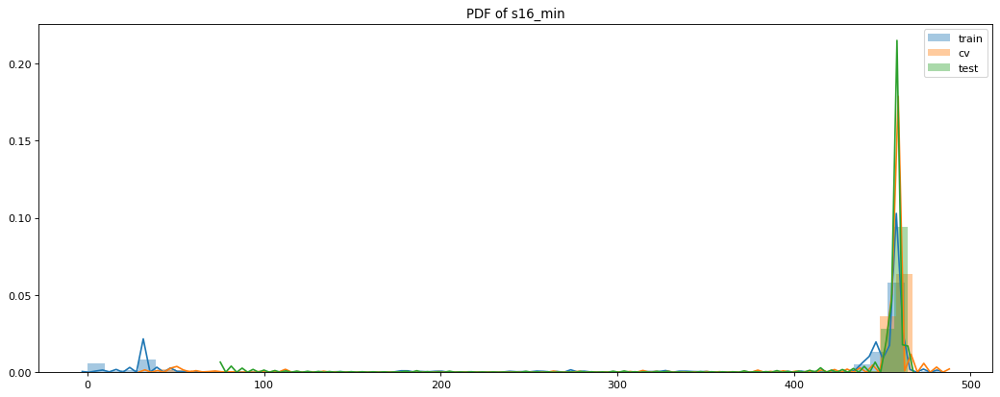

plot for: s16_max


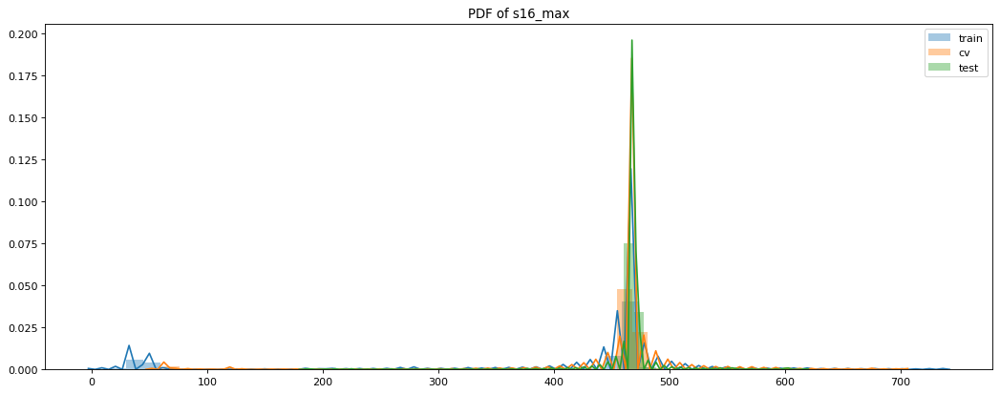

plot for: s17_mean


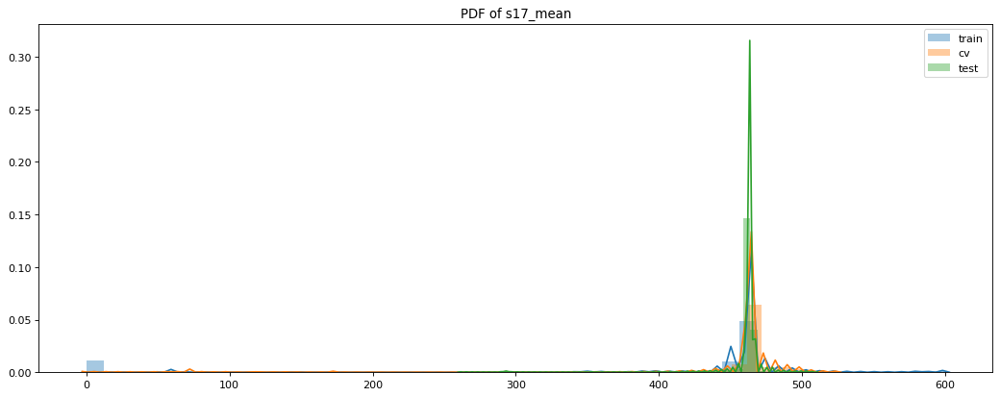

plot for: s17_std


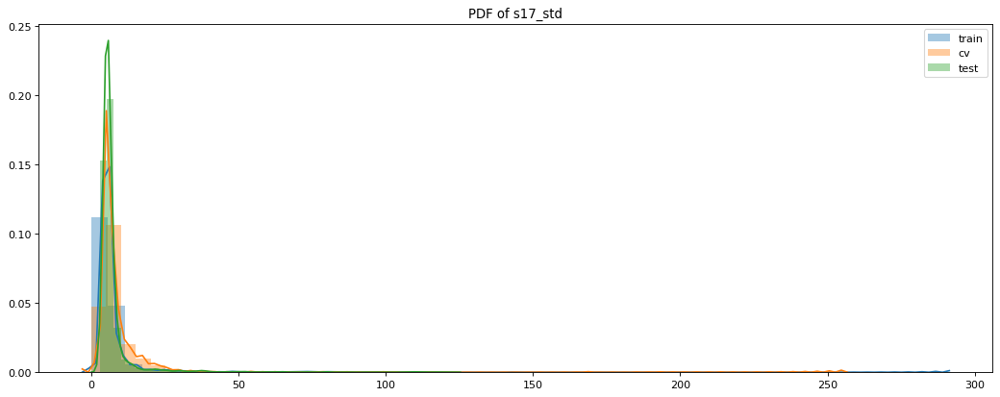

plot for: s17_mid


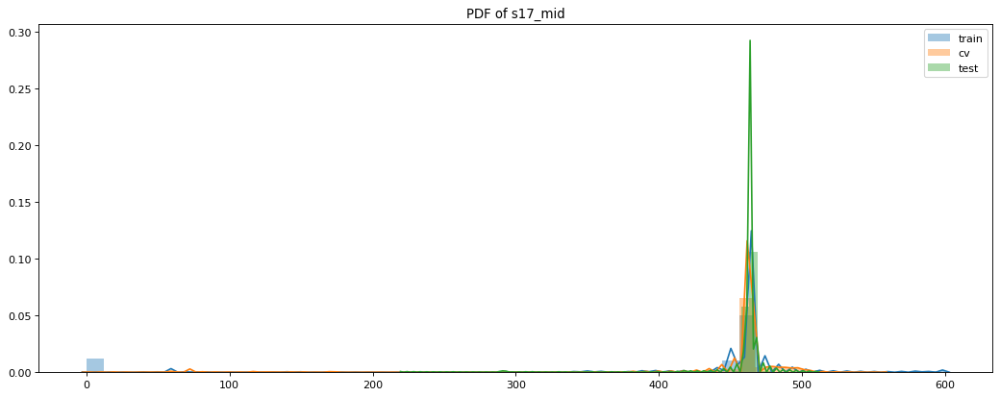

plot for: s17_min


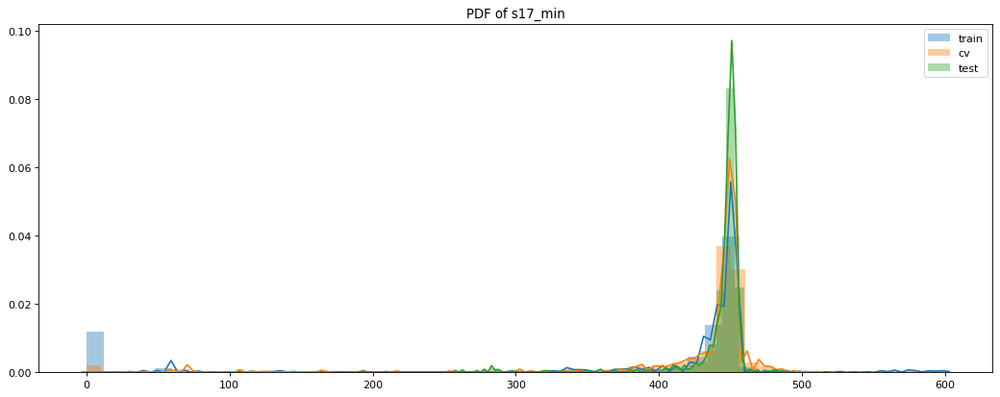

plot for: s17_max


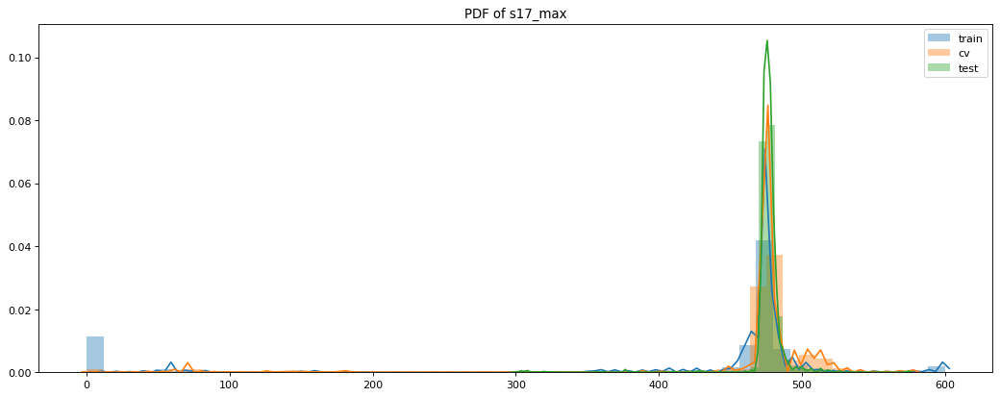

plot for: s18_mean


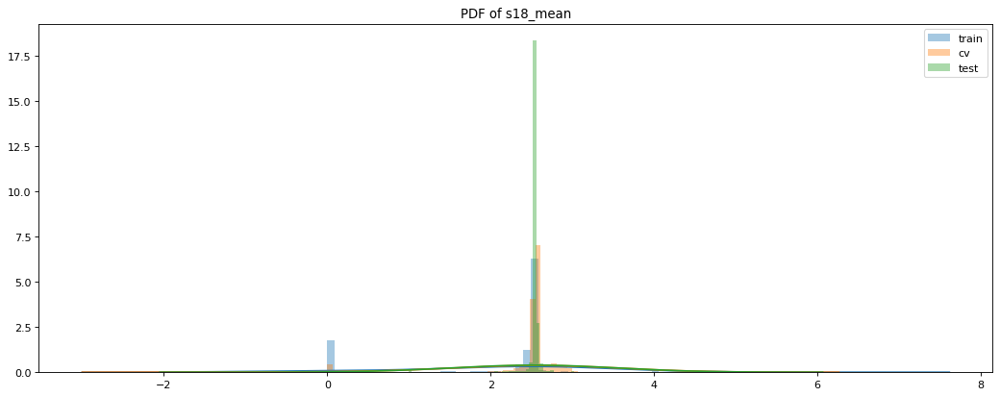

plot for: s18_std


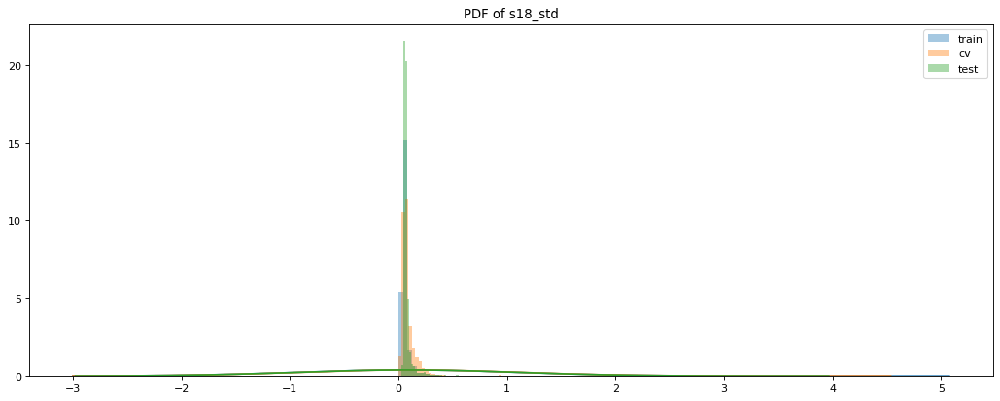

plot for: s18_mid


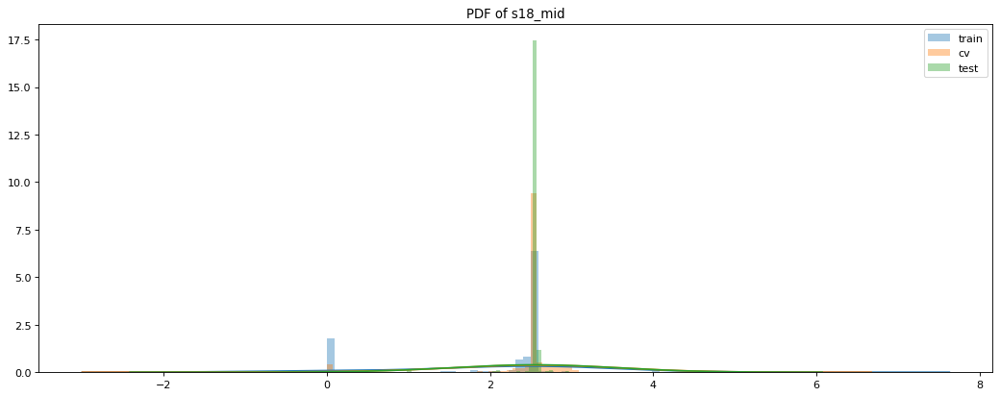

plot for: s18_min


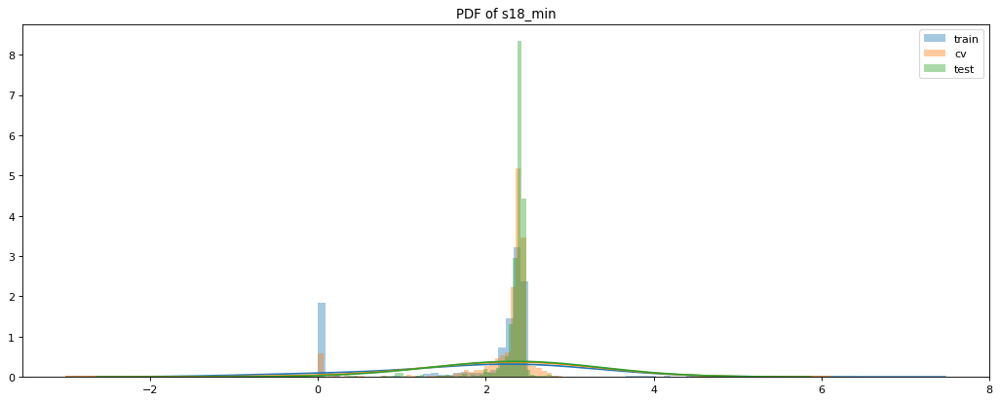

plot for: s18_max


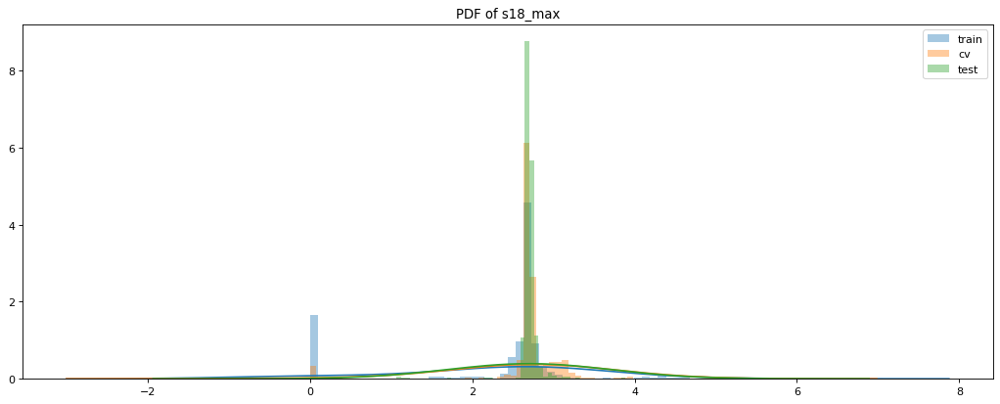

plot for: s19_mean


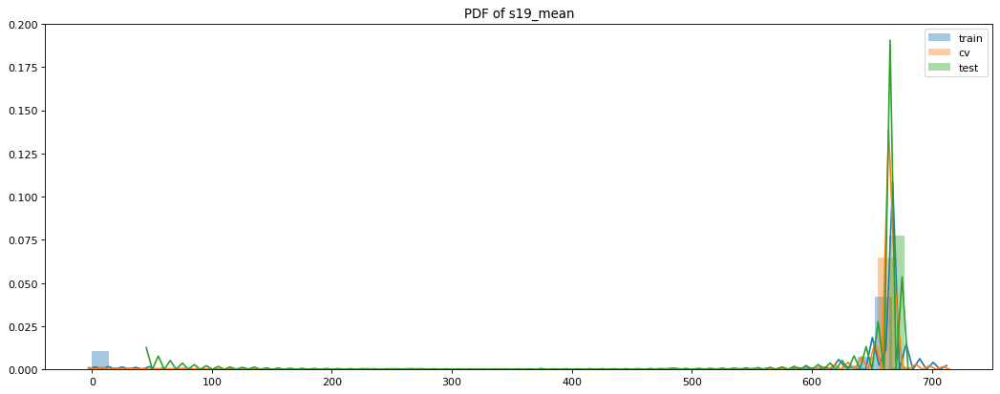

plot for: s19_std


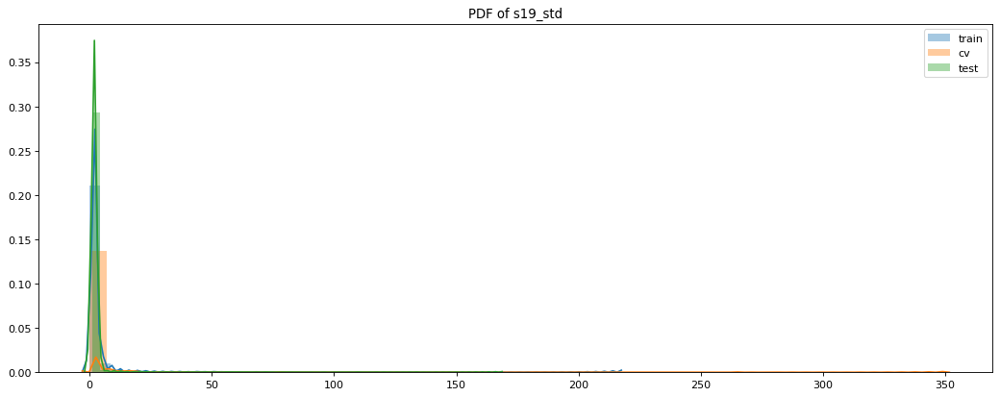

plot for: s19_mid


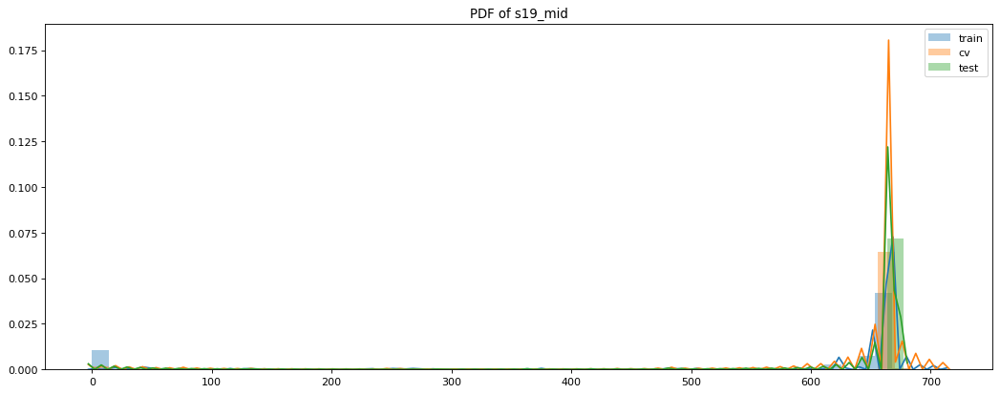

plot for: s19_min


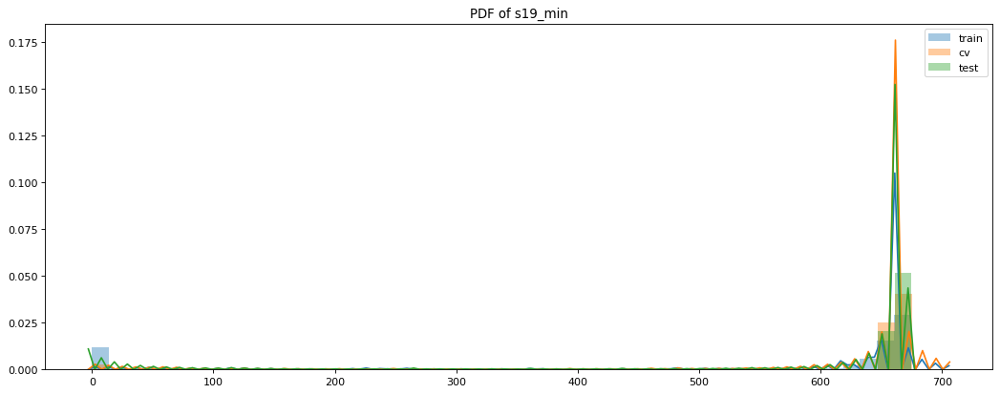

plot for: s19_max


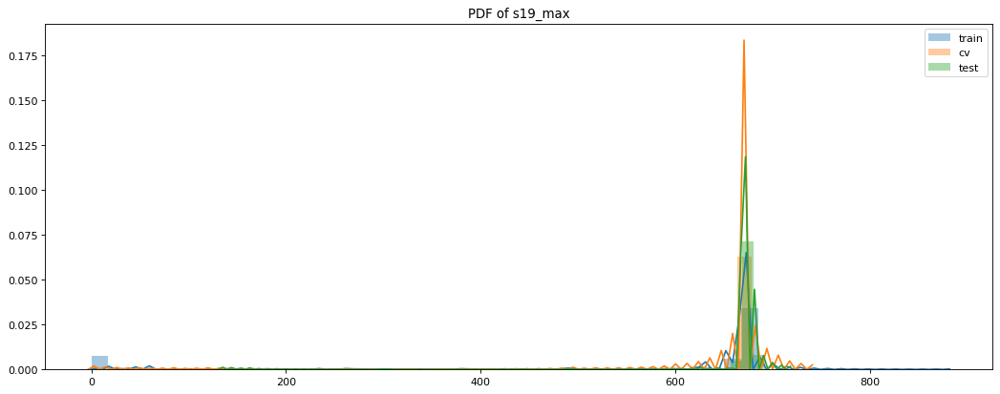

plot for: s20_mean


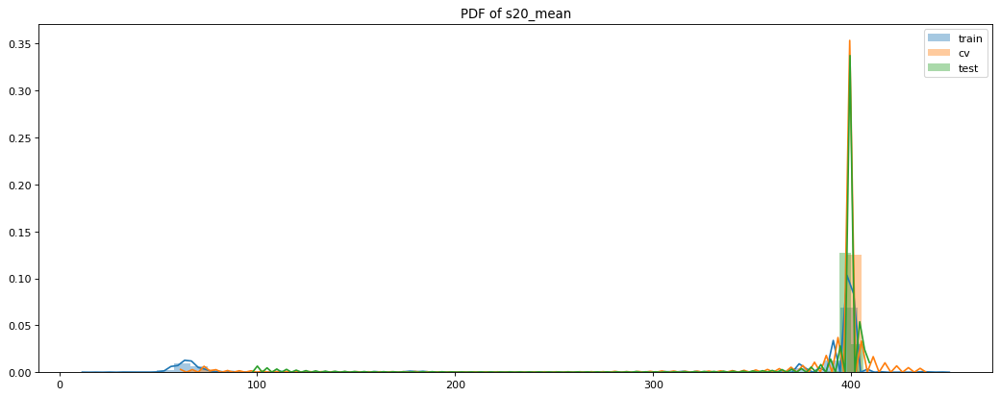

plot for: s20_std


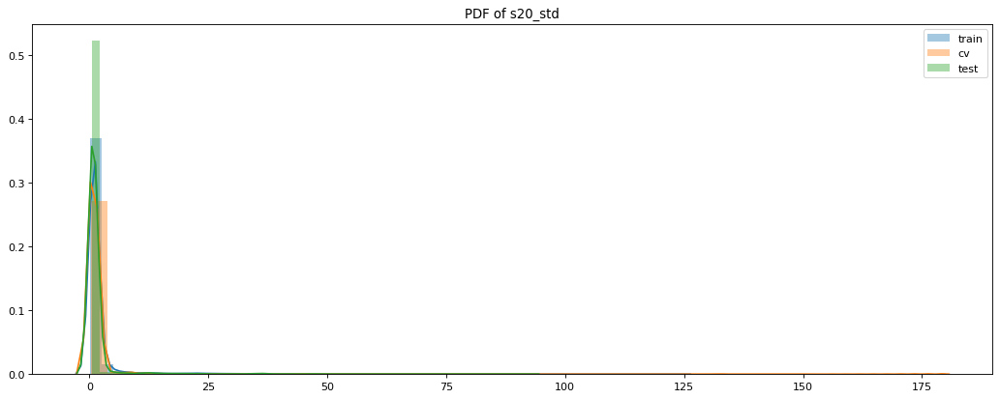

plot for: s20_mid


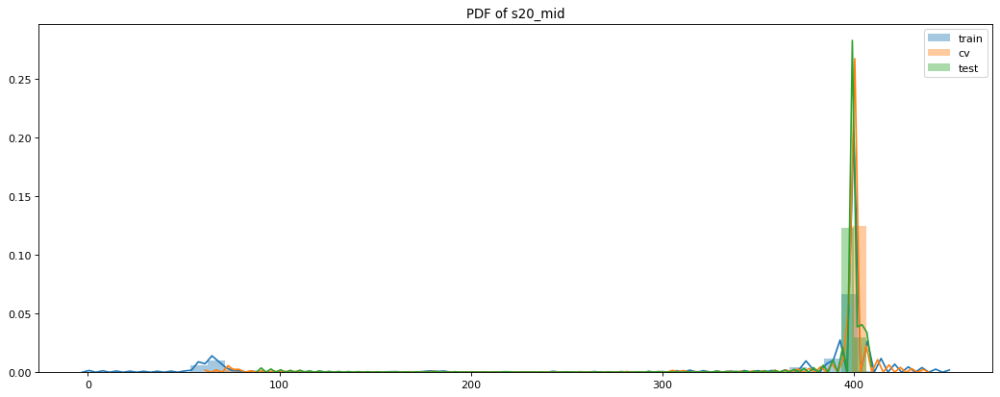

plot for: s20_min


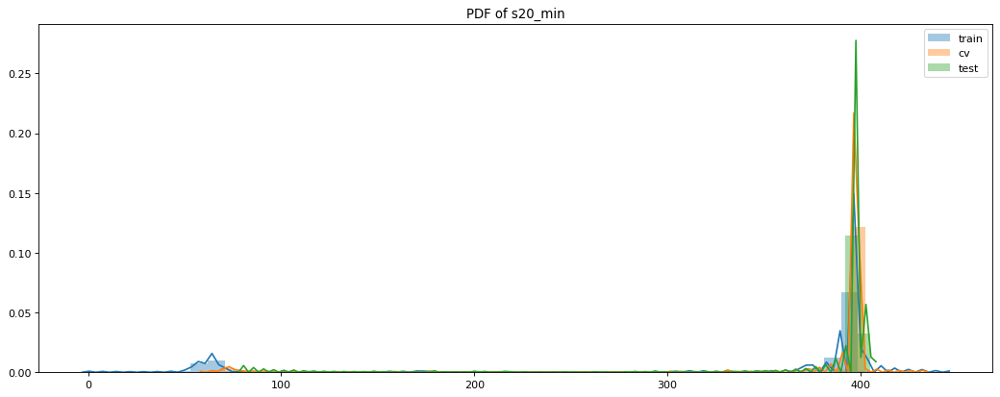

plot for: s20_max


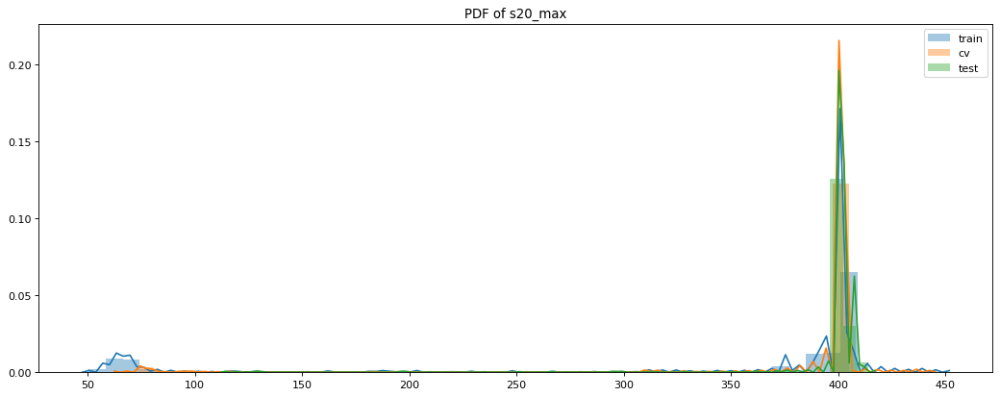

plot for: s21_mean


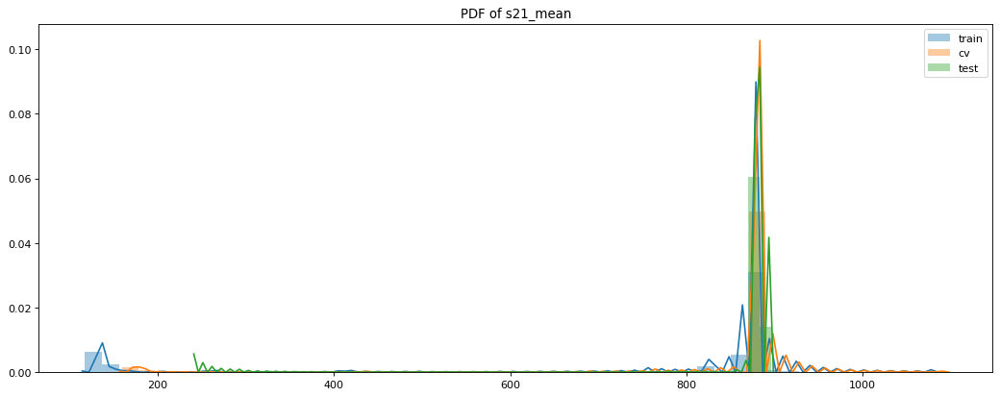

plot for: s21_std


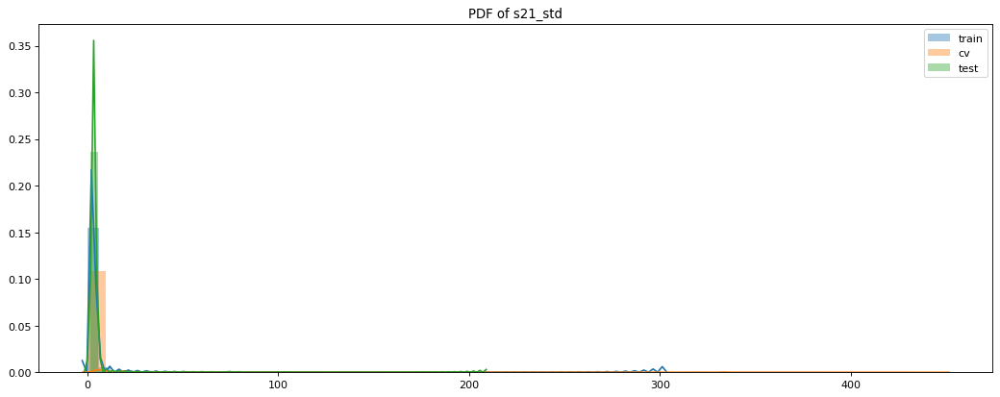

plot for: s21_mid


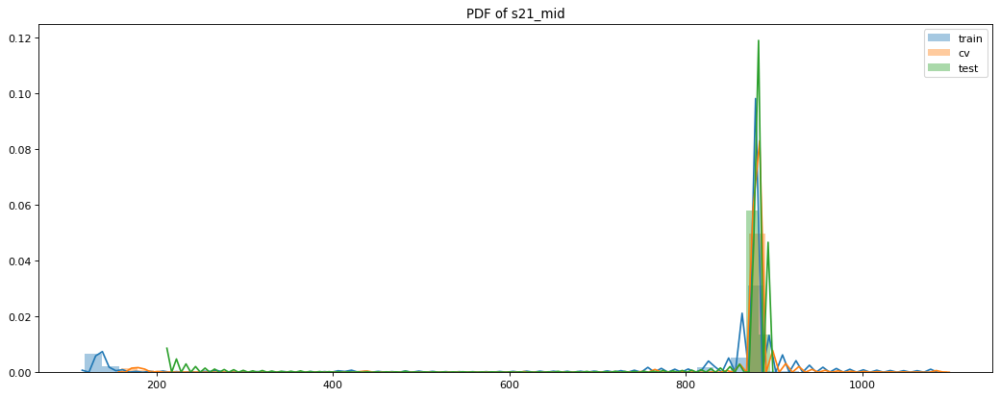

plot for: s21_min


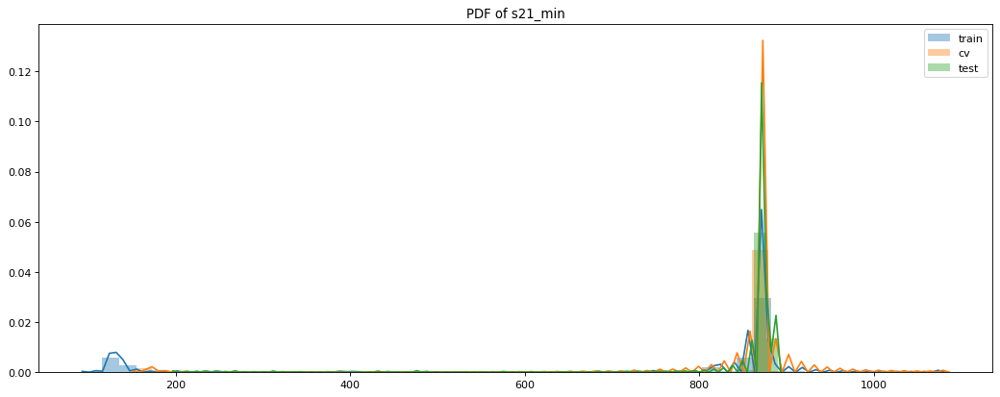

plot for: s21_max


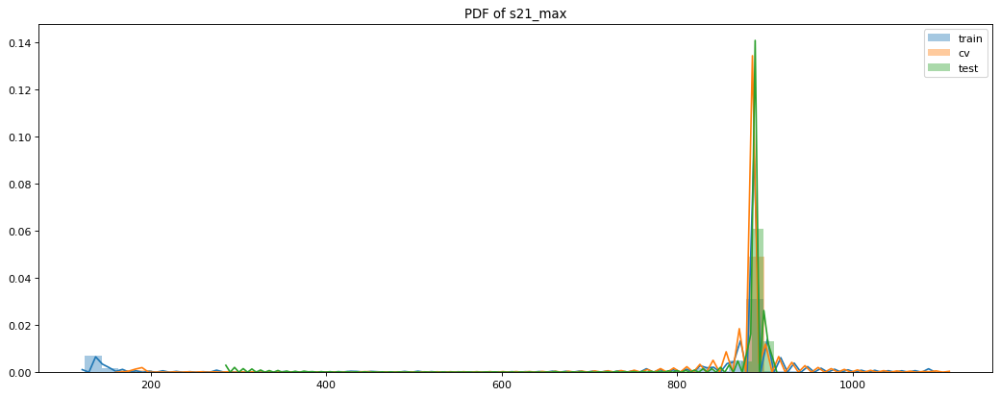

plot for: s22_mean


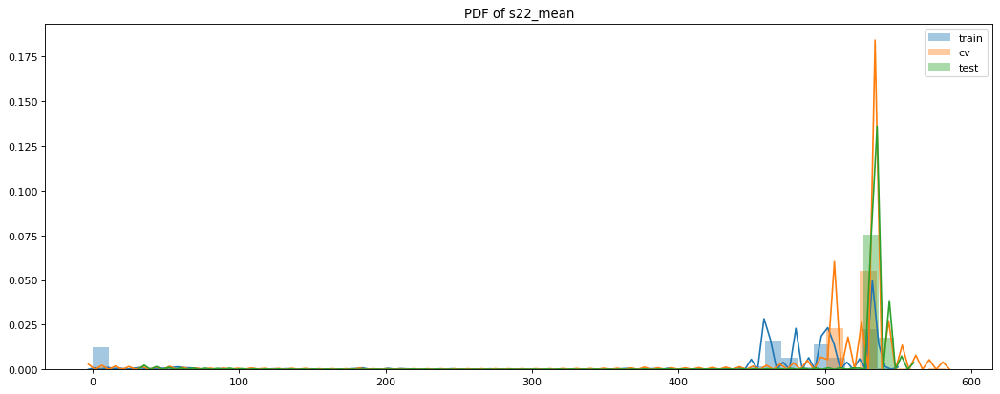

plot for: s22_std


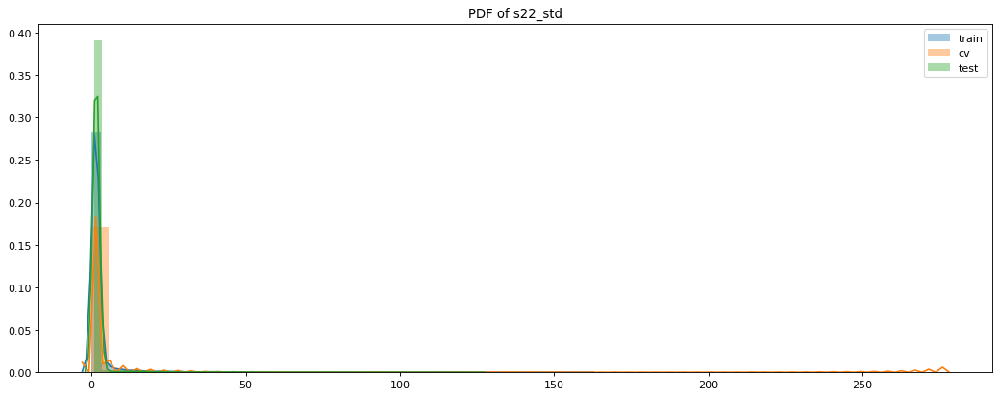

plot for: s22_mid


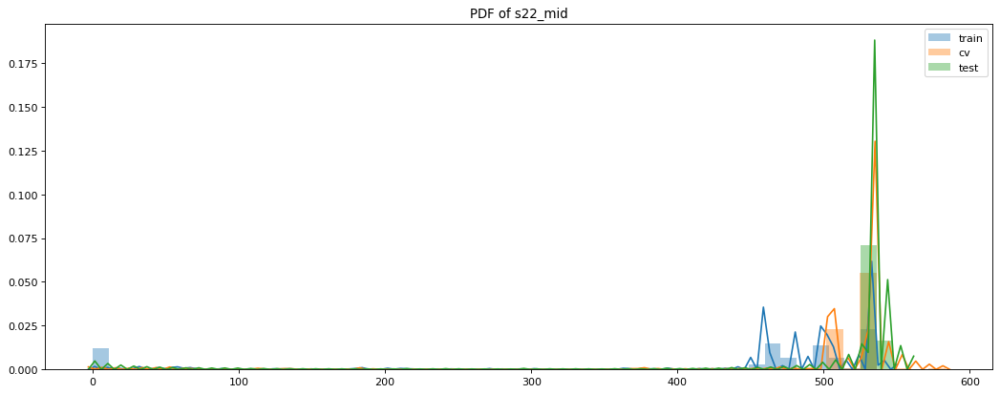

plot for: s22_min


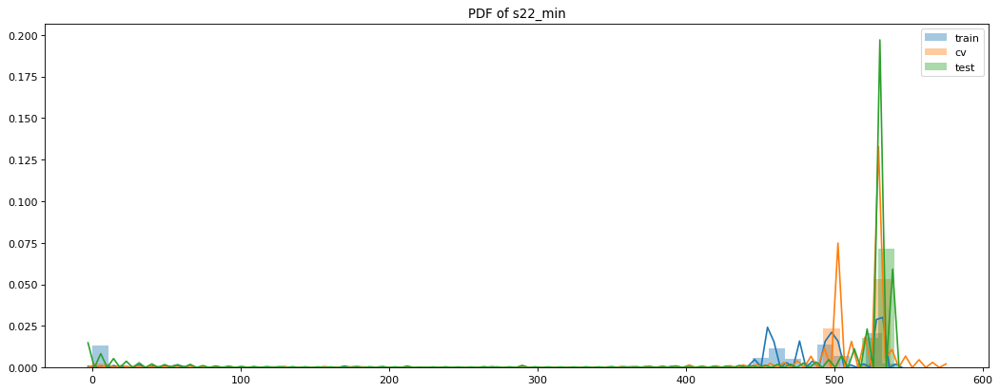

plot for: s22_max


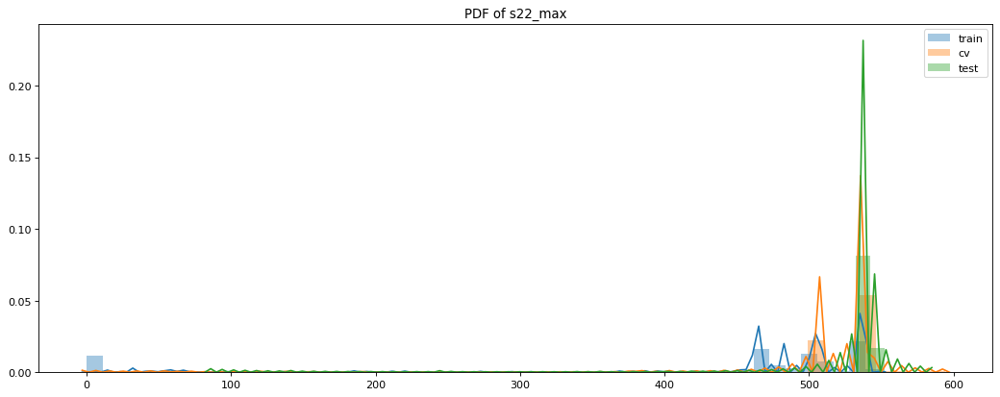

plot for: s23_mean


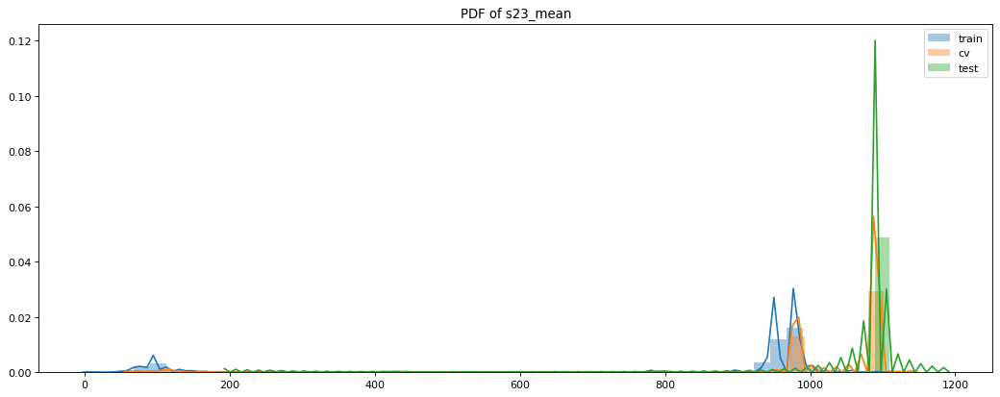

plot for: s23_std


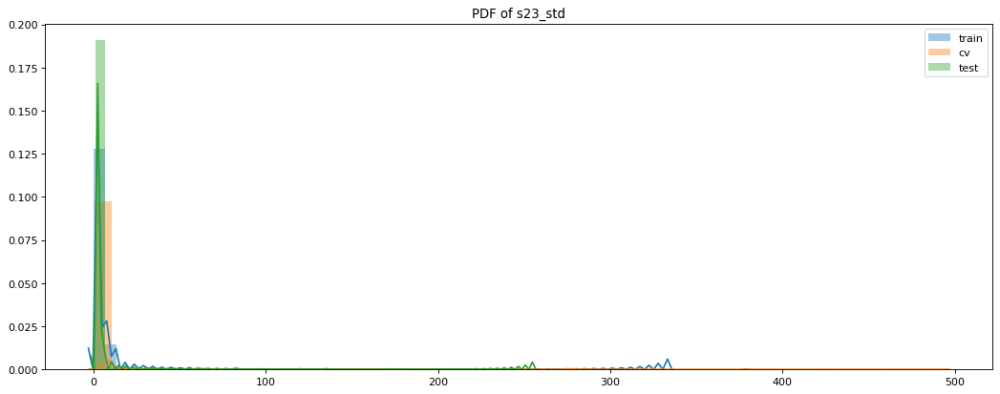

plot for: s23_mid


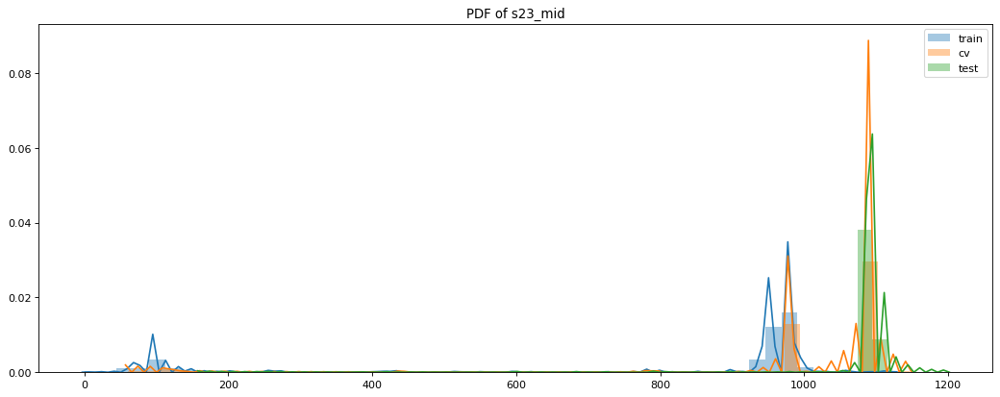

plot for: s23_min


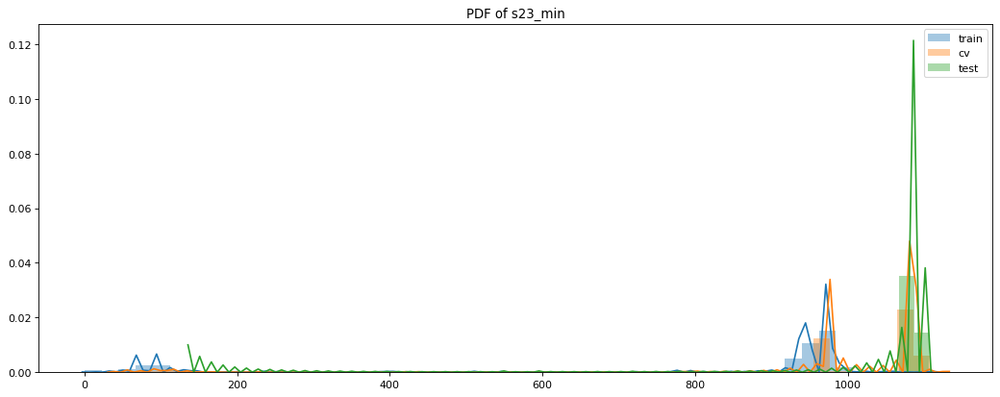

plot for: s23_max


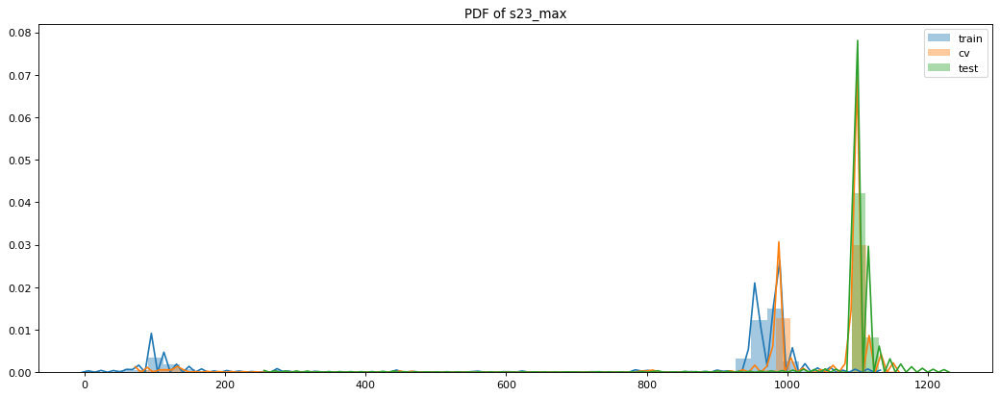

plot for: s24_mean


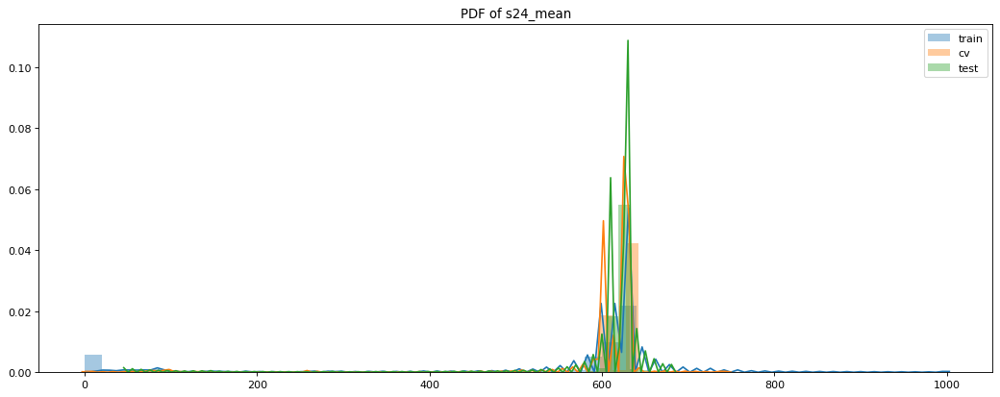

plot for: s24_std


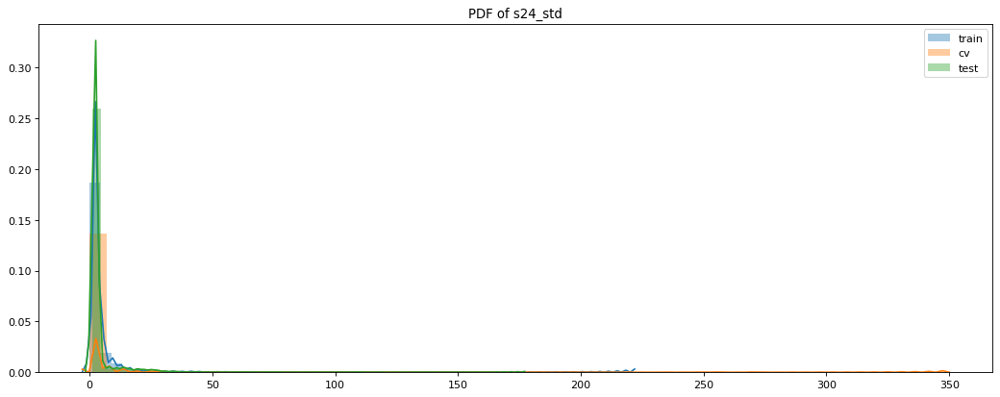

plot for: s24_mid


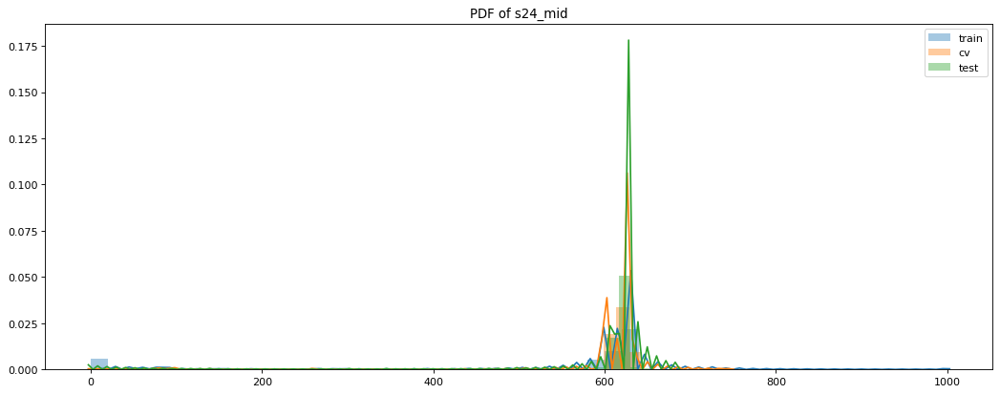

plot for: s24_min


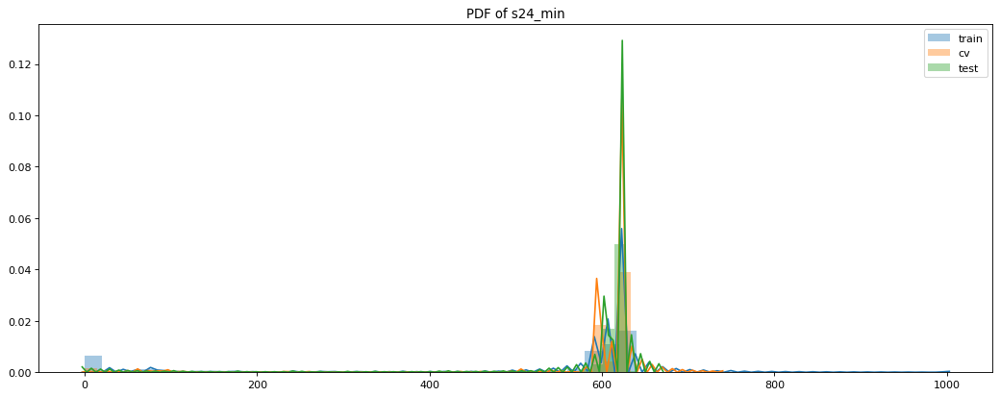

plot for: s24_max


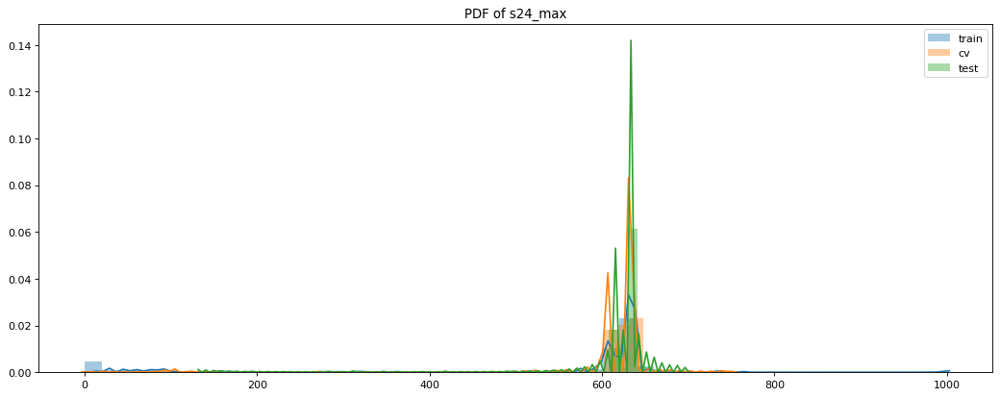

plot for: s25_mean


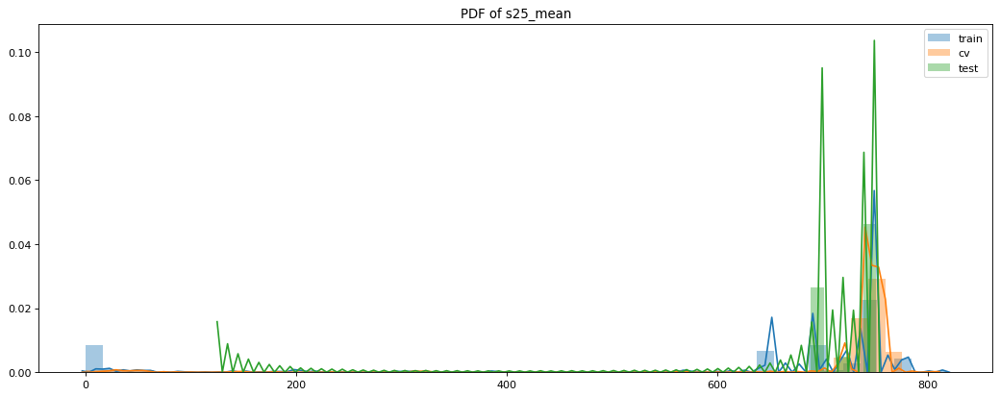

plot for: s25_std


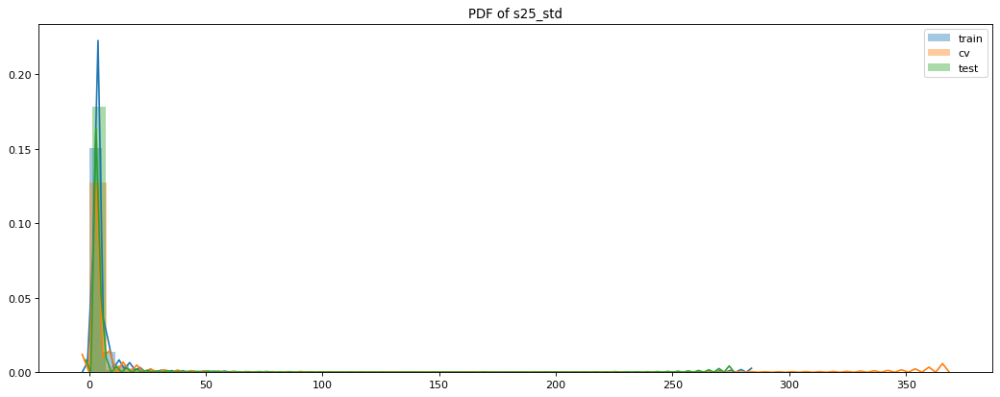

plot for: s25_mid


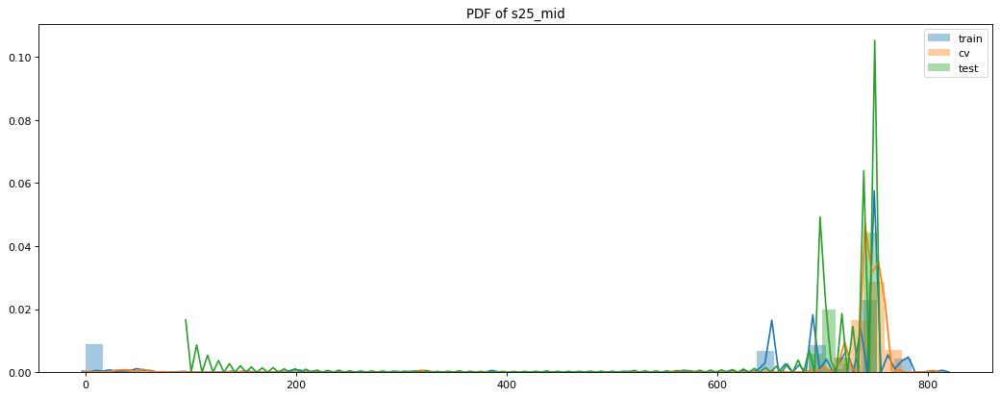

plot for: s25_min


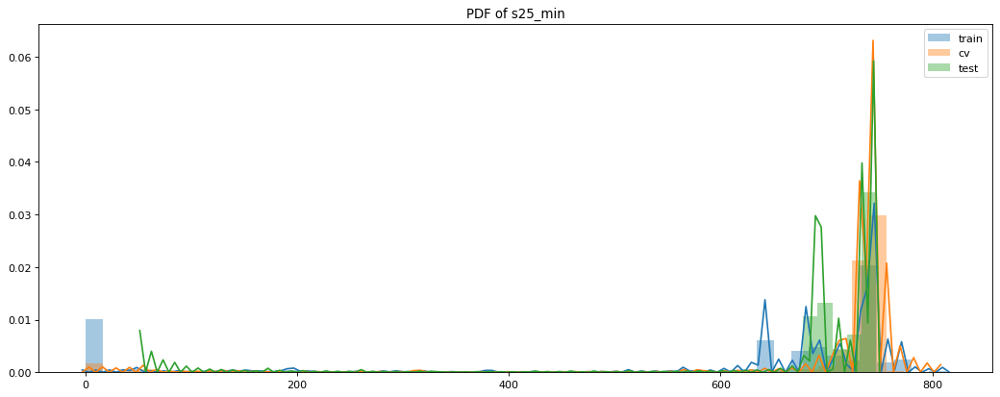

plot for: s25_max


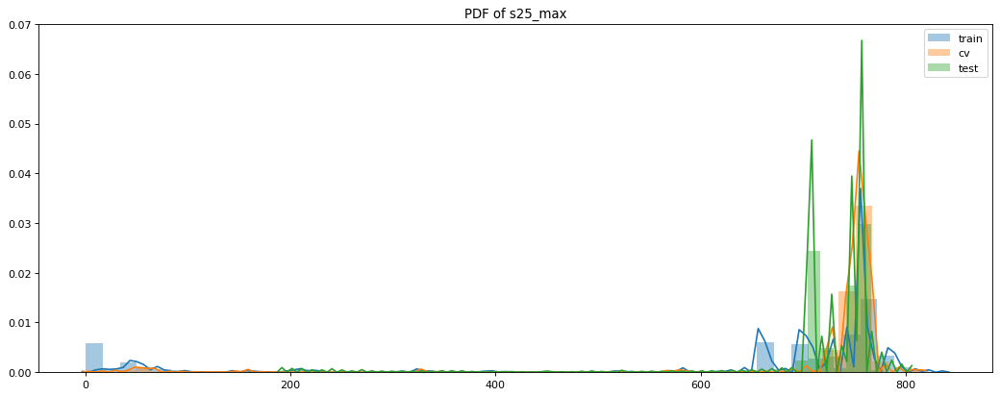

plot for: s26_mean


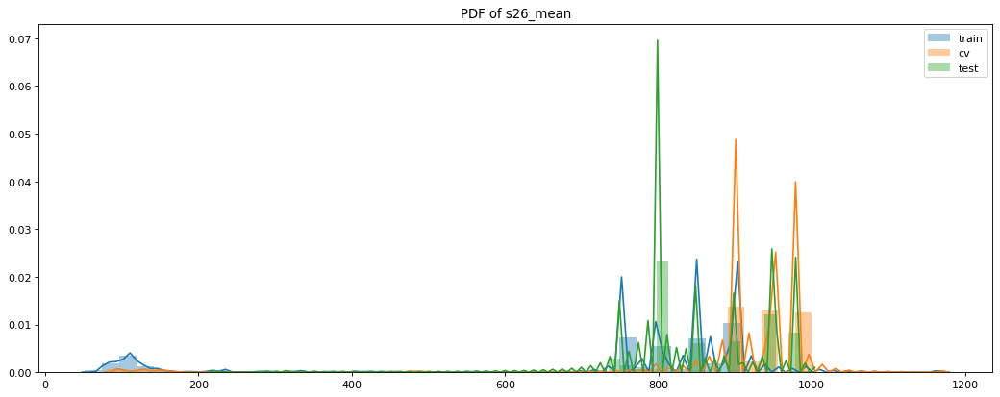

plot for: s26_std


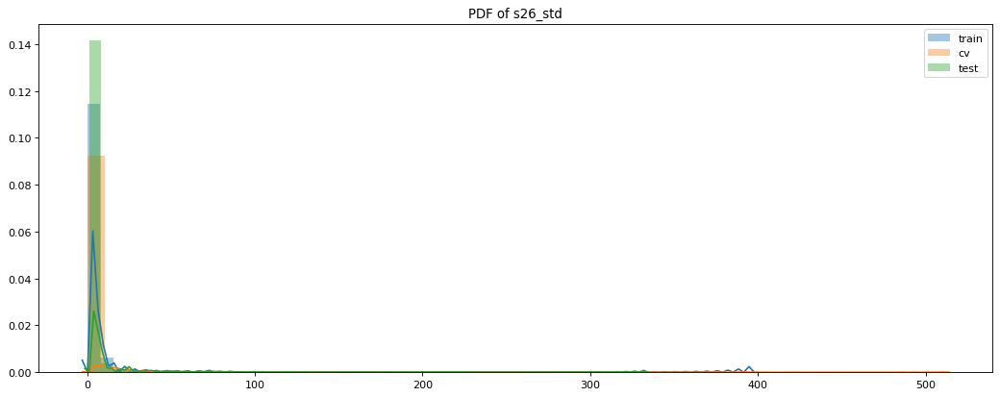

plot for: s26_mid


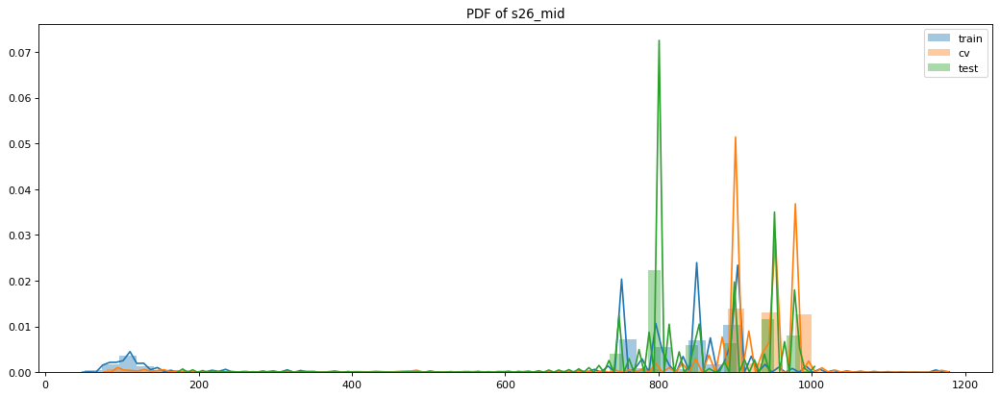

plot for: s26_min


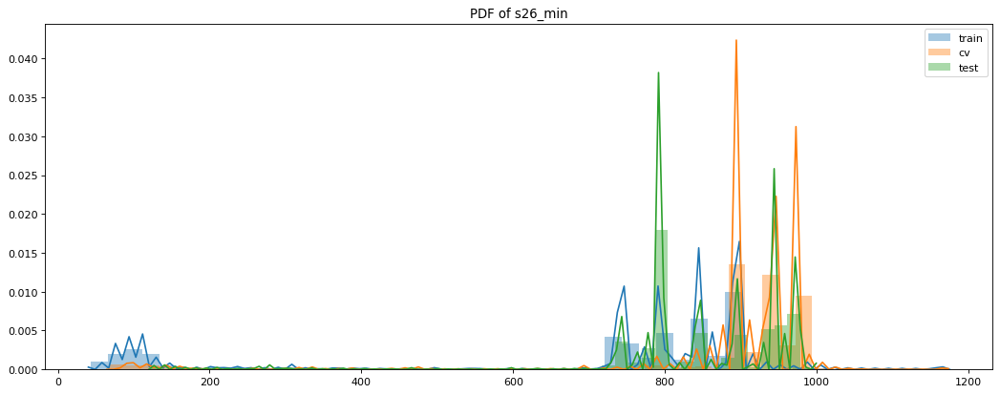

plot for: s26_max


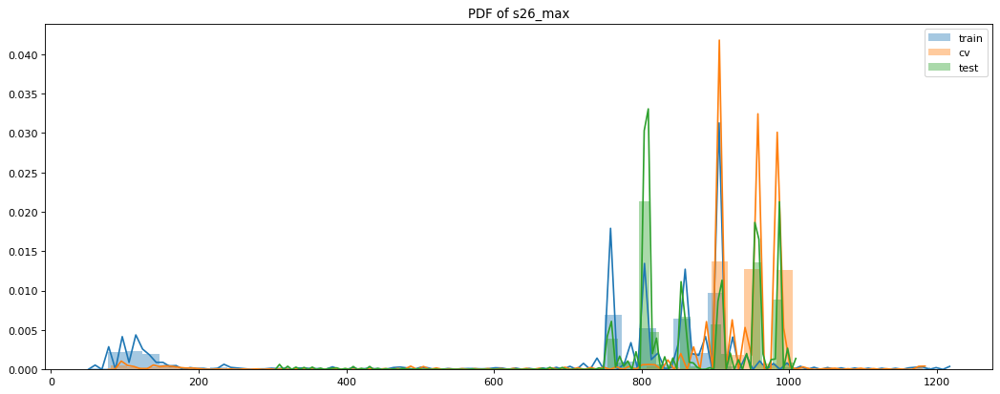

plot for: s27_mean


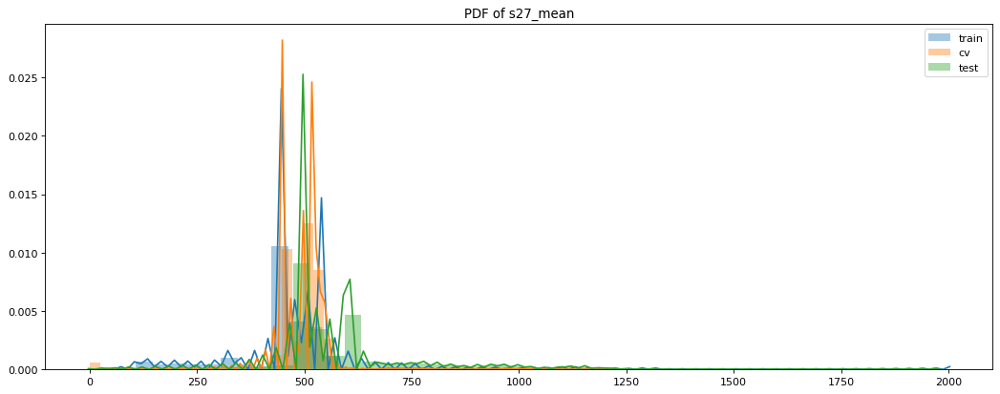

plot for: s27_std


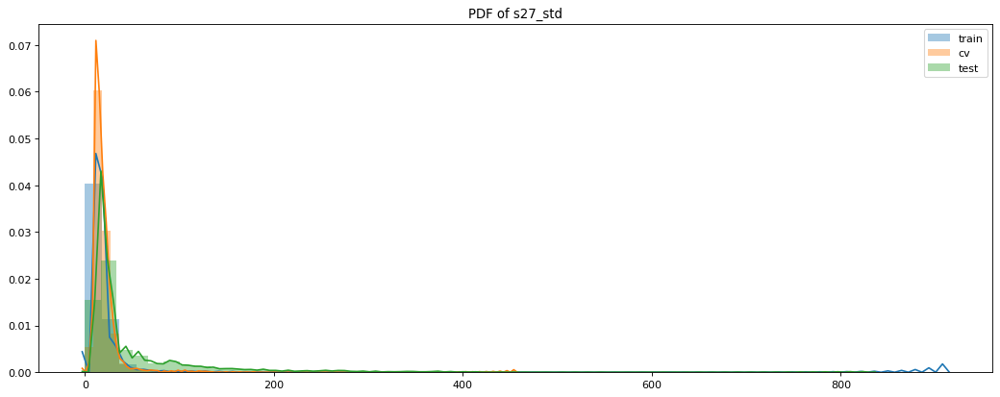

plot for: s27_mid


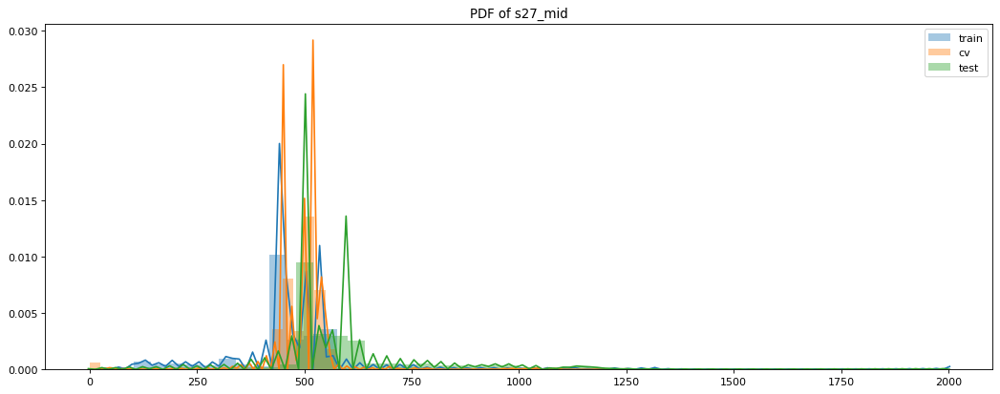

plot for: s27_min


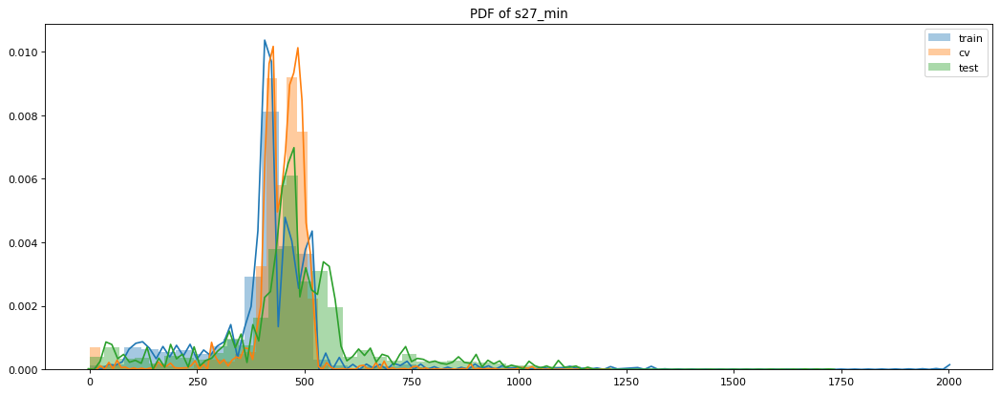

plot for: s27_max


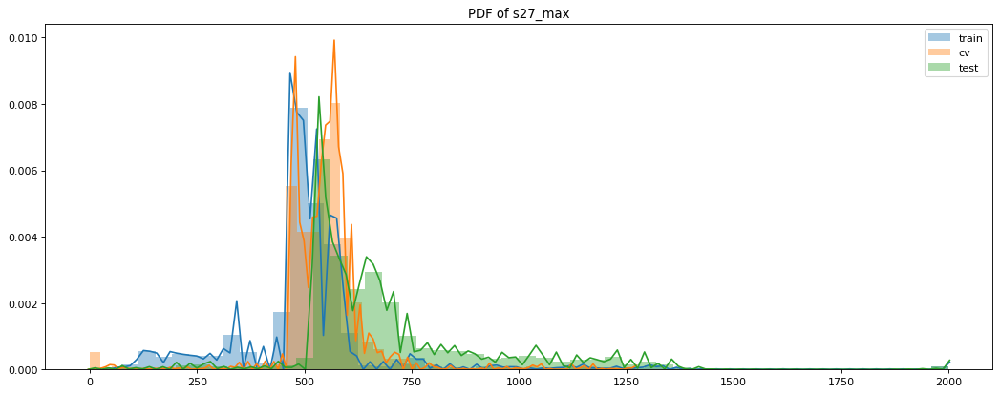

plot for: s28_mean


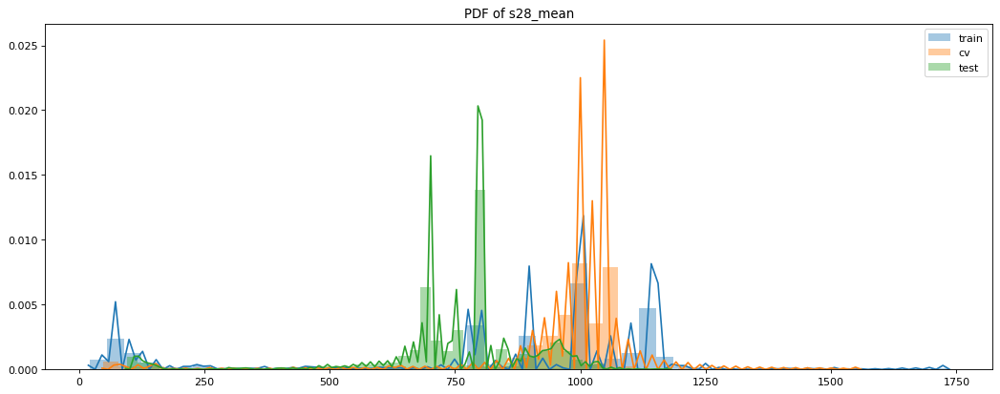

plot for: s28_std


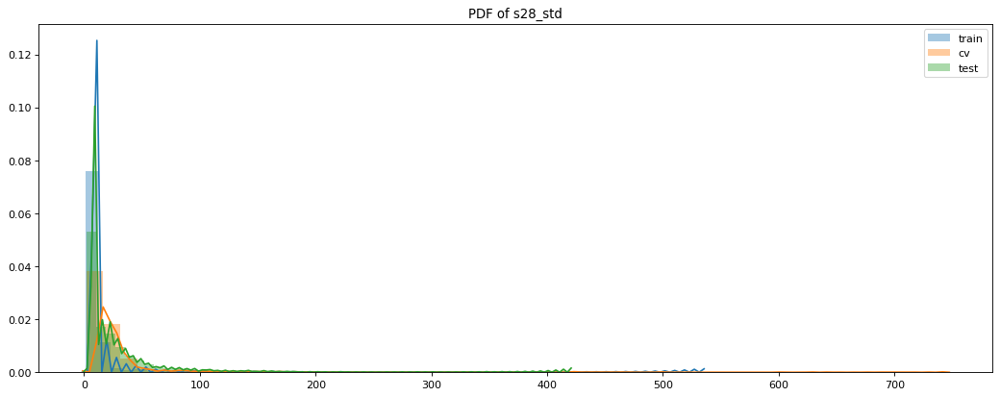

plot for: s28_mid


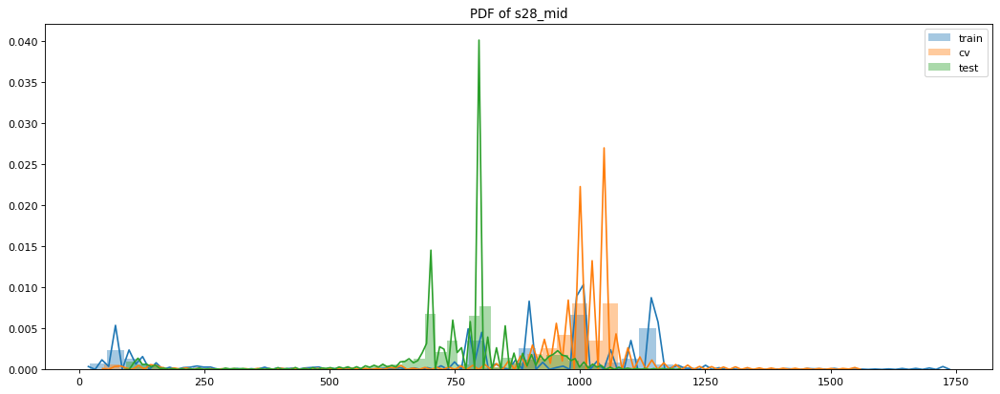

plot for: s28_min


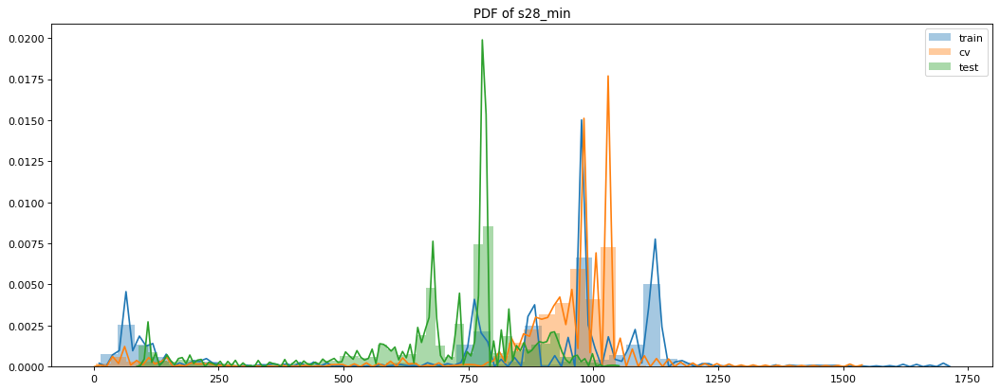

plot for: s28_max


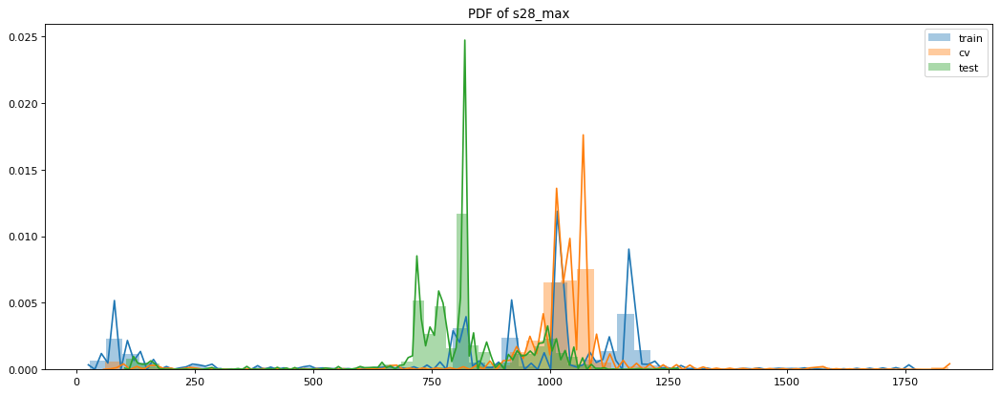

plot for: s29_mean


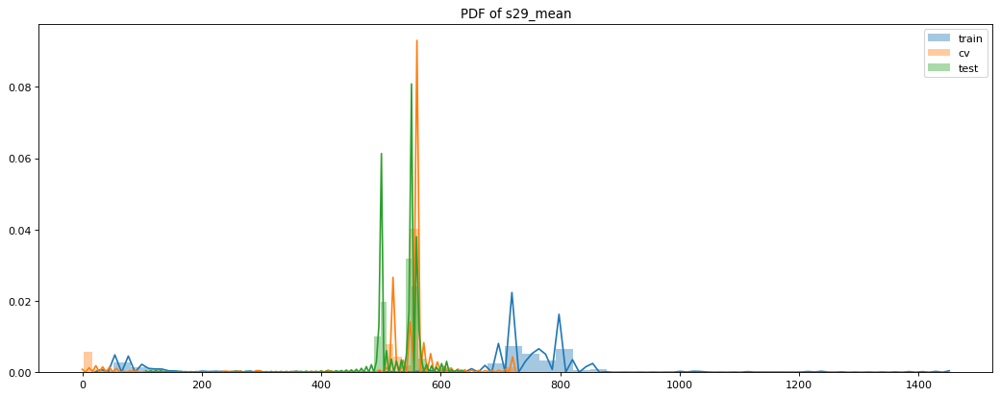

plot for: s29_std


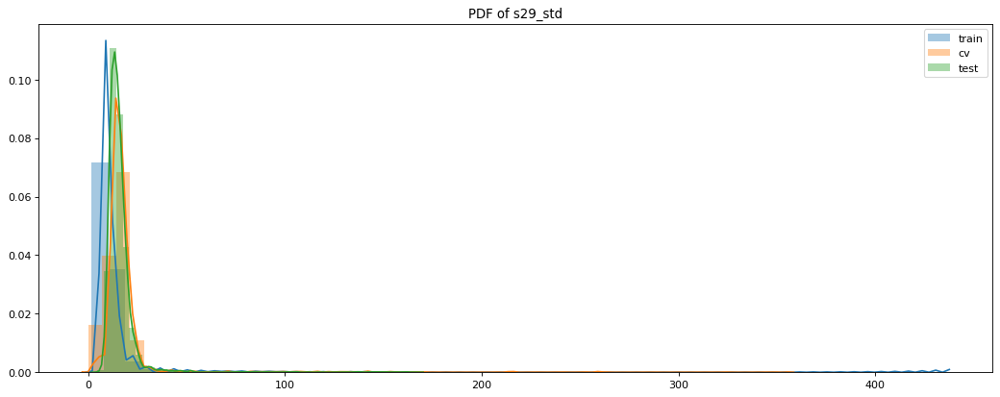

plot for: s29_mid


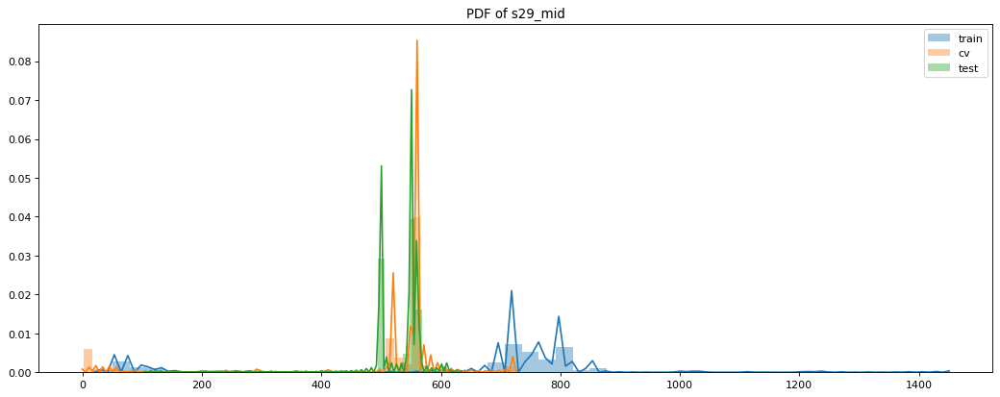

plot for: s29_min


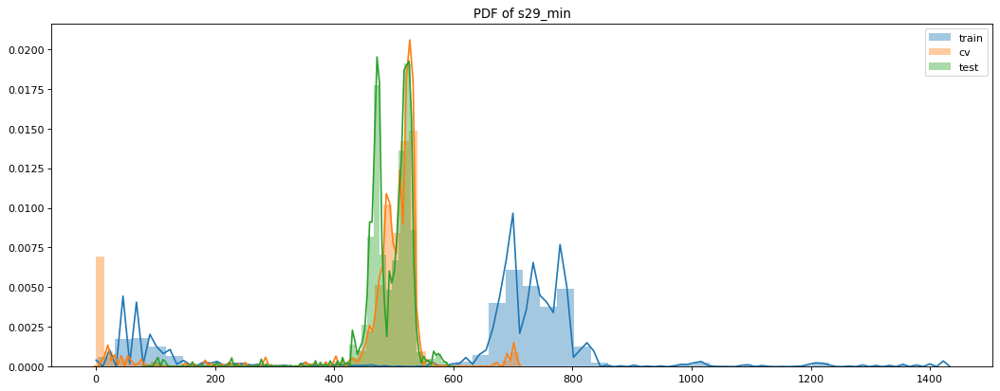

plot for: s29_max


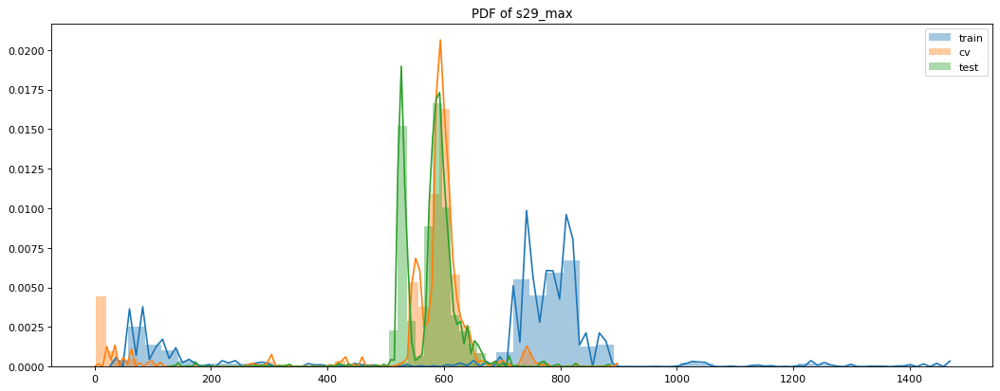

plot for: s30_mean


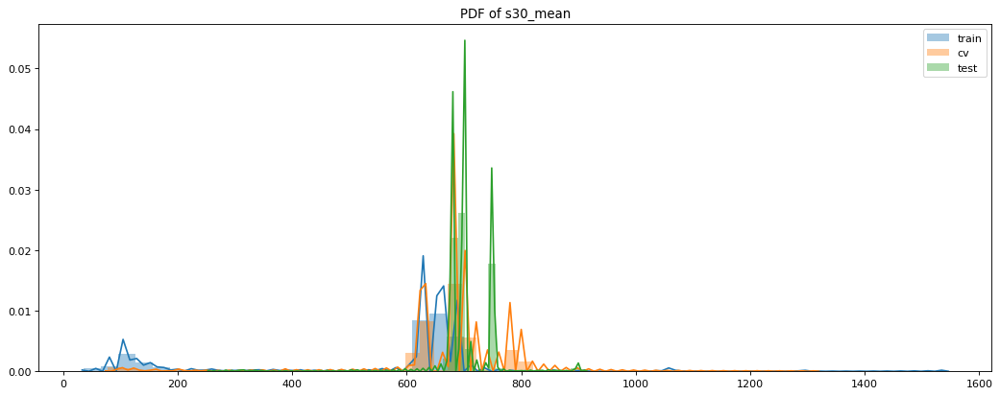

plot for: s30_std


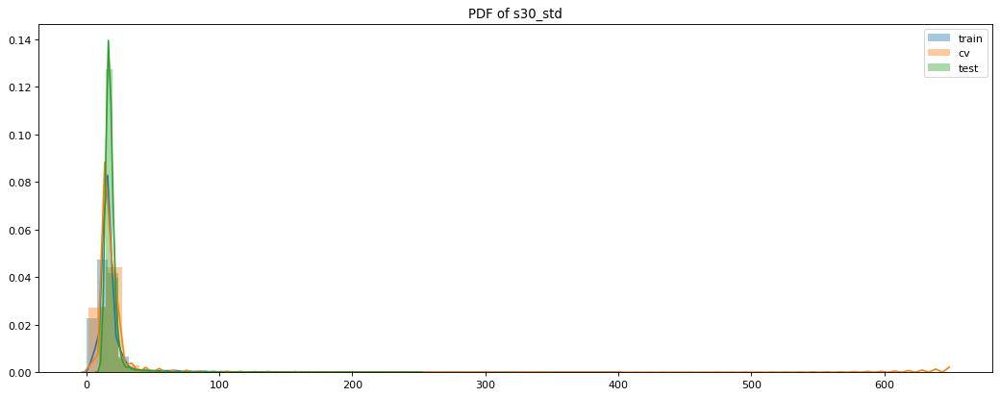

plot for: s30_mid


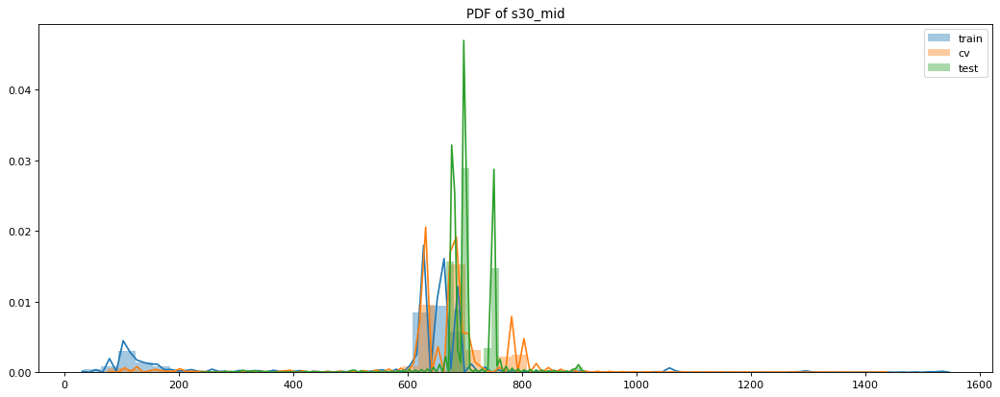

plot for: s30_min


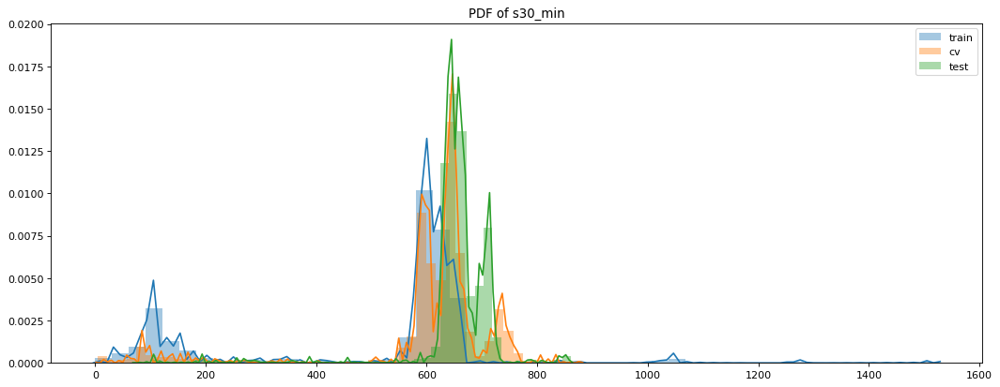

plot for: s30_max


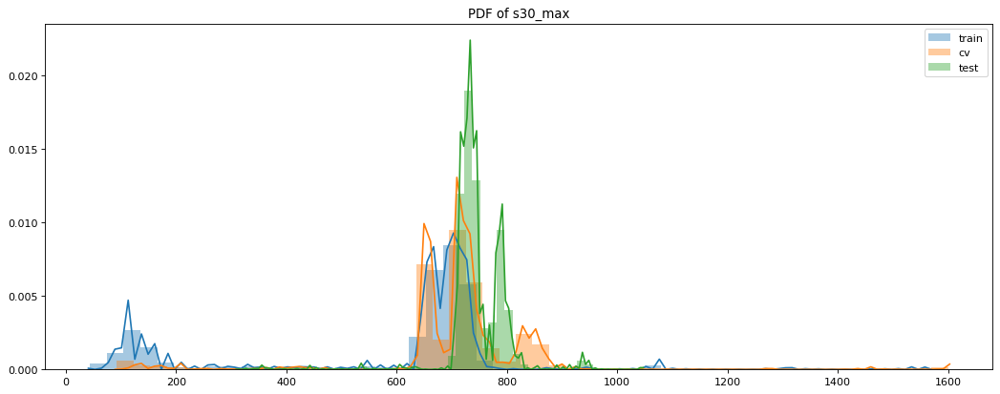

plot for: s31_mean


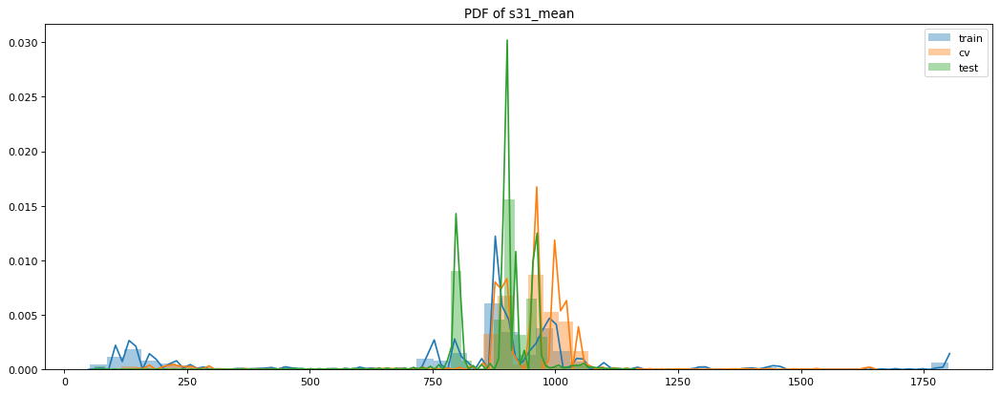

plot for: s31_std


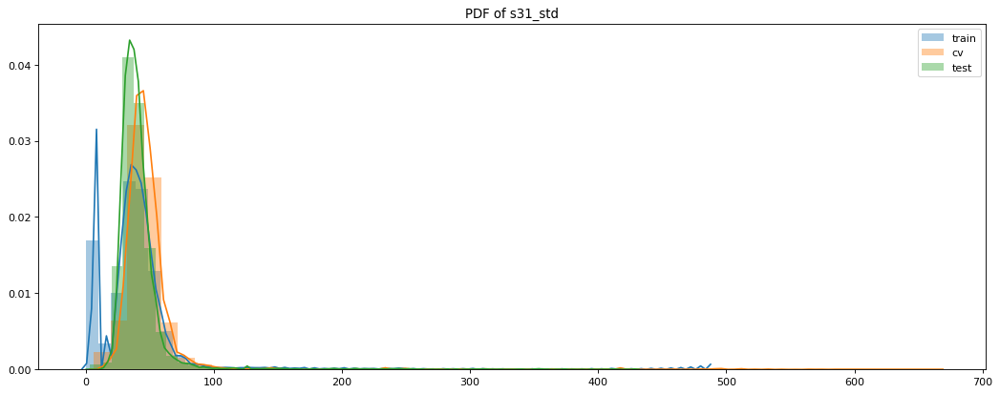

plot for: s31_mid


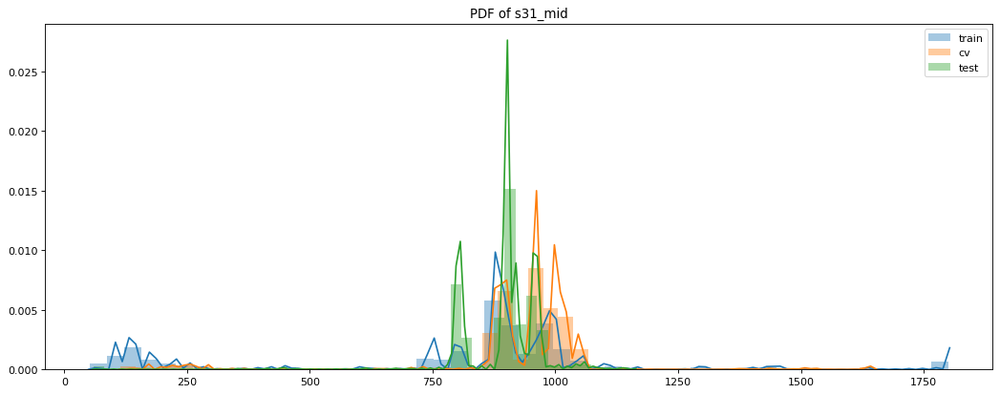

plot for: s31_min


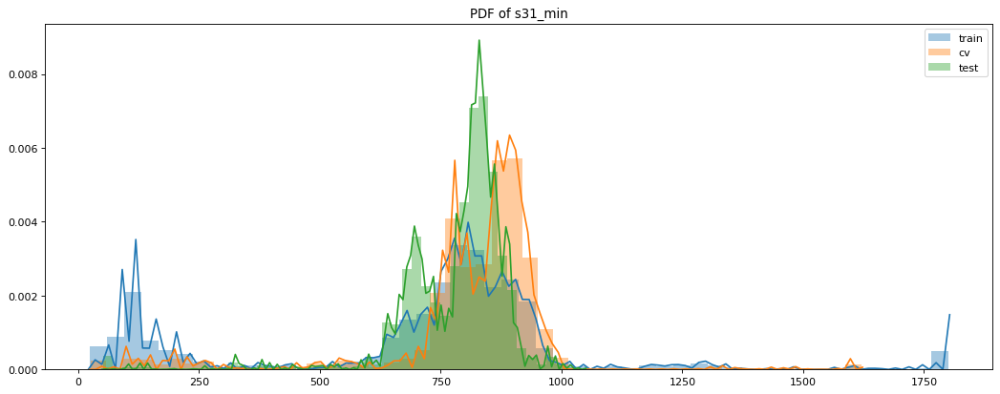

plot for: s31_max


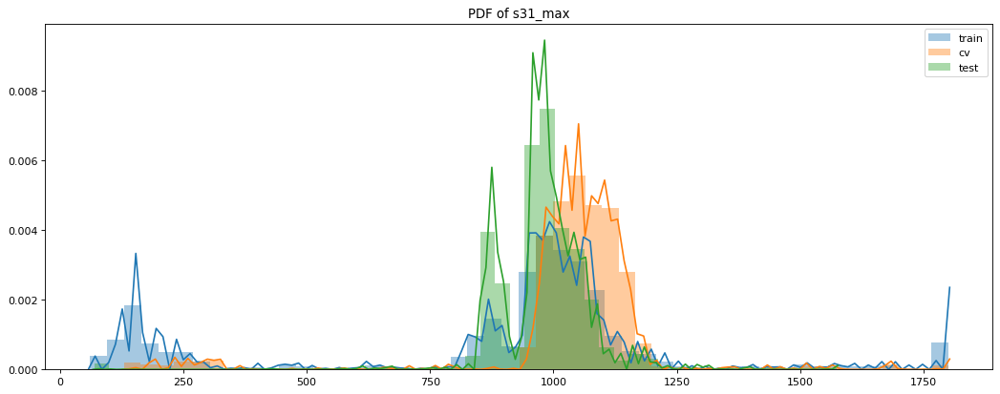

plot for: s32_mean


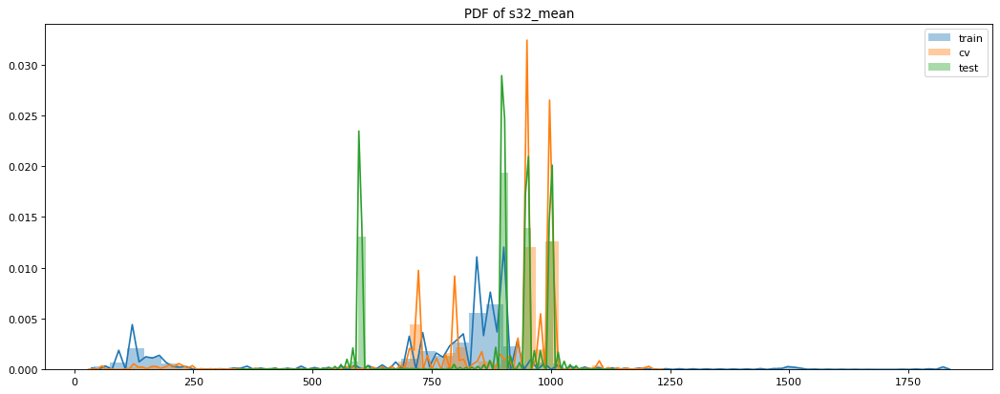

plot for: s32_std


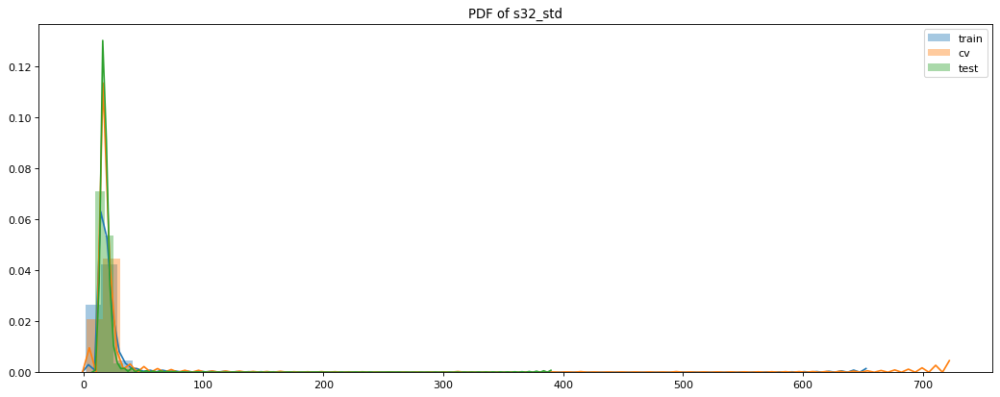

plot for: s32_mid


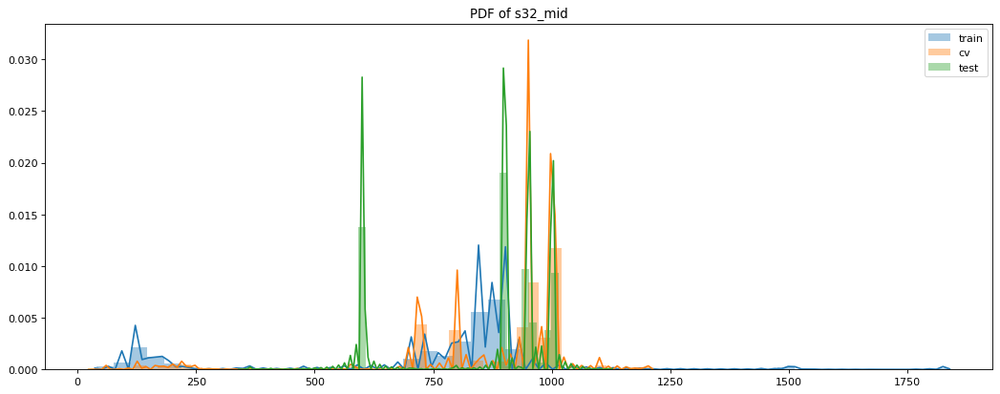

plot for: s32_min


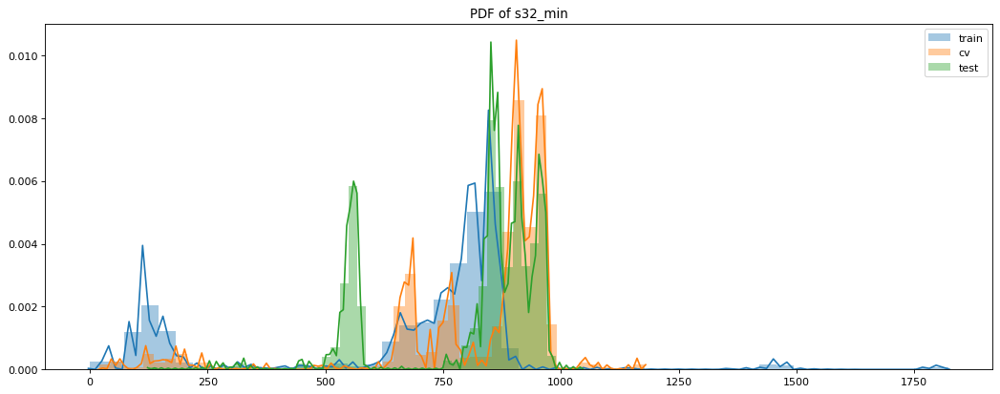

plot for: s32_max


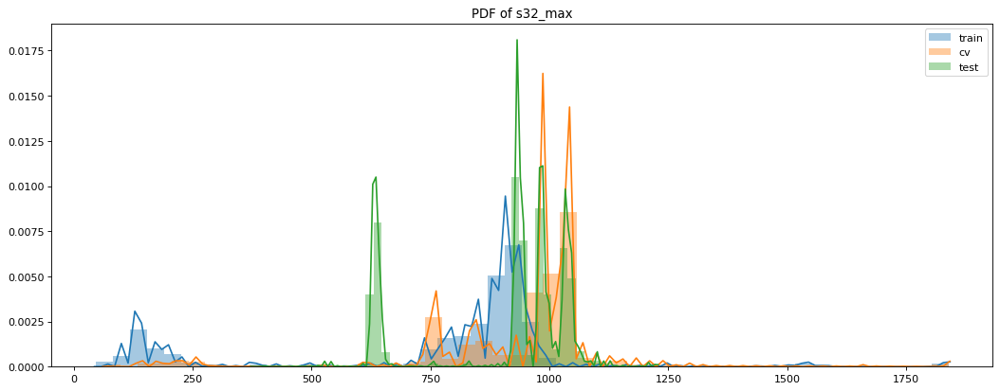

plot for: s33_mean


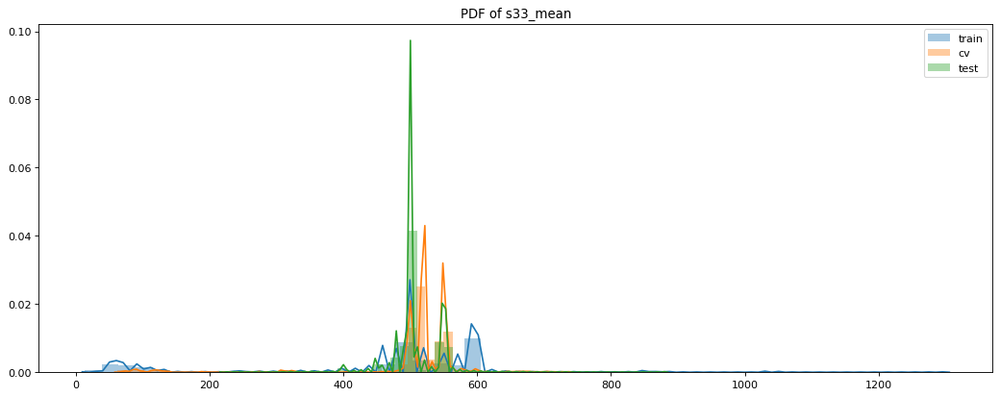

plot for: s33_std


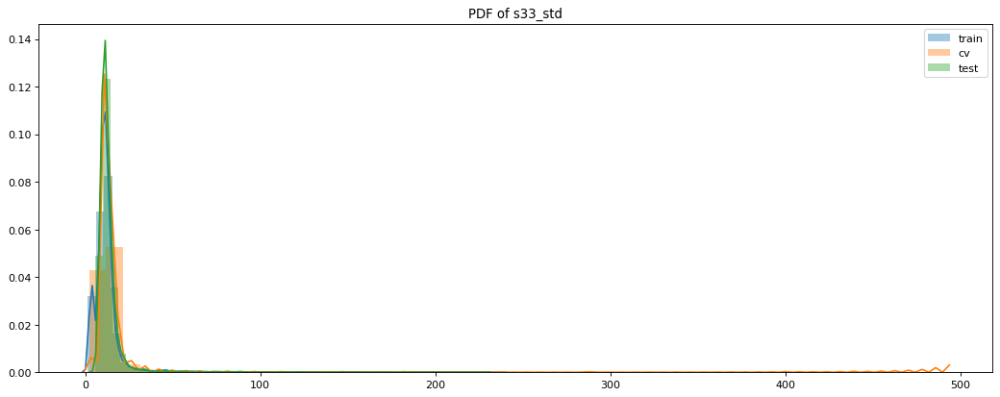

plot for: s33_mid


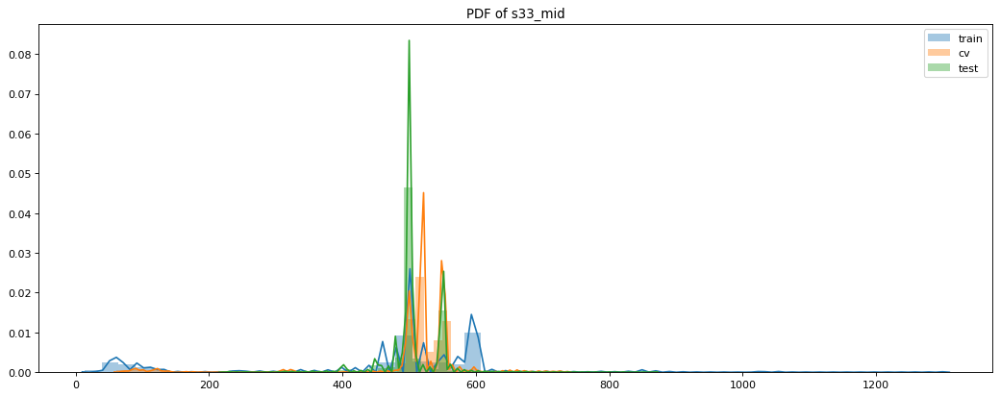

plot for: s33_min


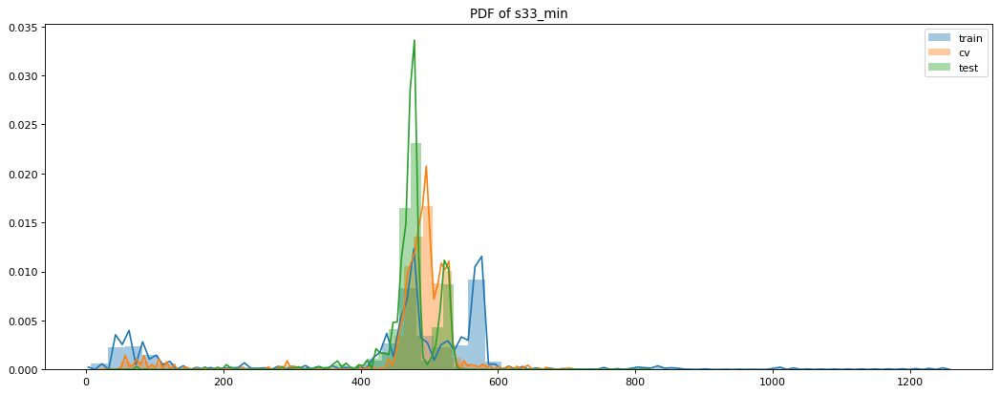

plot for: s33_max


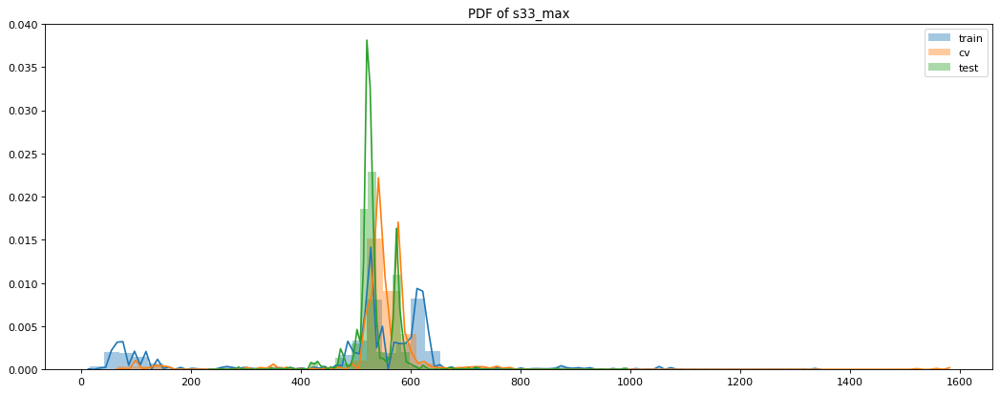

plot for: s34_mean


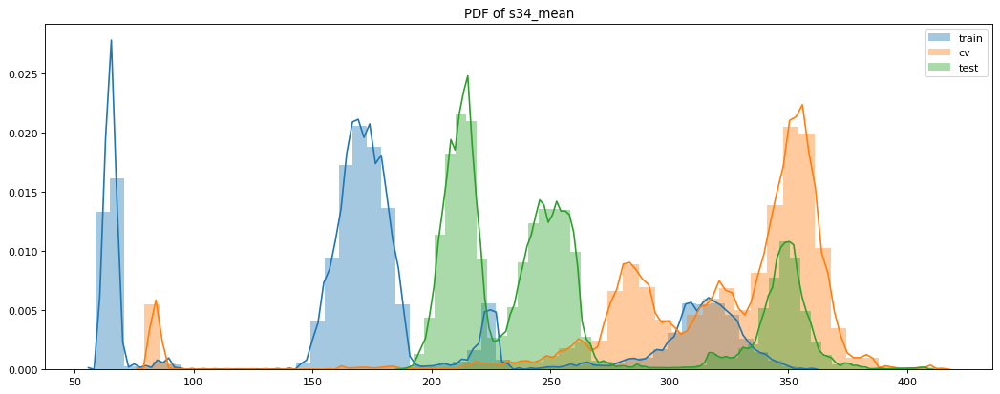

plot for: s34_std


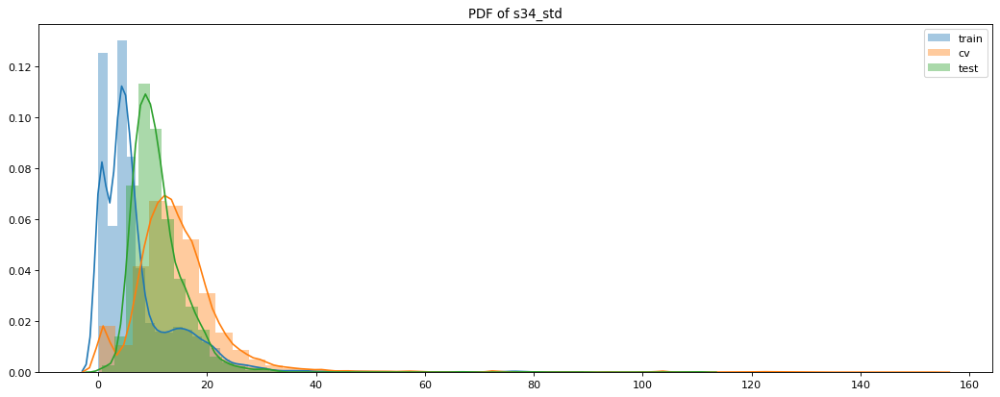

plot for: s34_mid


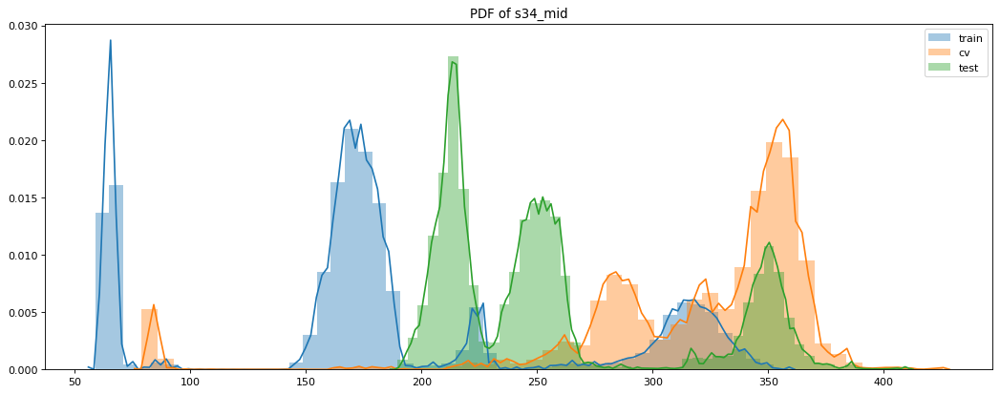

plot for: s34_min


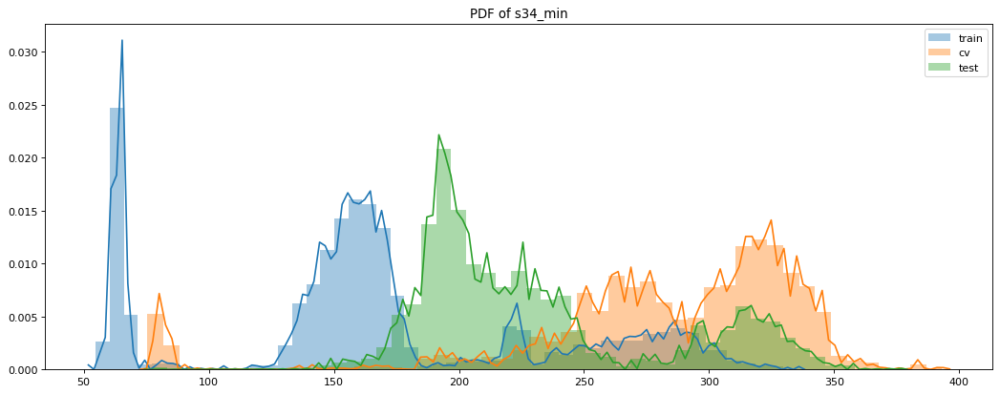

plot for: s34_max


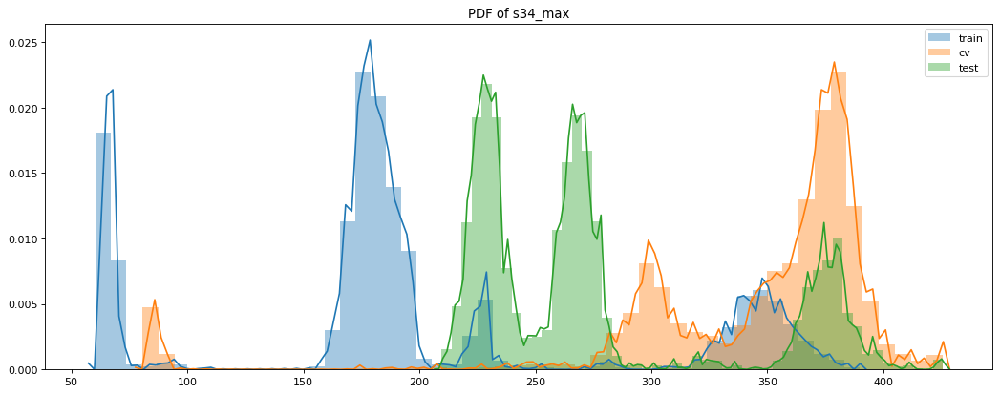

plot for: s35_mean


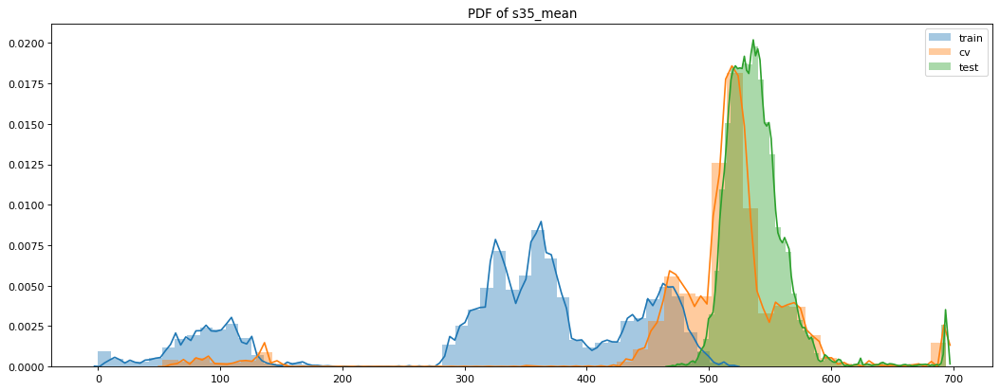

plot for: s35_std


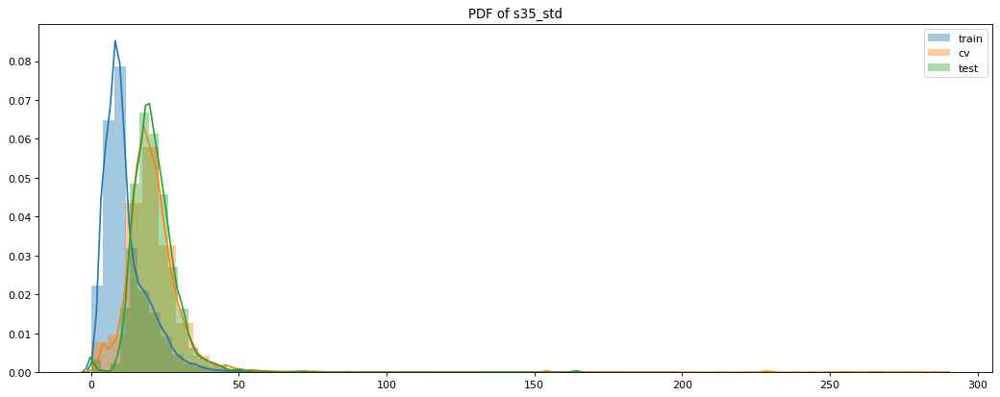

plot for: s35_mid


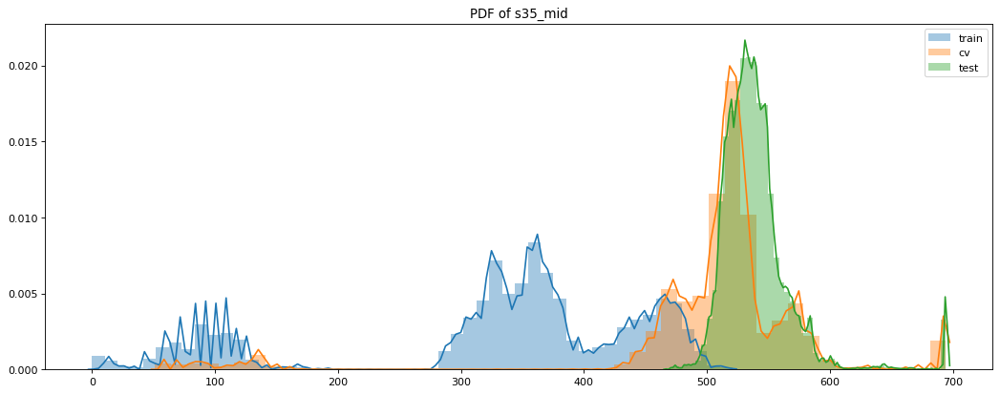

plot for: s35_min


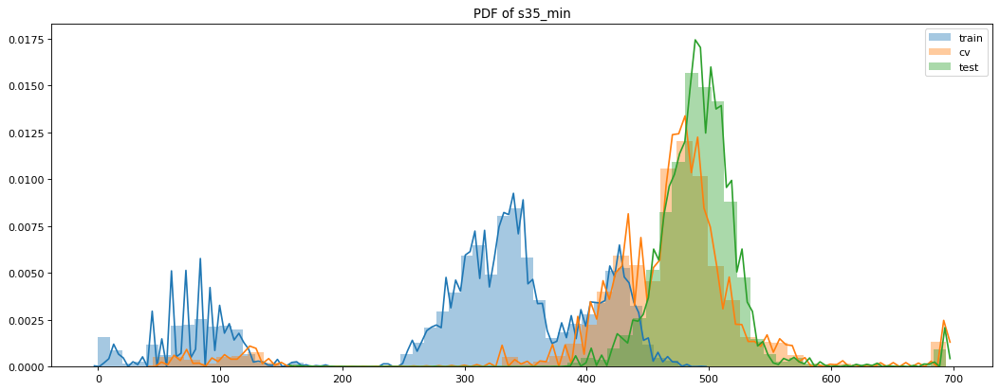

plot for: s35_max


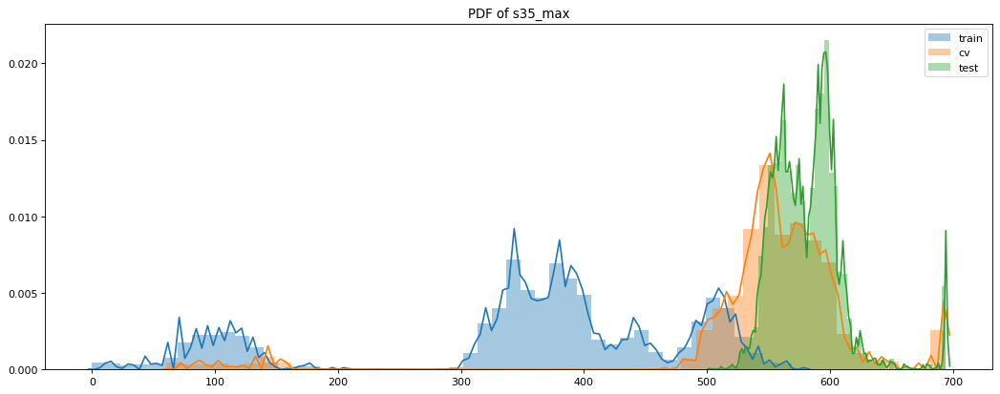

plot for: s36_mean


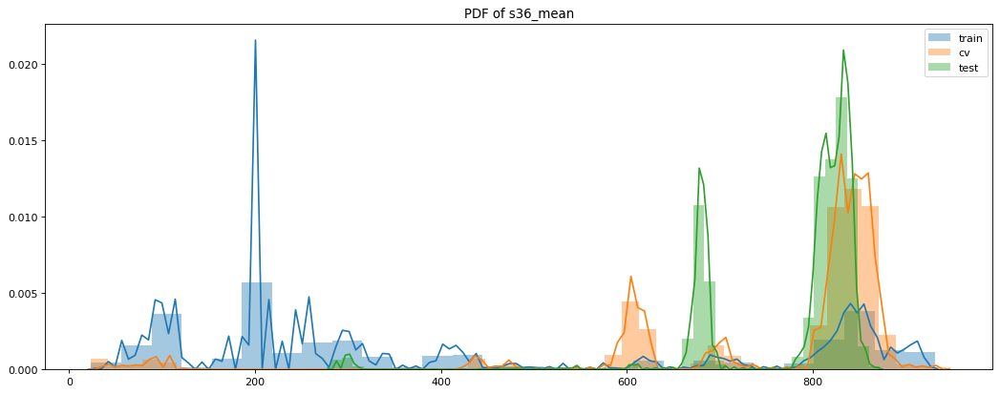

plot for: s36_std


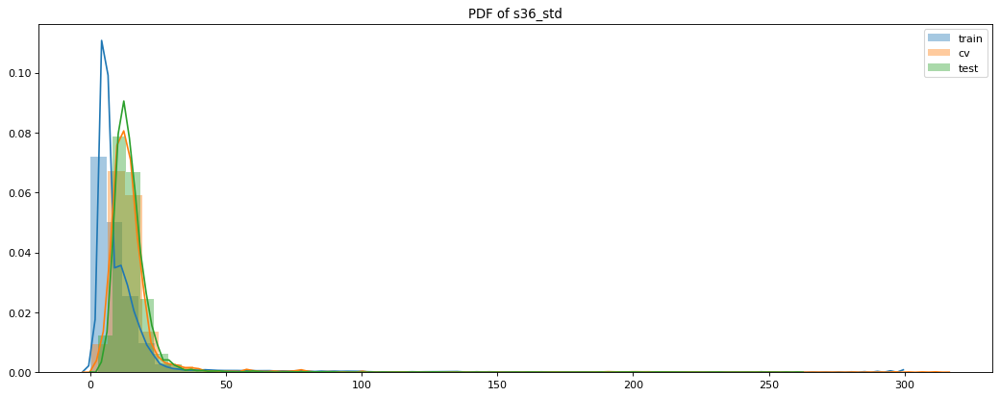

plot for: s36_mid


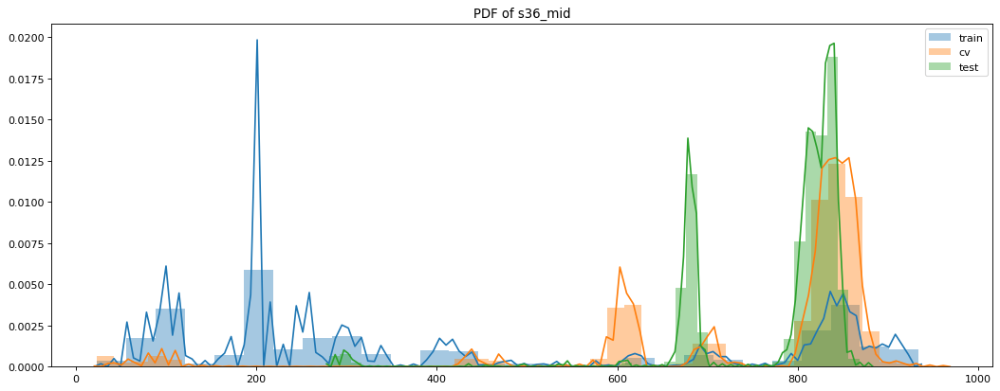

plot for: s36_min


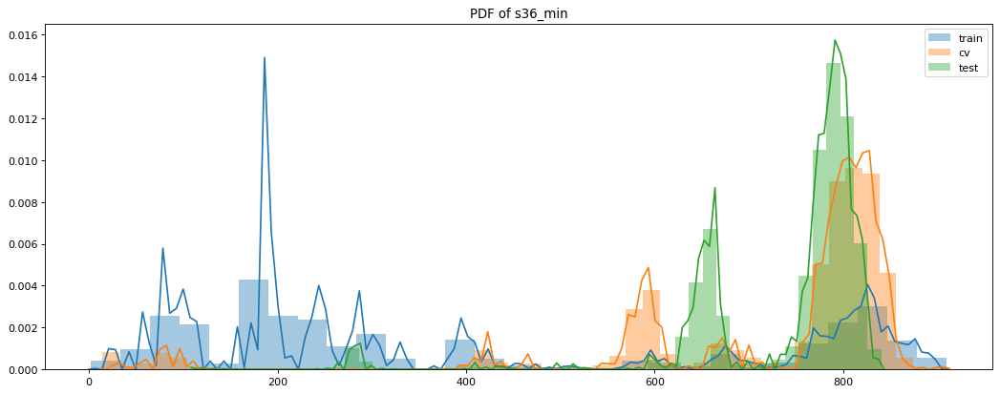

plot for: s36_max


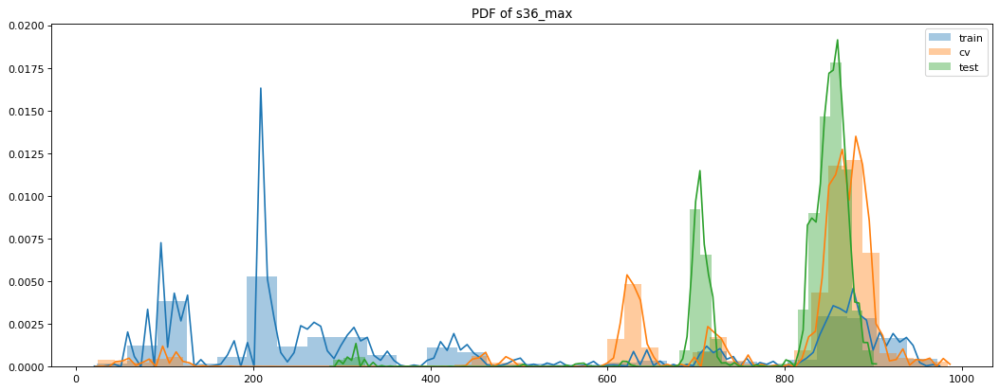

plot for: s37_mean


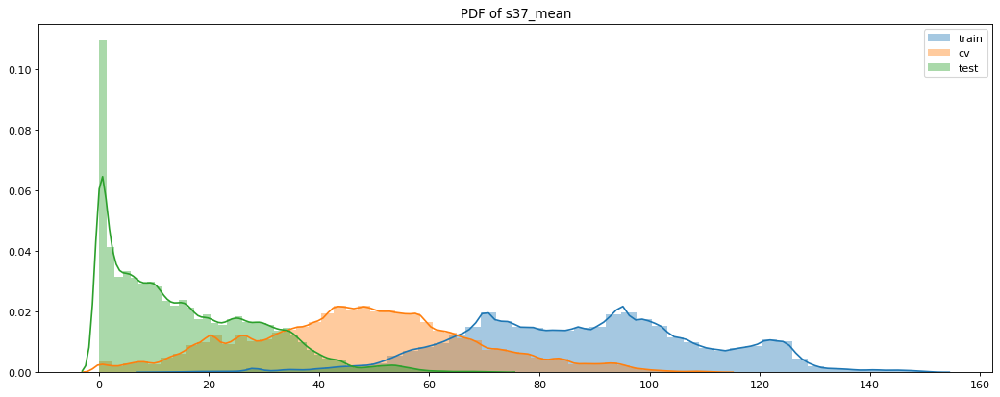

plot for: s37_std


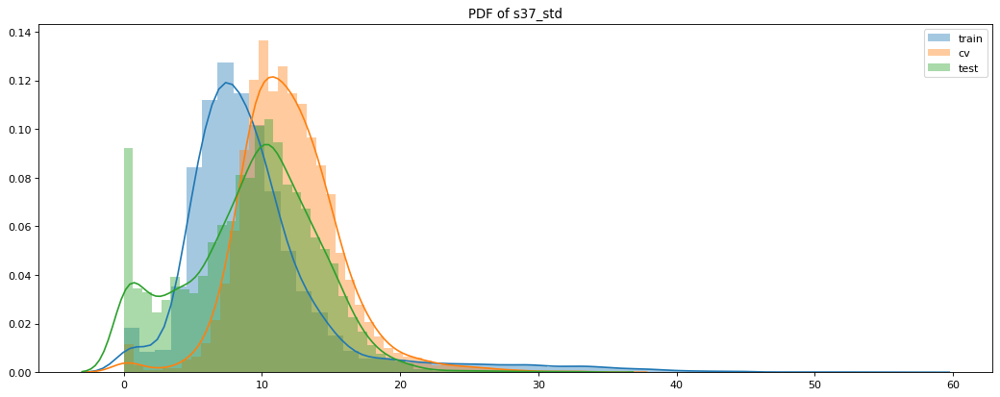

plot for: s37_mid


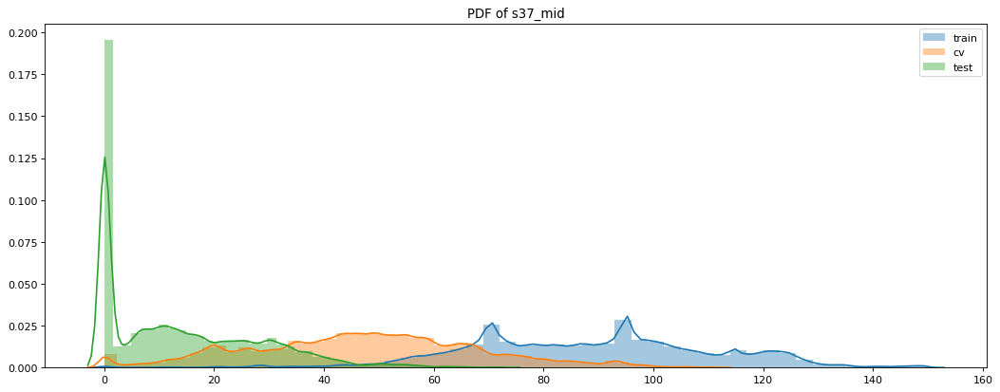

plot for: s37_min


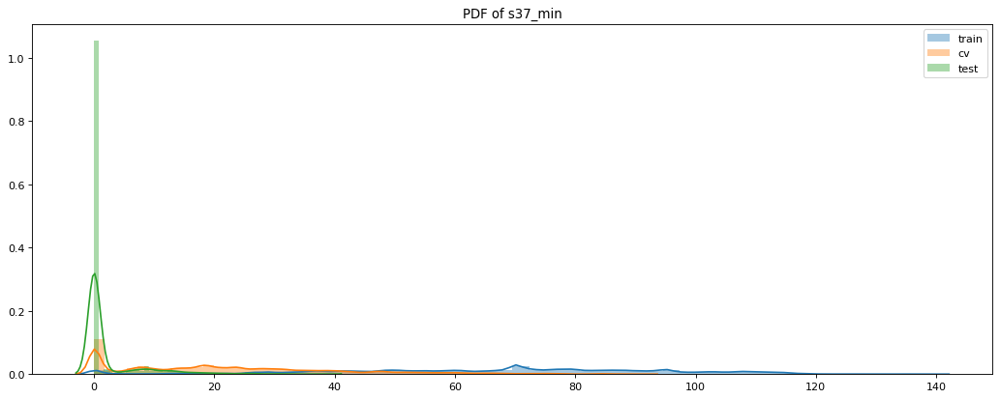

plot for: s37_max


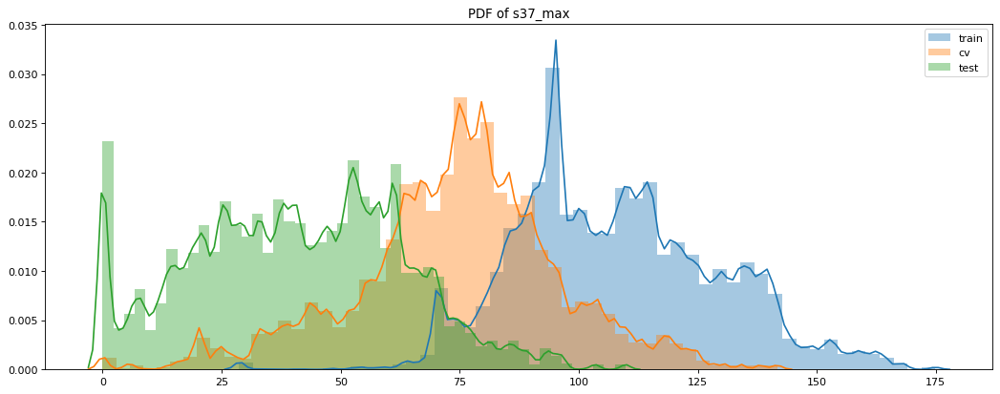

plot for: s38_mean


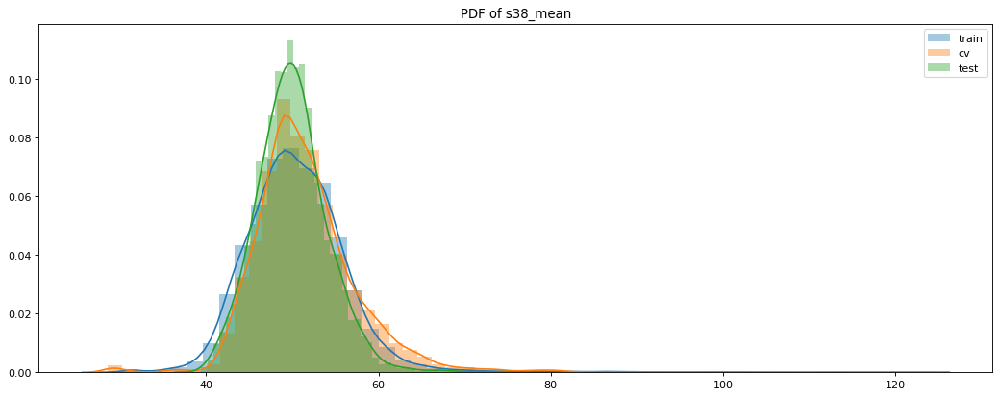

plot for: s38_std


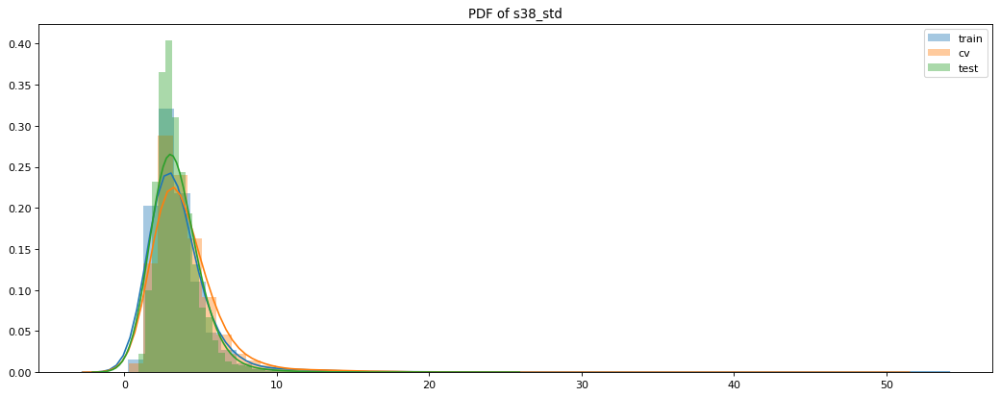

plot for: s38_mid


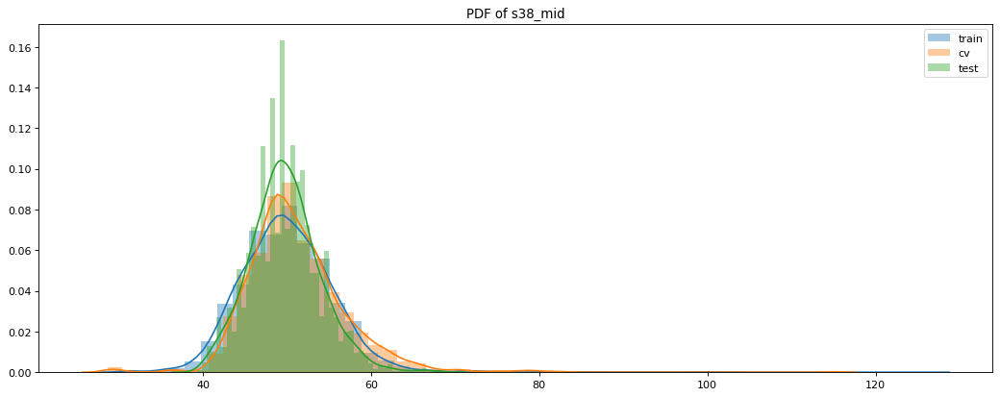

plot for: s38_min


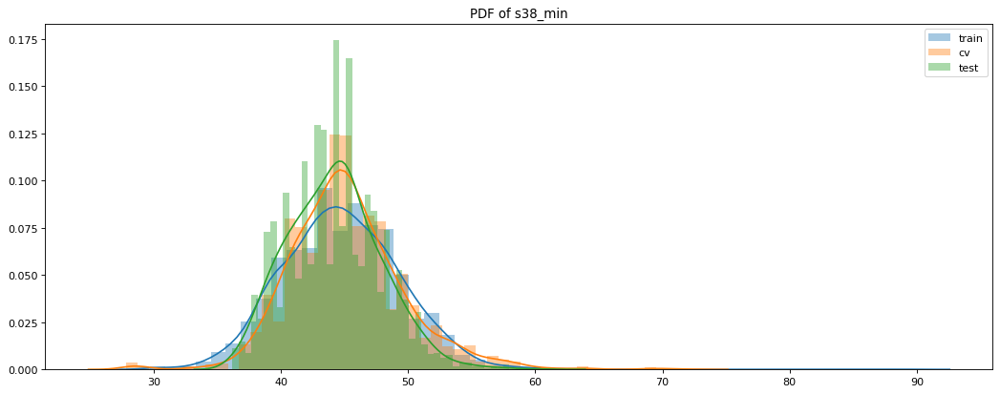

plot for: s38_max


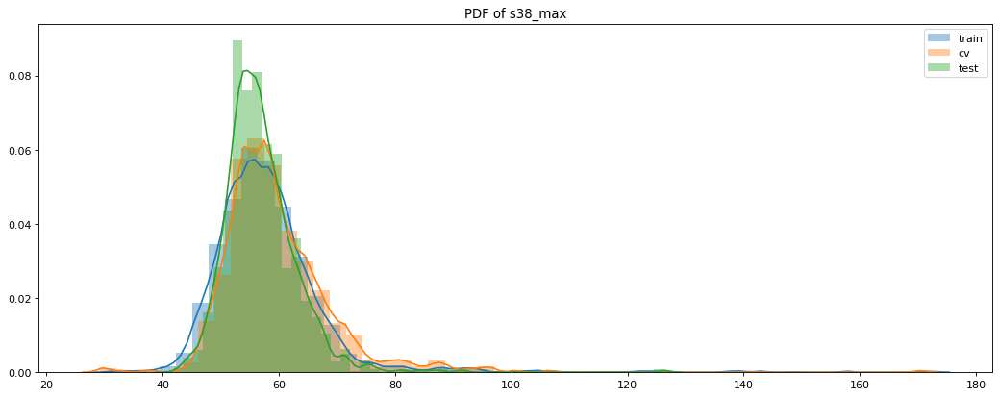

plot for: s39_mean


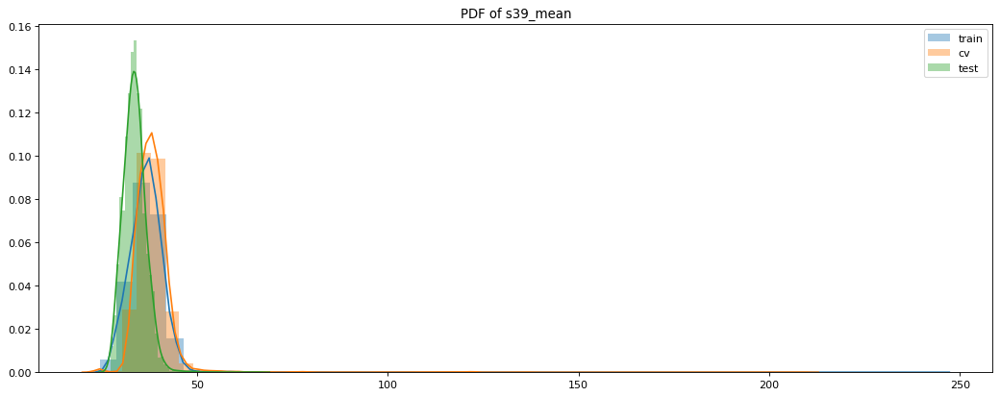

plot for: s39_std


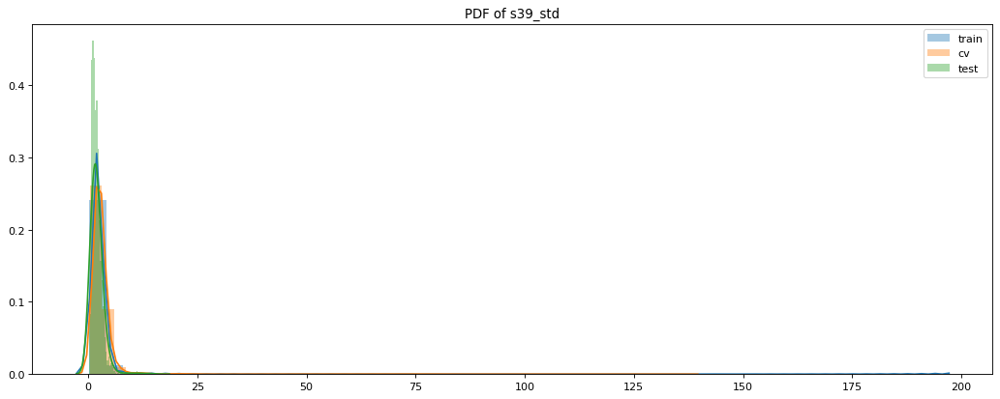

plot for: s39_mid


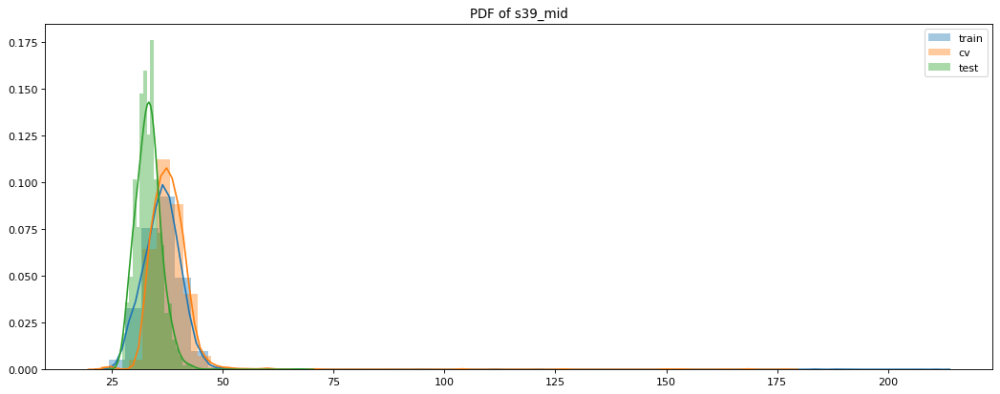

plot for: s39_min


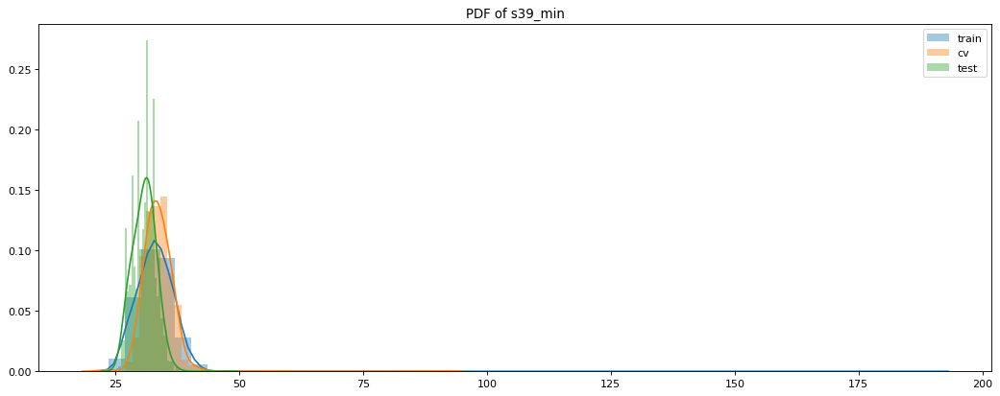

plot for: s39_max


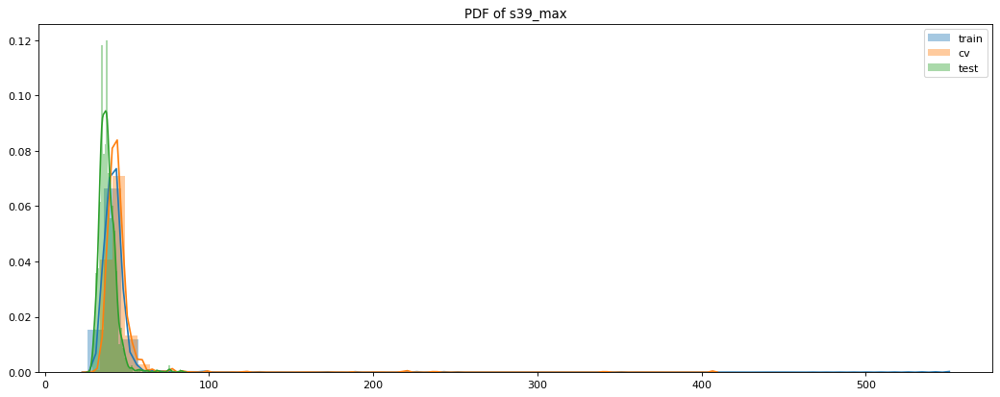

plot for: s40_mean


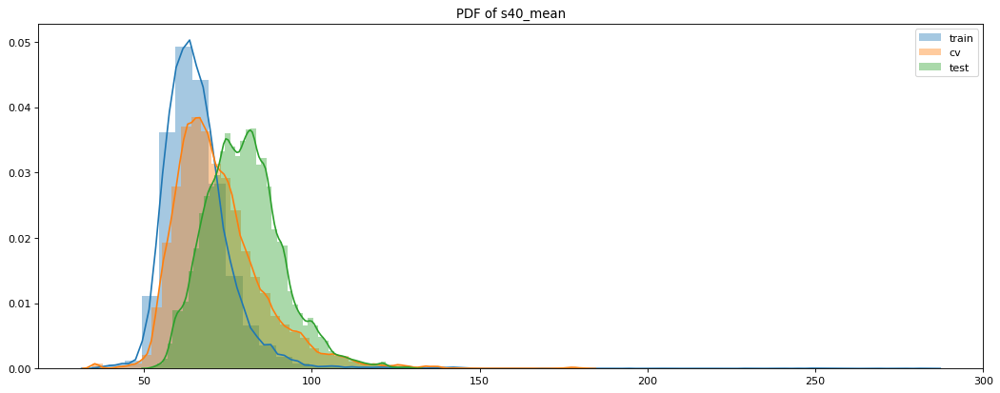

plot for: s40_std


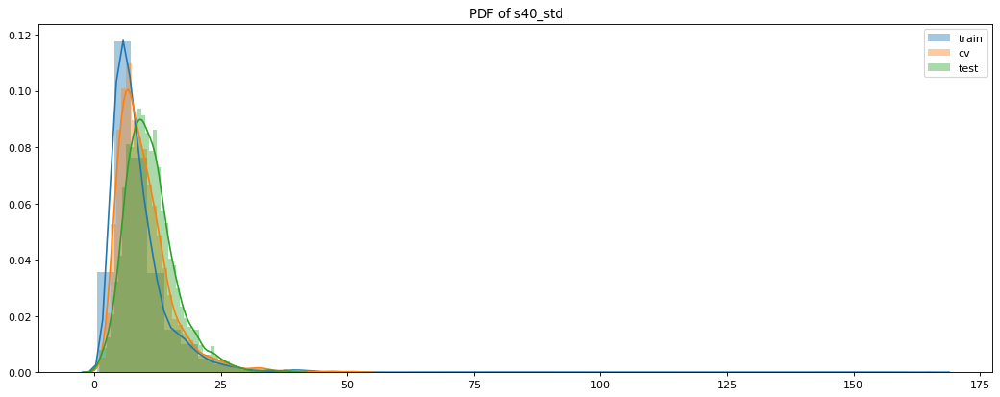

plot for: s40_mid


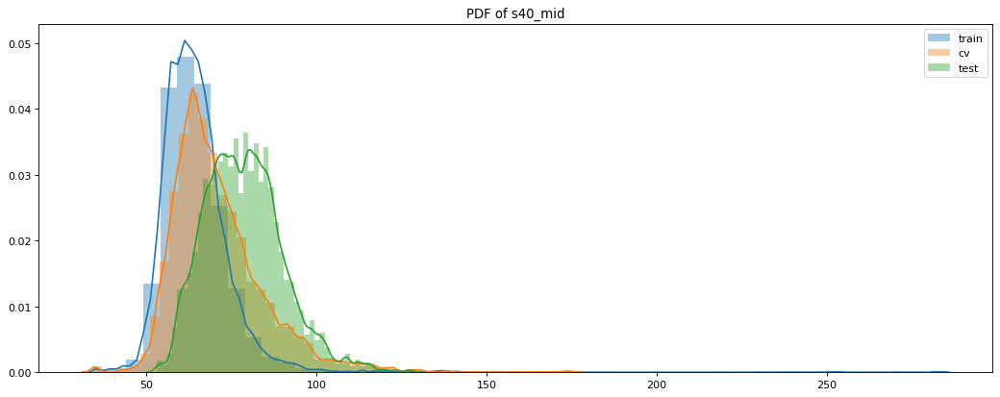

plot for: s40_min


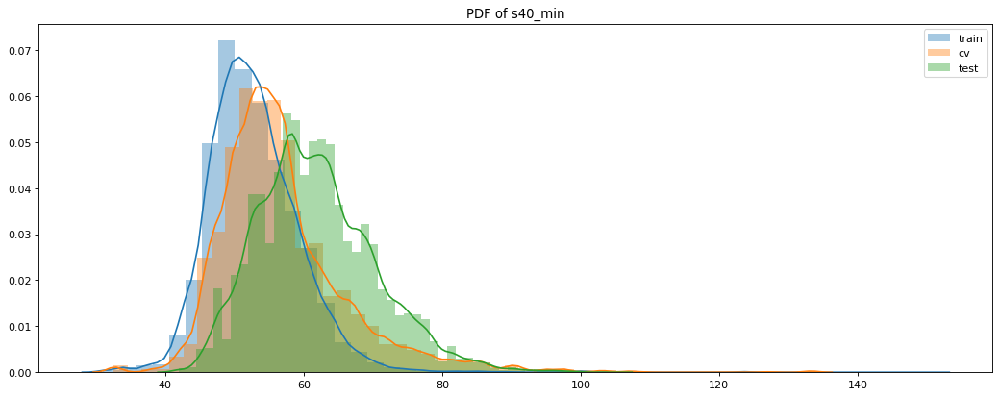

plot for: s40_max


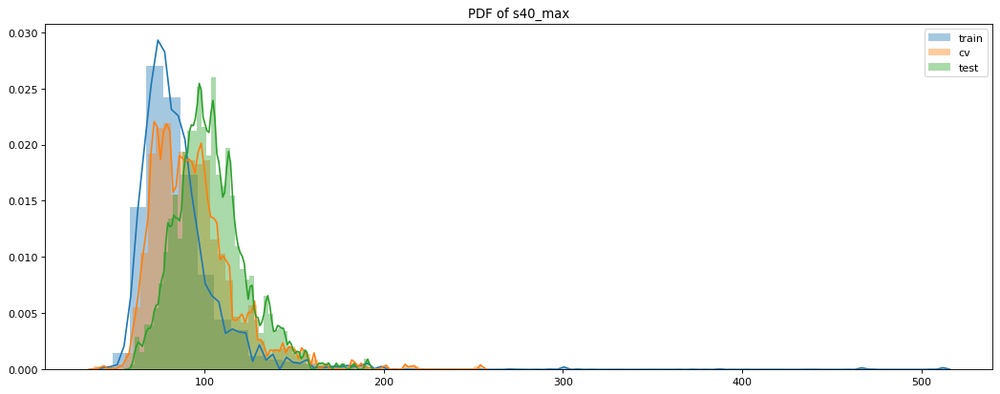

plot for: s41_mean


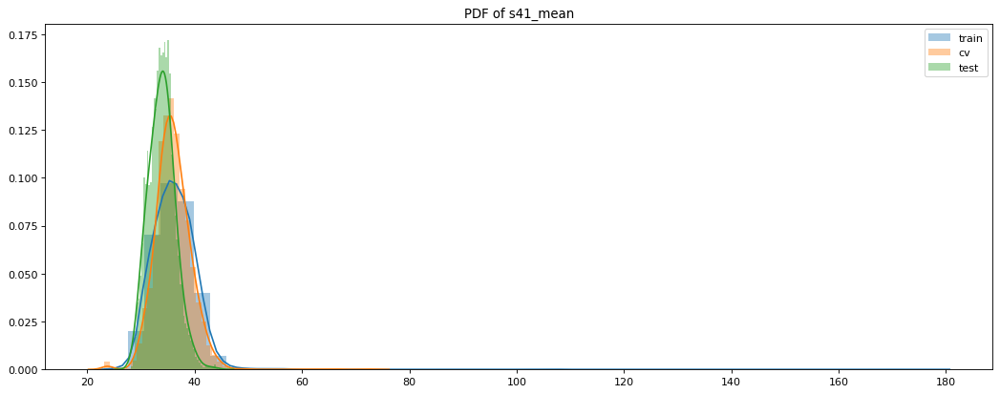

plot for: s41_std


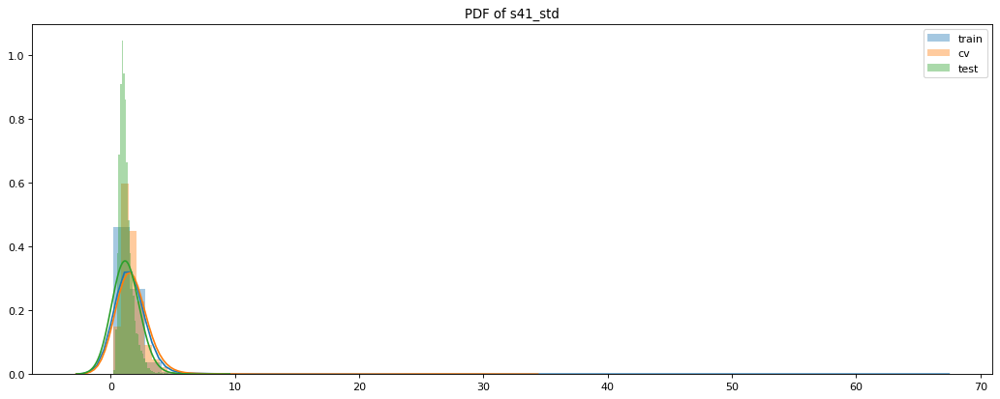

plot for: s41_mid


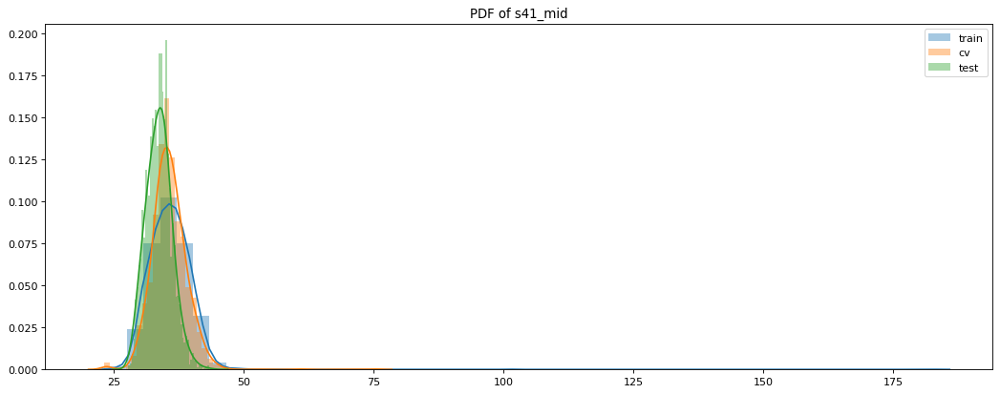

plot for: s41_min


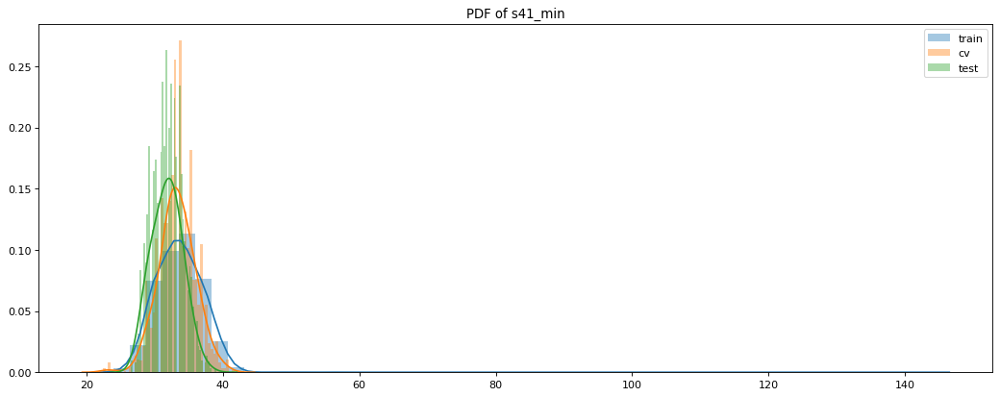

plot for: s41_max


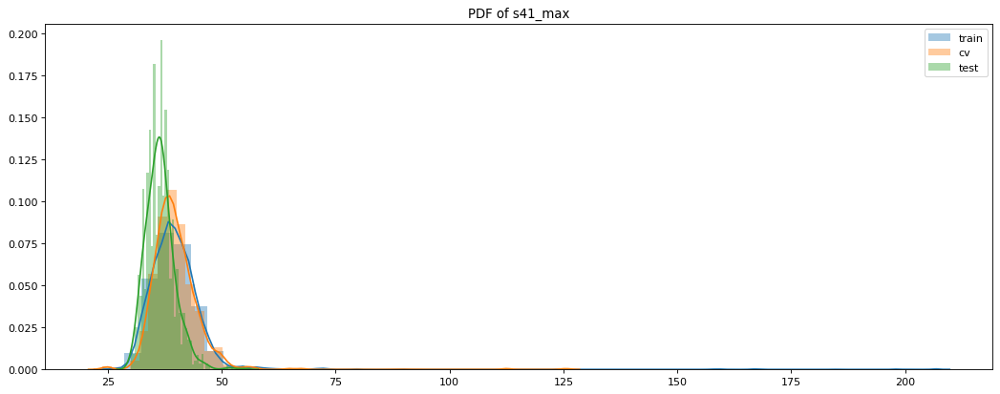

plot for: s42_mean


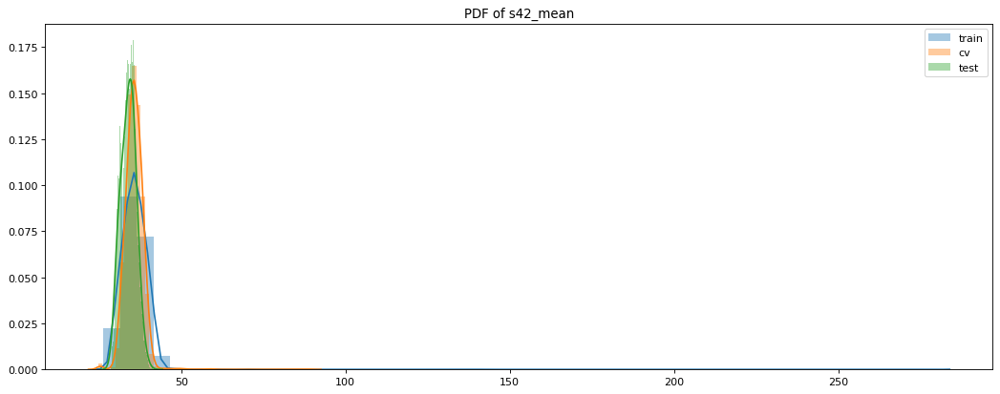

plot for: s42_std


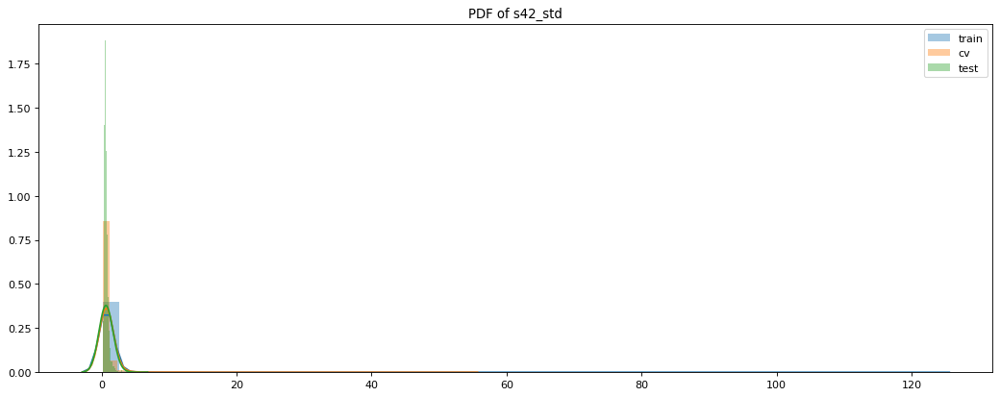

plot for: s42_mid


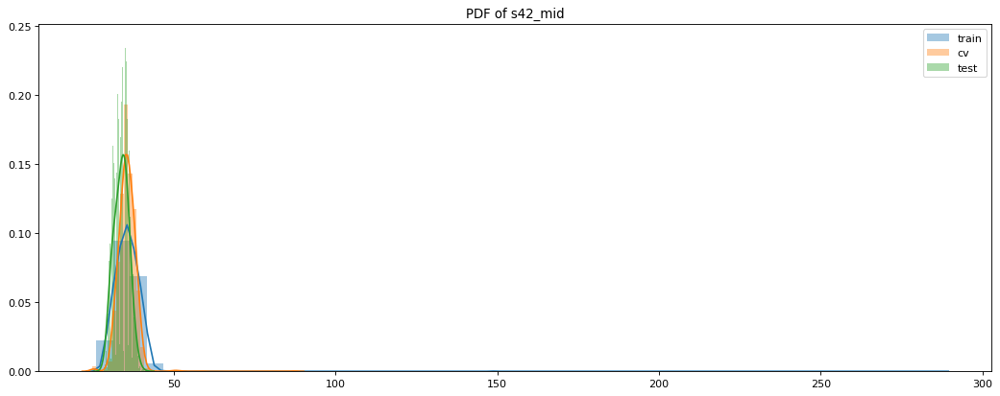

plot for: s42_min


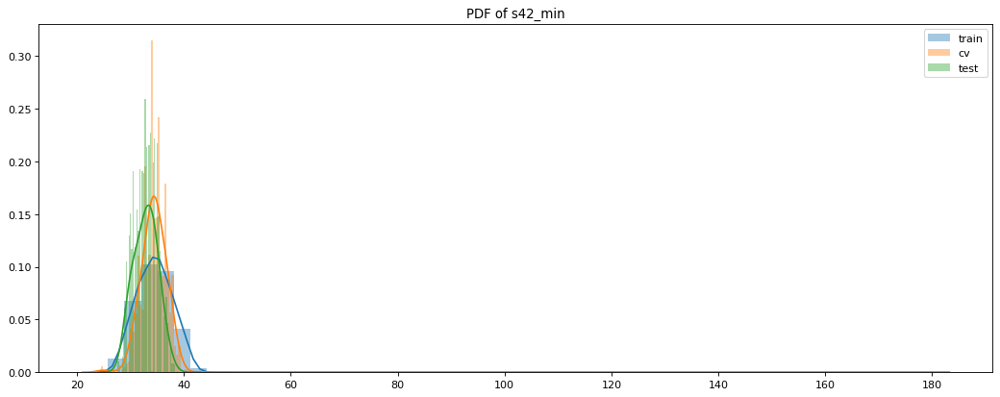

plot for: s42_max


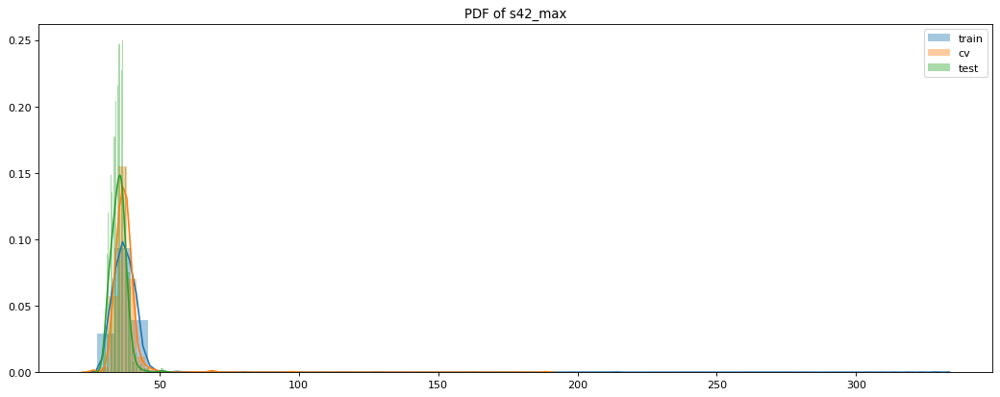

plot for: s43_mean


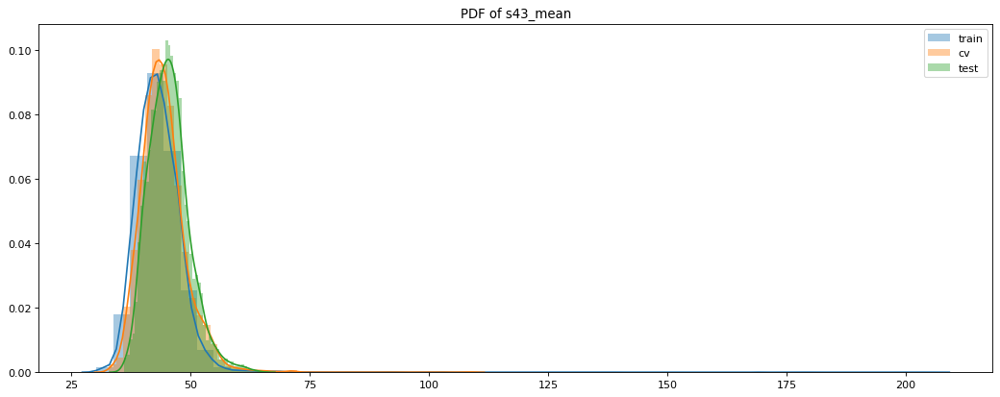

plot for: s43_std


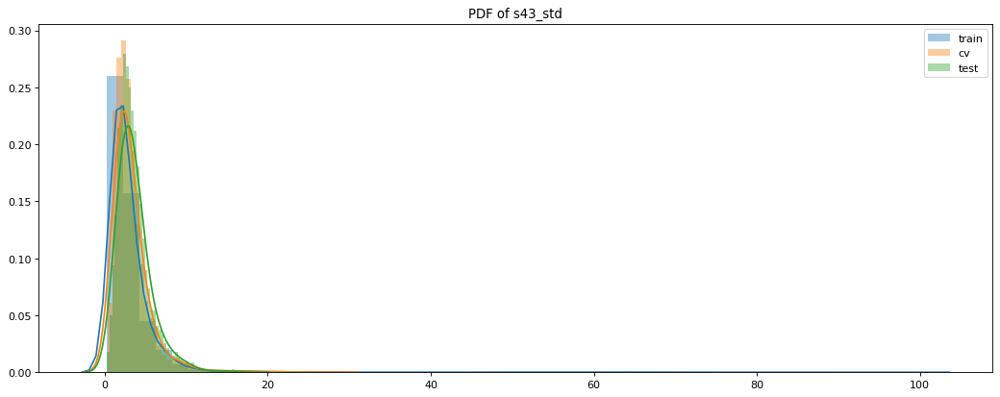

plot for: s43_mid


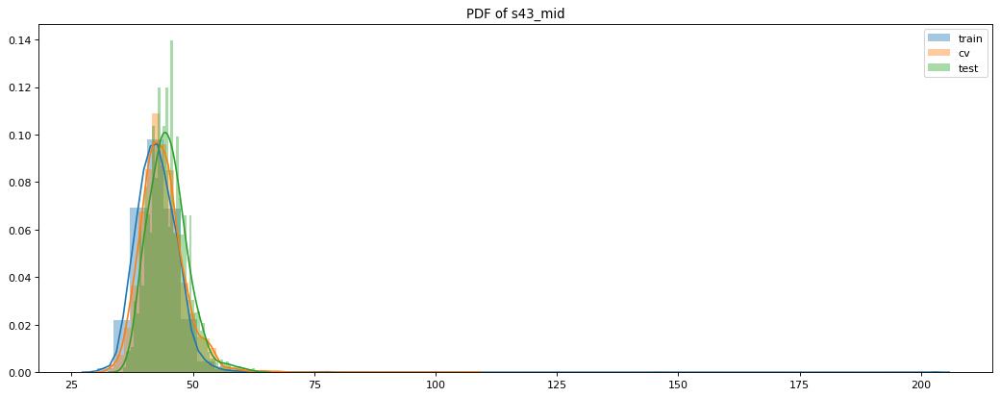

plot for: s43_min


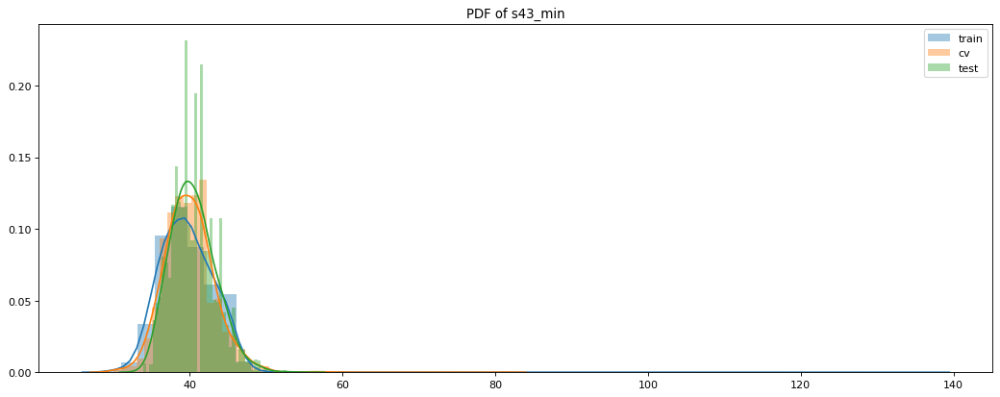

plot for: s43_max


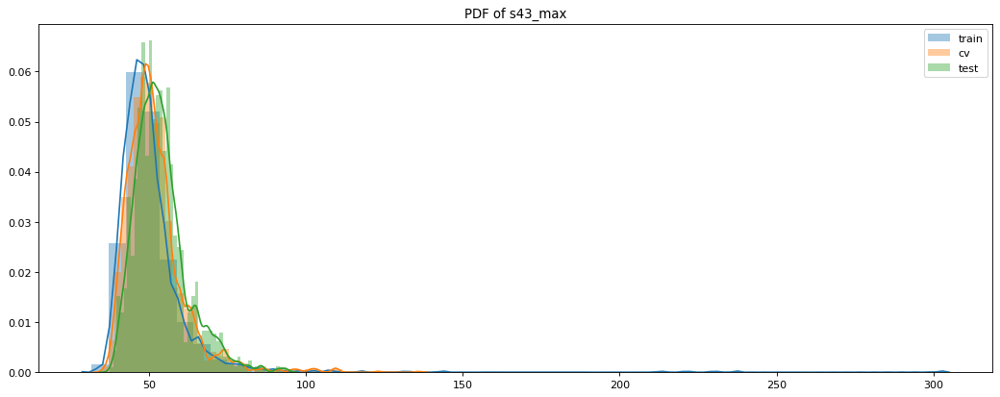

plot for: s44_mean


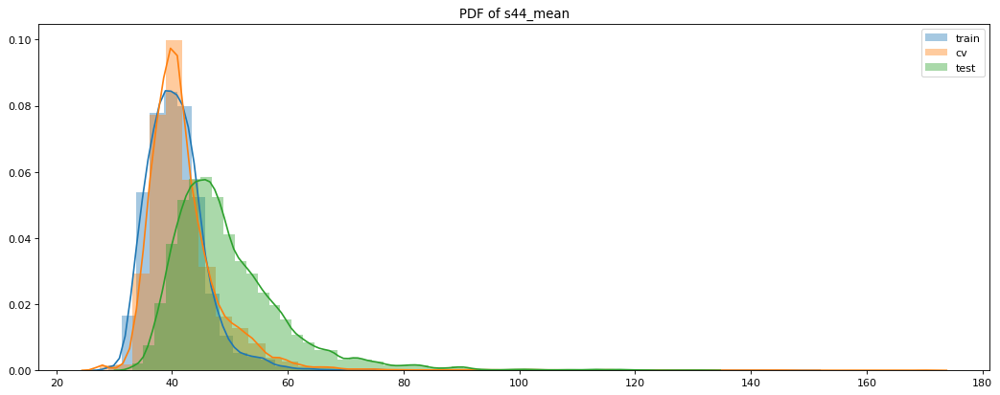

plot for: s44_std


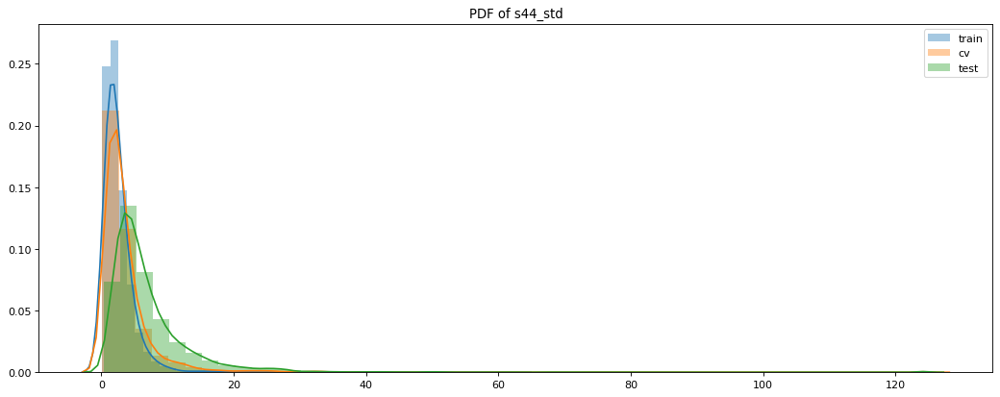

plot for: s44_mid


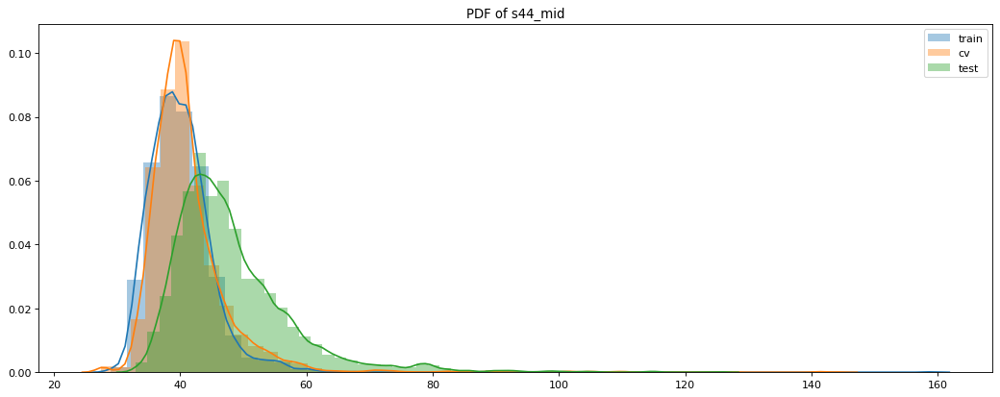

plot for: s44_min


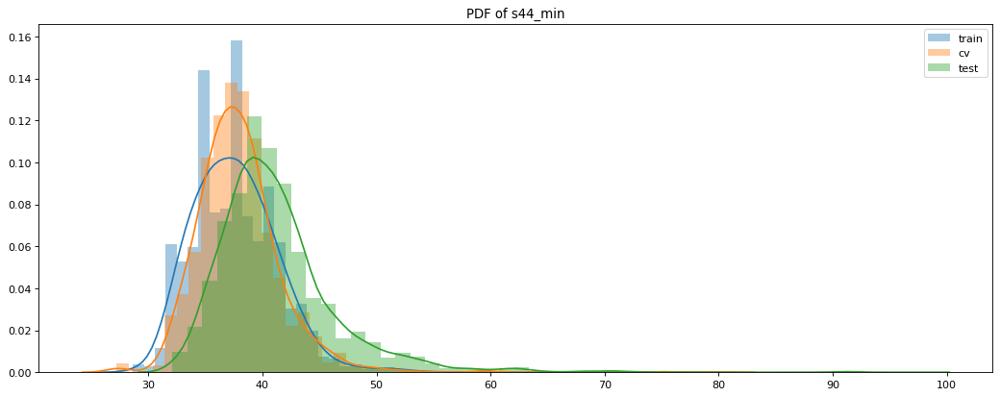

plot for: s44_max


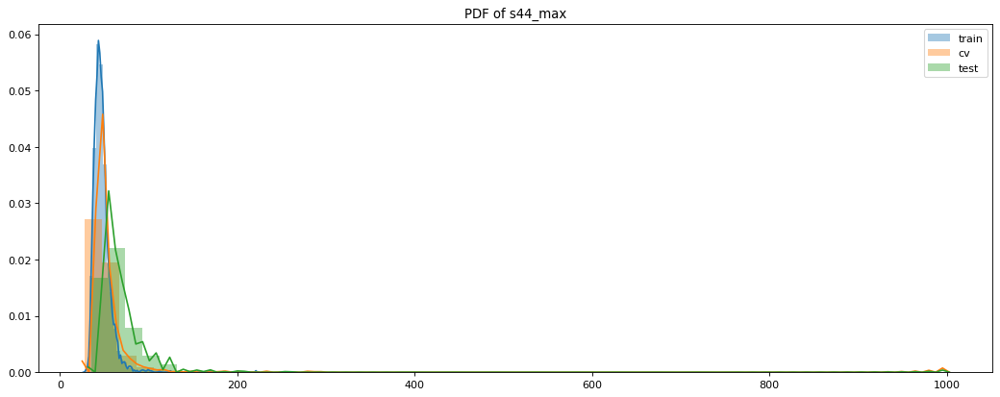

plot for: s45_mean


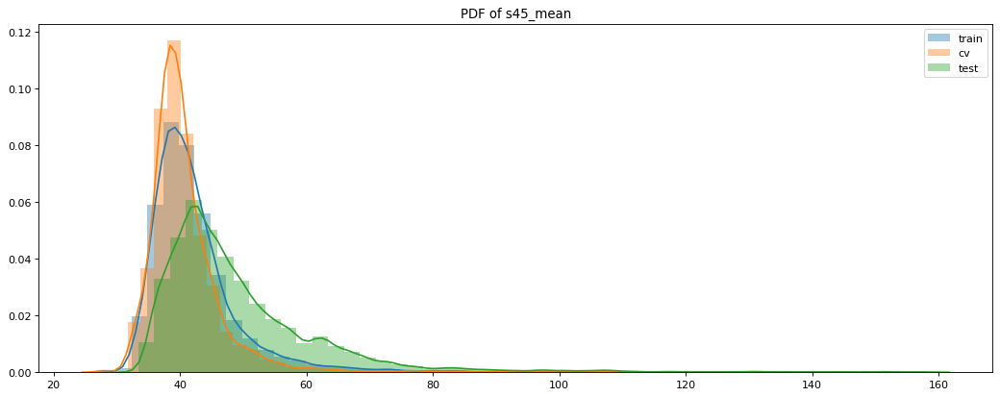

plot for: s45_std


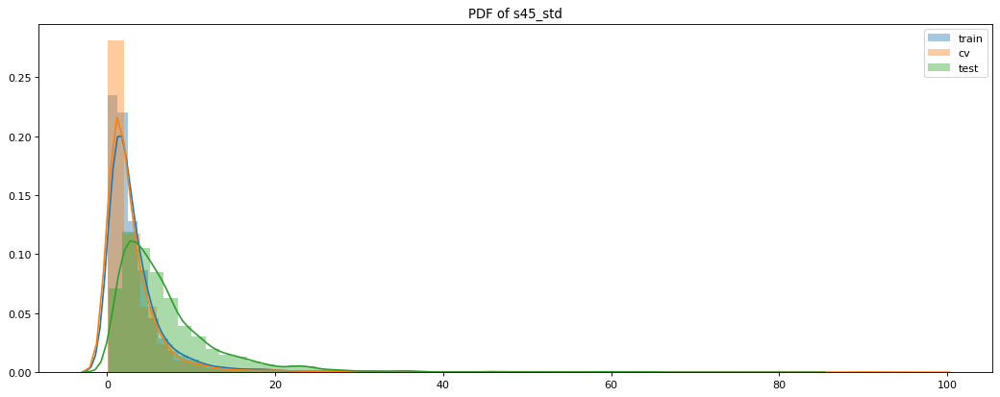

plot for: s45_mid


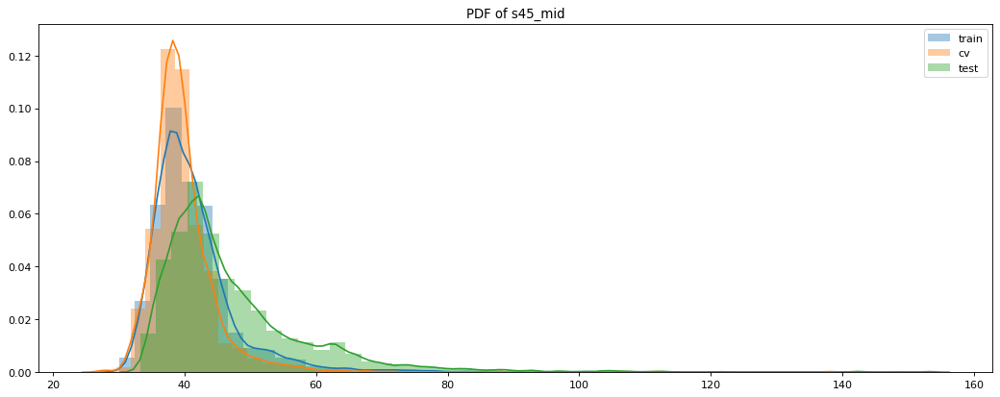

plot for: s45_min


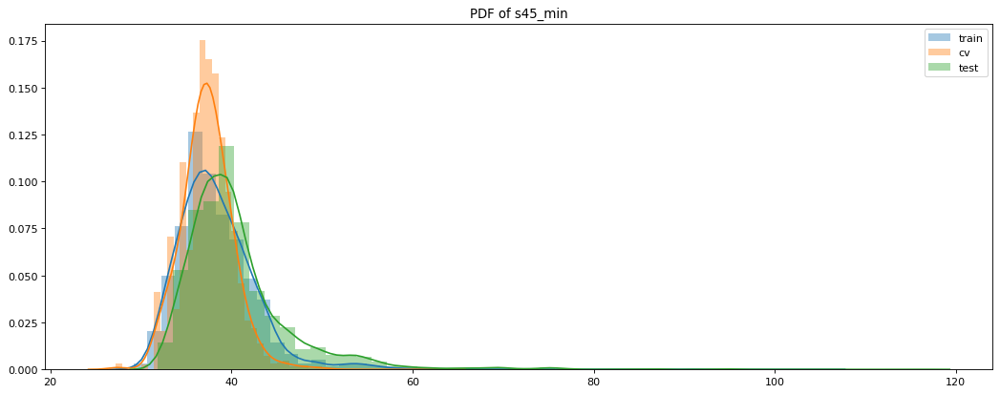

plot for: s45_max


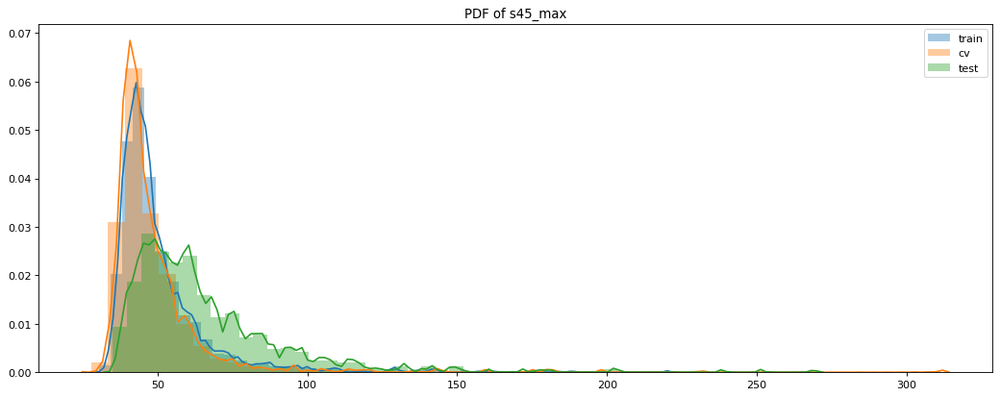

plot for: s46_mean


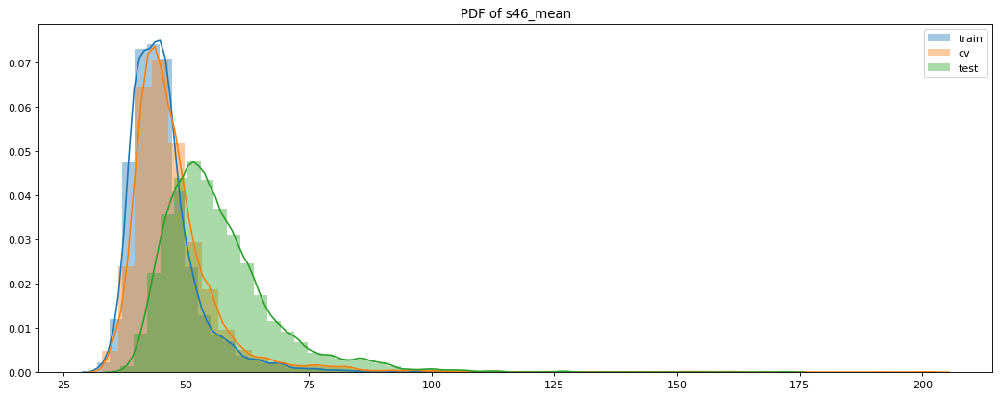

plot for: s46_std


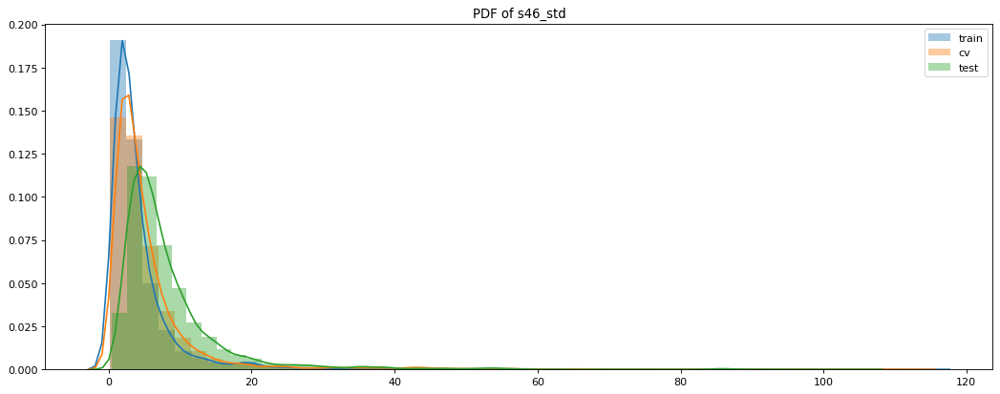

plot for: s46_mid


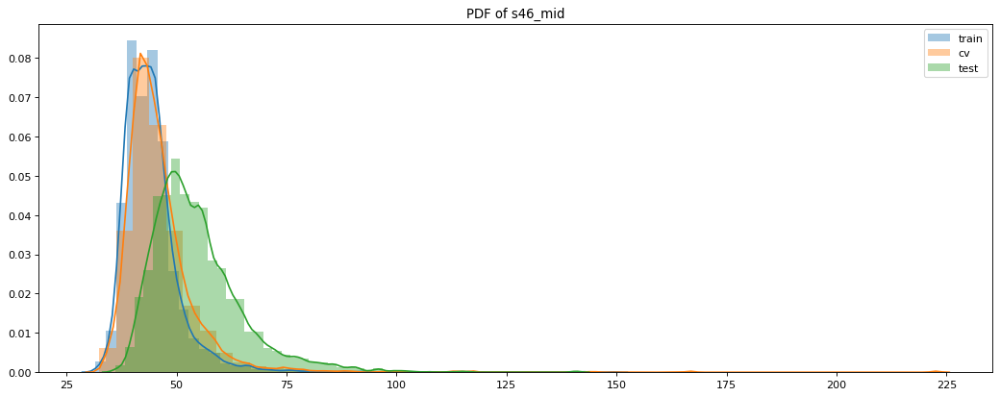

plot for: s46_min


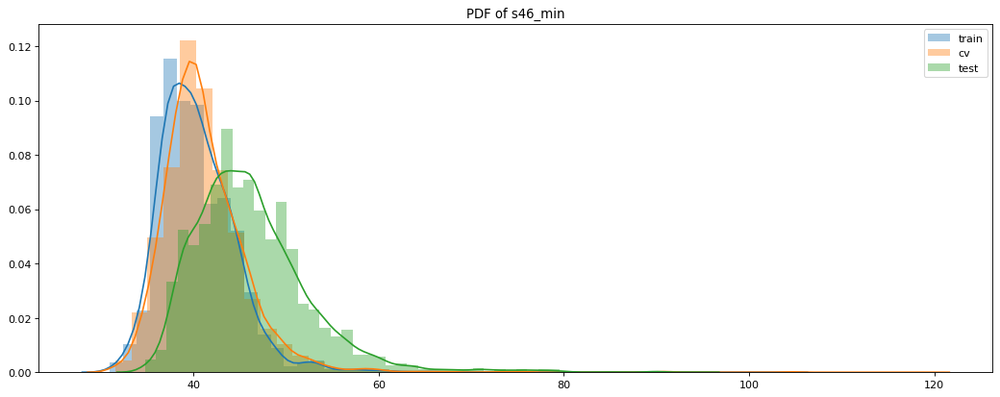

plot for: s46_max


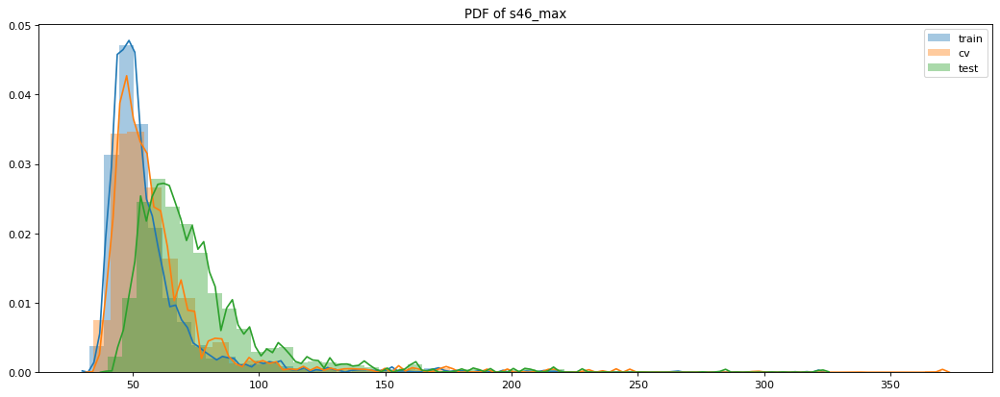

plot for: s47_mean


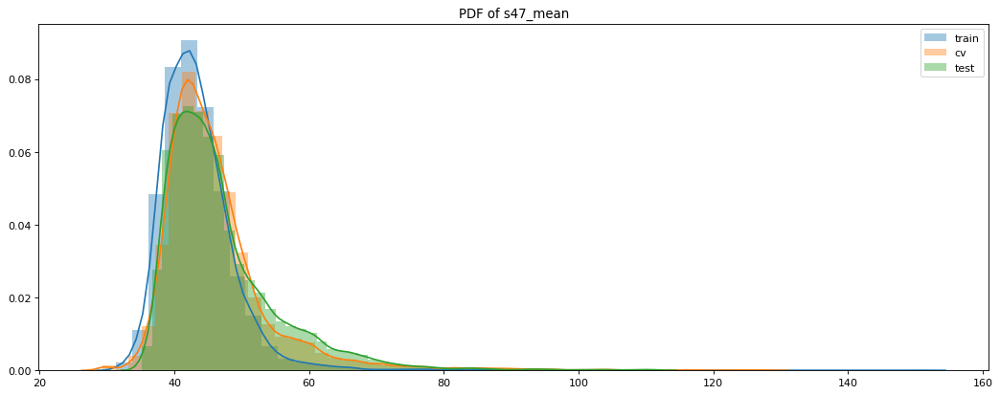

plot for: s47_std


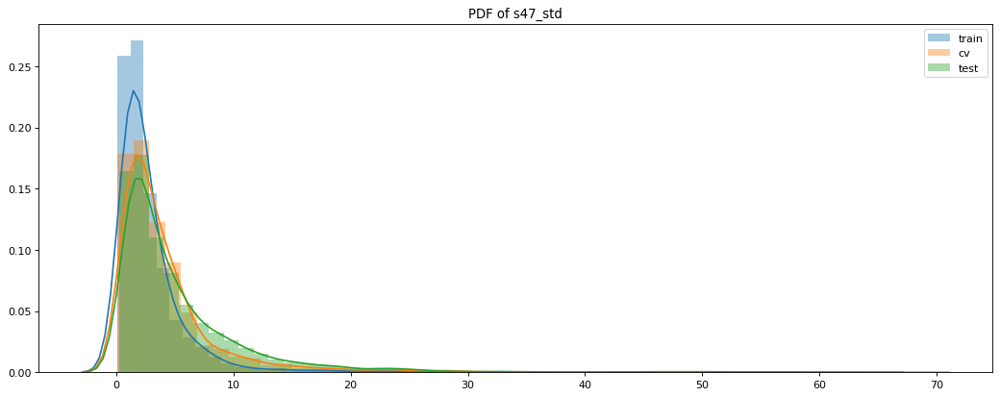

plot for: s47_mid


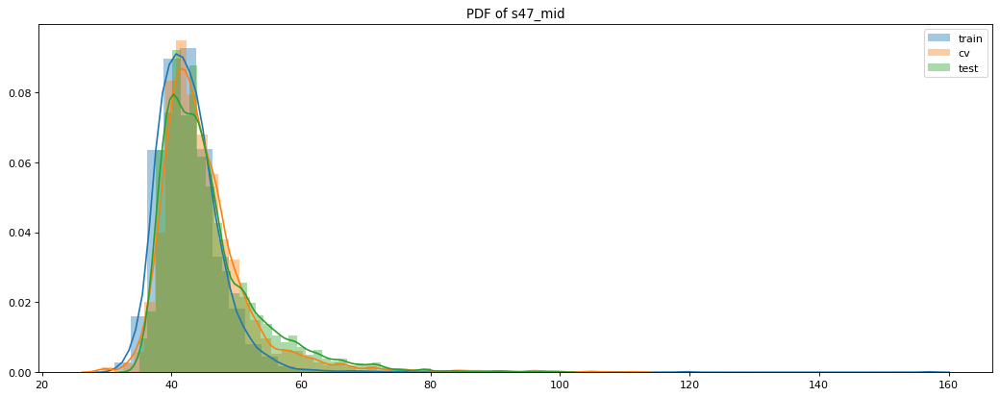

plot for: s47_min


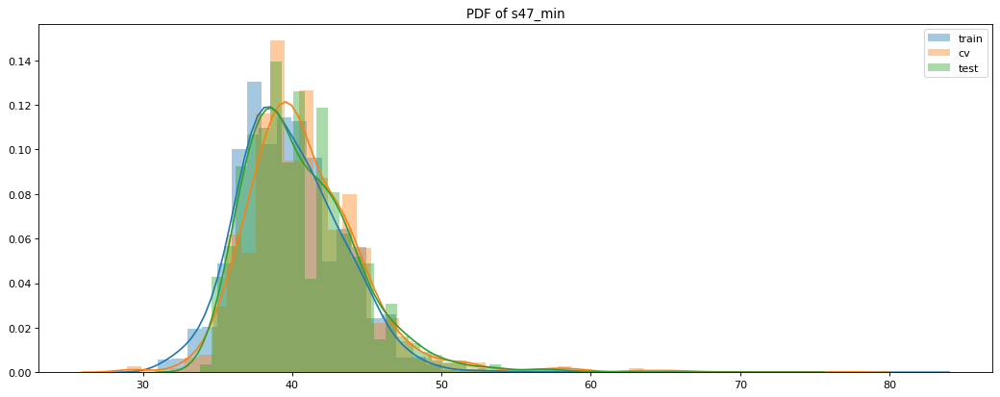

plot for: s47_max


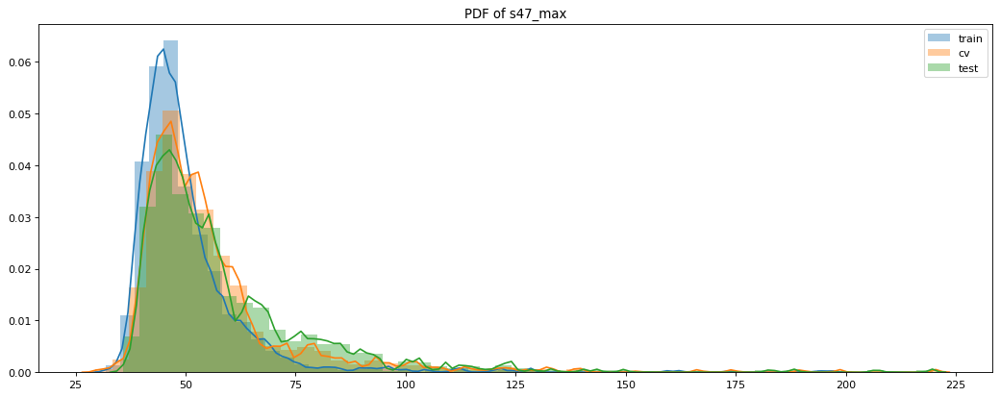

plot for: s48_mean


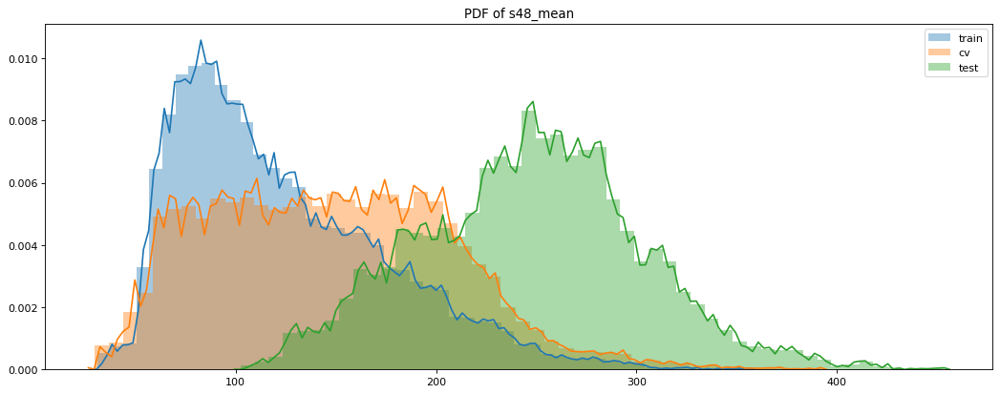

plot for: s48_std


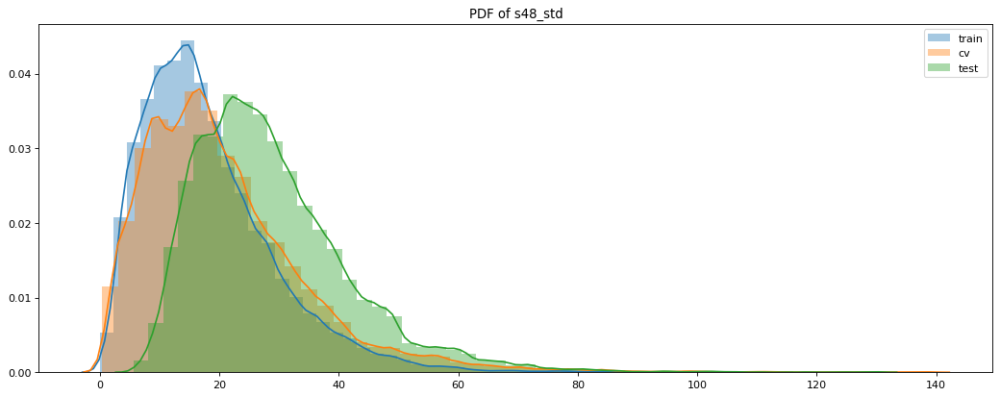

plot for: s48_mid


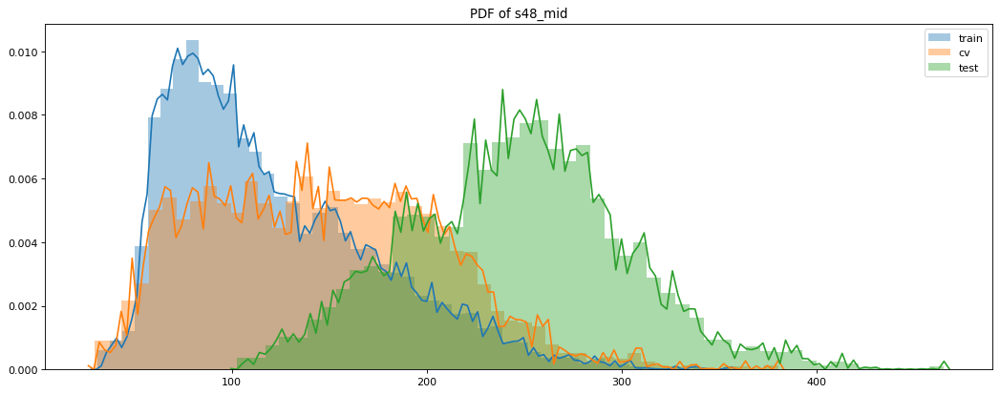

plot for: s48_min


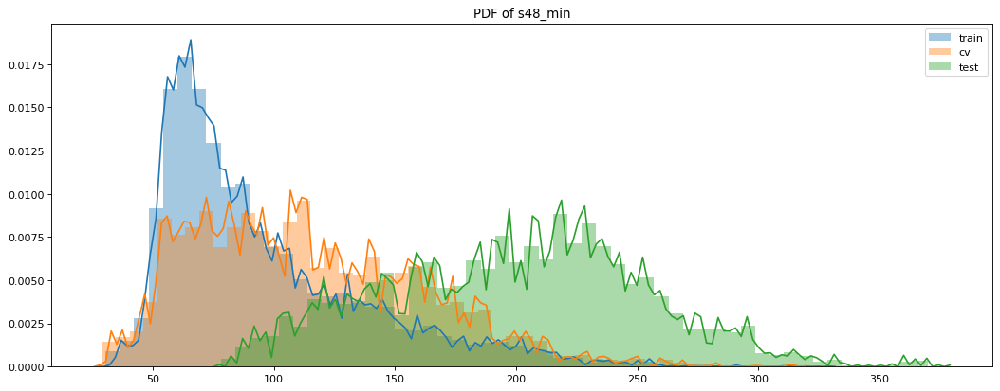

plot for: s48_max


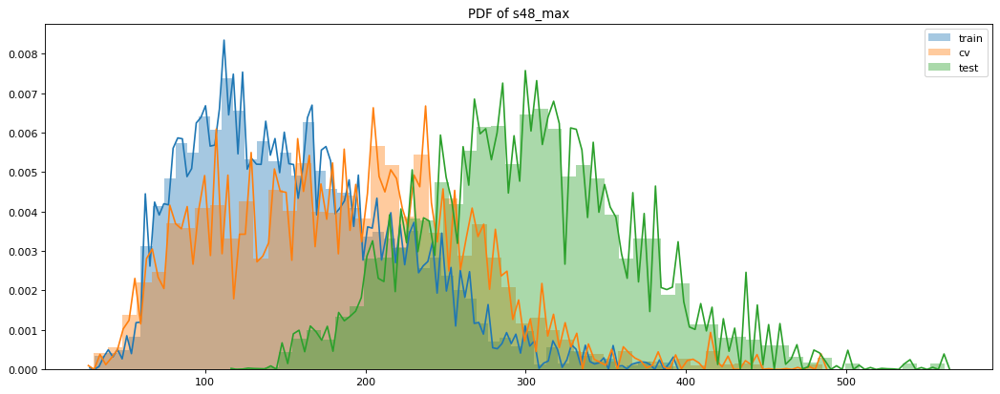

plot for: s49_mean


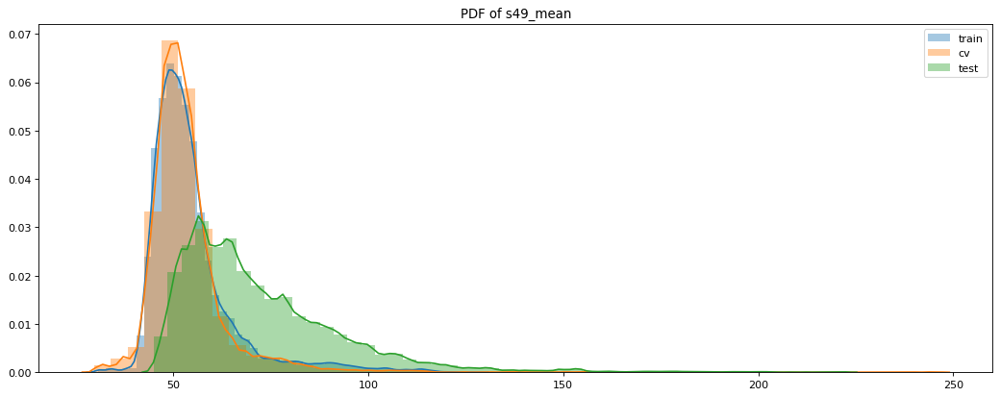

plot for: s49_std


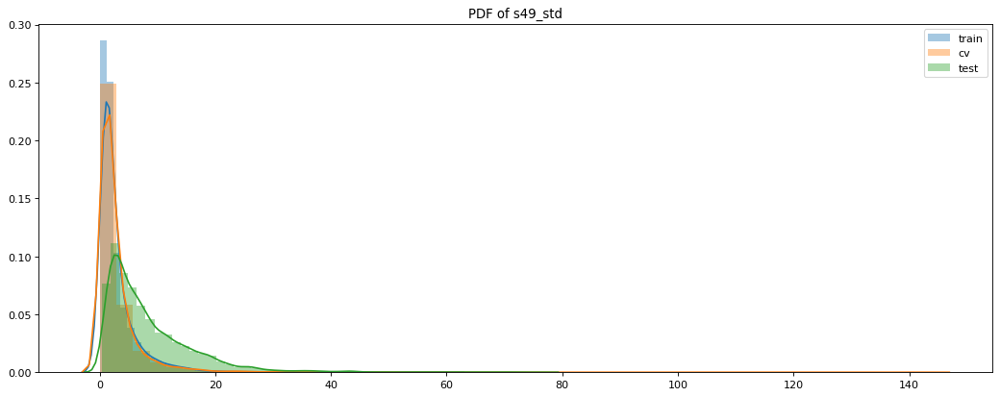

plot for: s49_mid


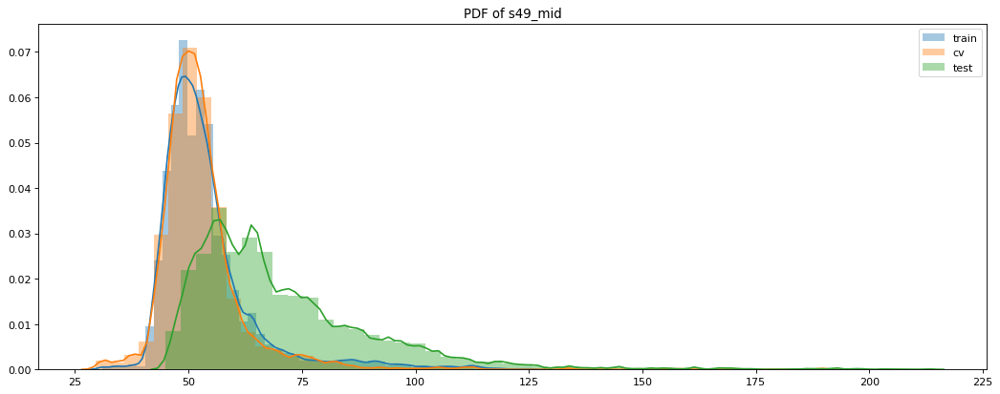

plot for: s49_min


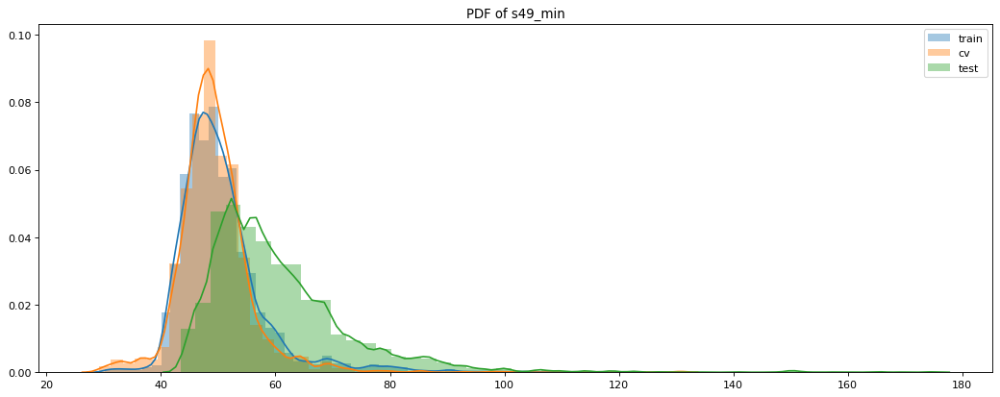

plot for: s49_max


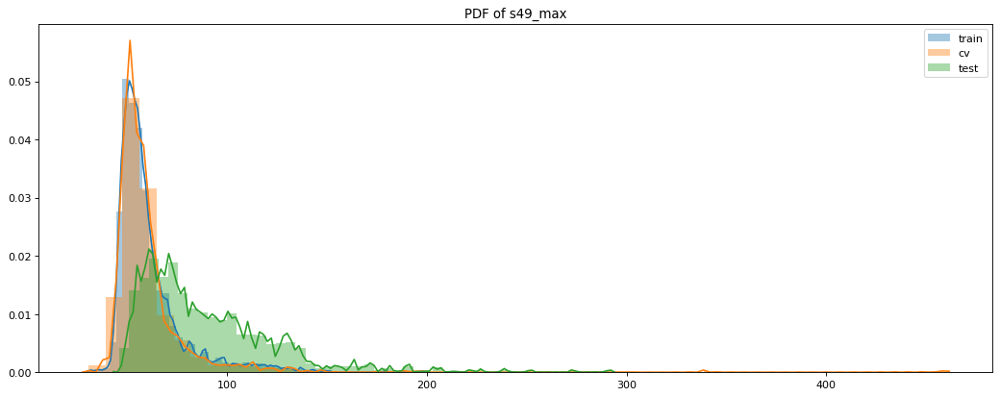

plot for: s50_mean


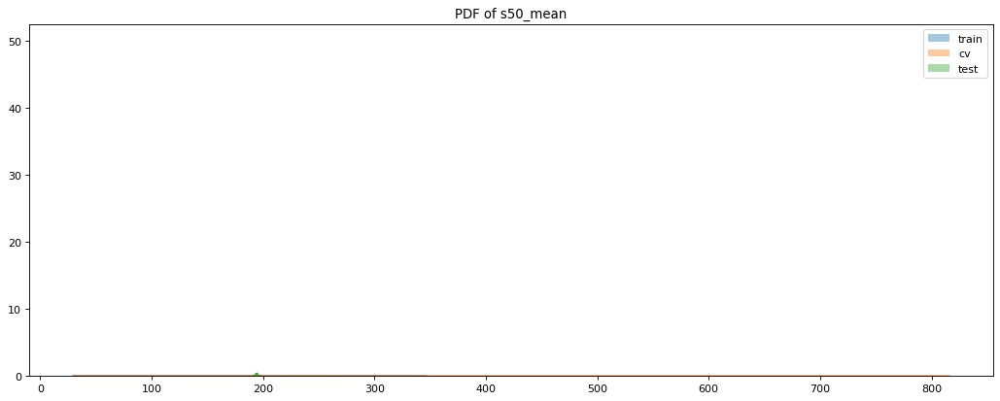

plot for: s50_std


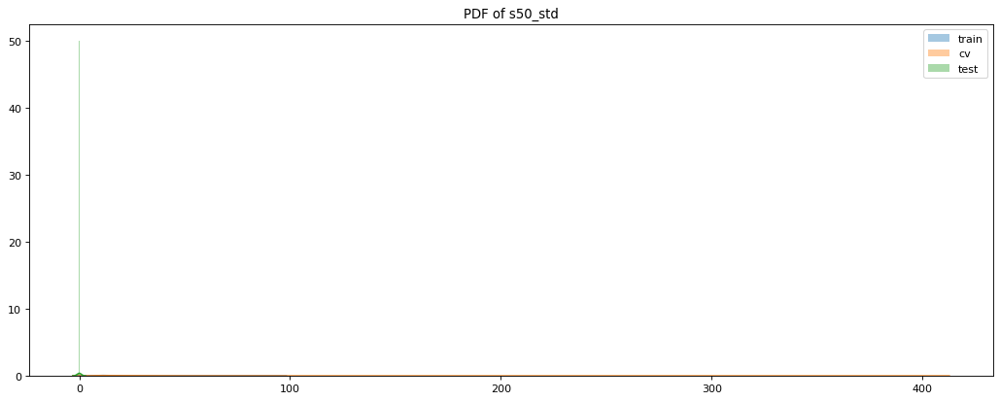

plot for: s50_mid


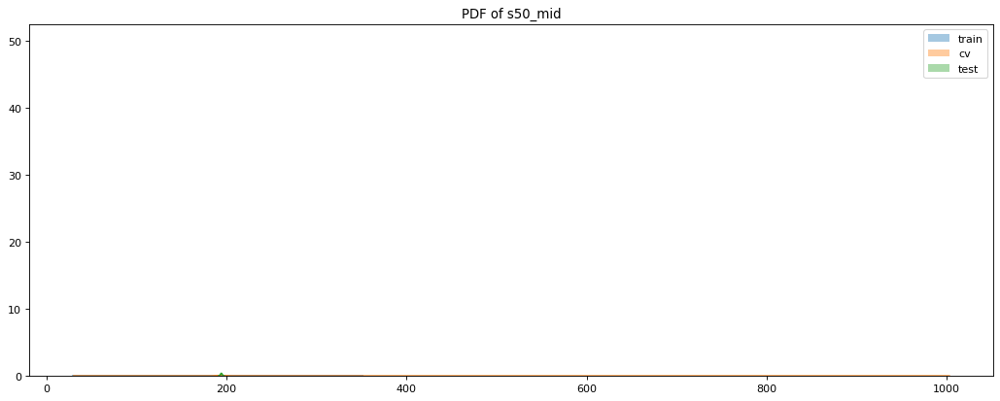

plot for: s50_min


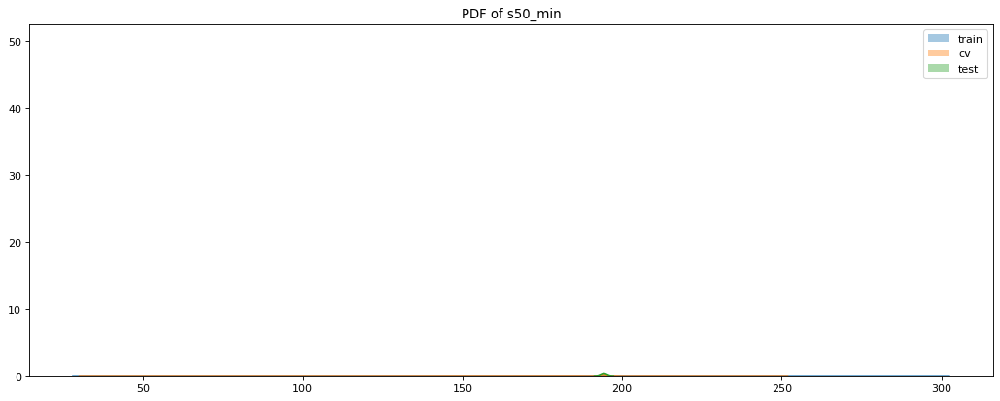

plot for: s50_max


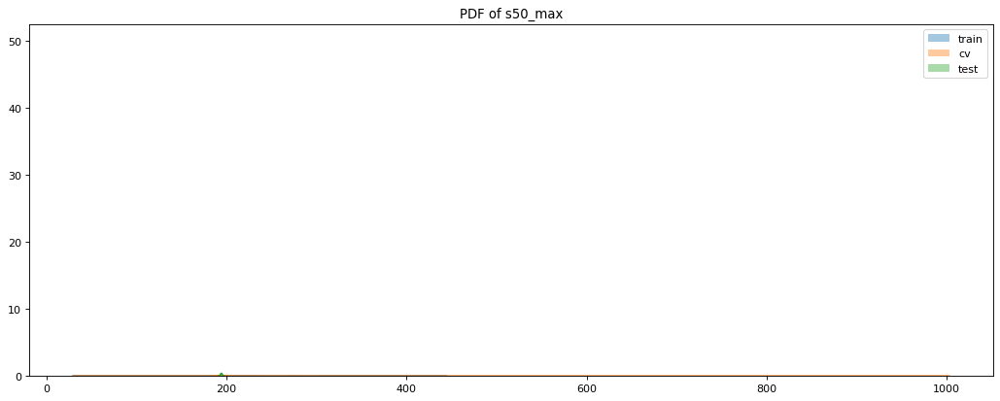

plot for: s51_mean


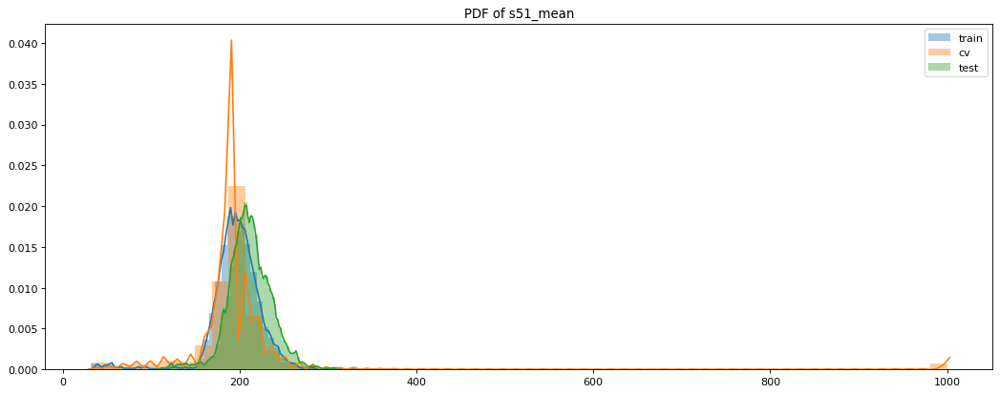

plot for: s51_std


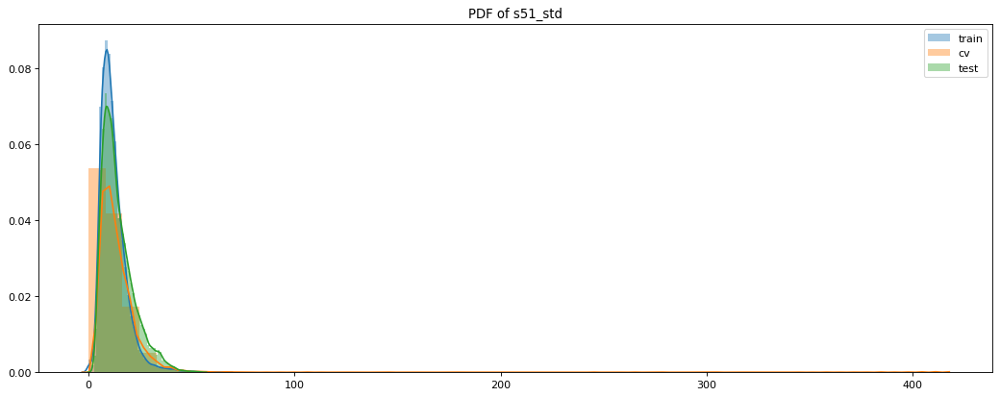

plot for: s51_mid


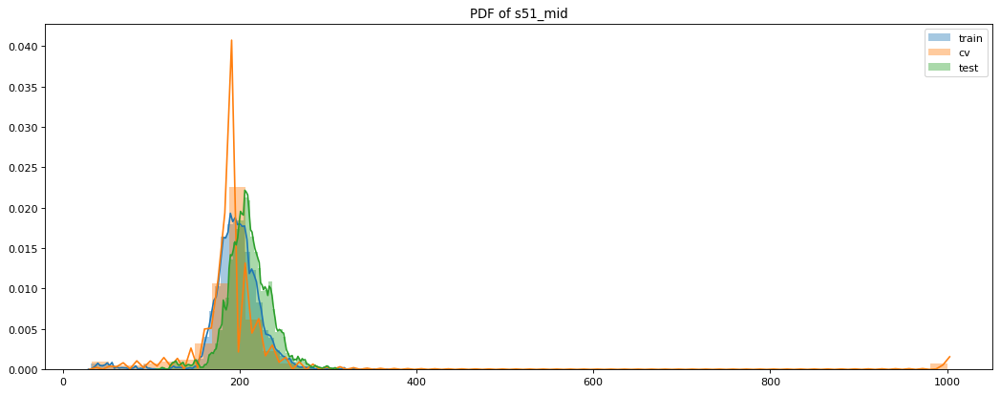

plot for: s51_min


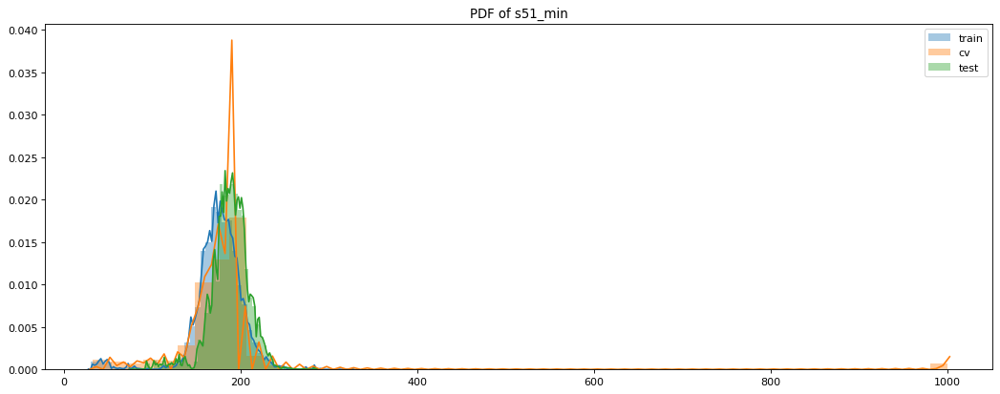

plot for: s51_max


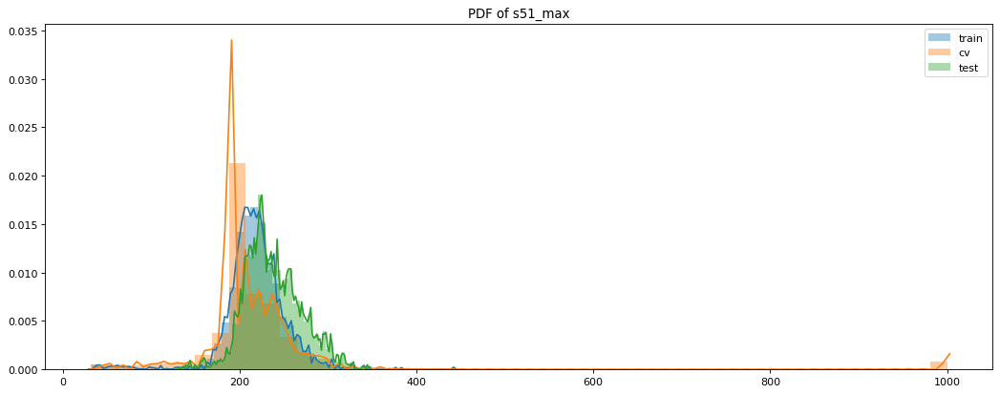

In [87]:
for col in X_train.columns[1:]:
    print('plot for:',col)
    fig=plt.figure(num=None, figsize=(16, 6), dpi=80, facecolor='w', edgecolor='k')
    sns.distplot(X_train[col].values,label='train',kde_kws = {'bw' : 1})
    sns.distplot(X_cv[col].values,label='cv',kde_kws = {'bw' : 1})
    sns.distplot(X_test[col].values,label='test',kde_kws = {'bw' : 1})
    plt.title('PDF of {0}'.format(col))
    plt.legend()
    plt.show()

- from above, we can see there are very few features that have overlapped PDF. most of the features have different distribution among train cv and test dataset.


# Checking disrtitution with modeling mothed:
- I made y_train as class 0, y_cv as class 1, and y_test as 2.
- concatenated these three datasets and trained the model on it and check model can differentiate these classes or not.

In [90]:
y1=np.array([0]*y_train.shape[0])
y2=np.array([1]*y_cv.shape[0])
y3=np.array([2]*y_test.shape[0])
X=pd.concat([X_train,X_cv,X_test]).copy() 
Y=np.append(y1,y2)
Y=np.append(Y,y3)
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
X_train_temp, X_test_temp, y_train_temp, y_test_temp = train_test_split(X, Y, test_size=0.33, random_state=42,stratify=Y)
clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_train_temp[X.columns[1:]], y_train_temp)
from sklearn.metrics import accuracy_score
print('train acc:',accuracy_score(y_train_temp, clf.predict(X_train_temp[X_train_temp.columns[1:]])))
print('test acc:',accuracy_score(y_test_temp, clf.predict(X_test_temp[X_train_temp.columns[1:]])))

train acc: 1.0
test acc: 0.999380073800738


- We got 100% accuracy, we will check for the features which are important to classify our train cv and test data and we will remove those features and train model with that remaining features.

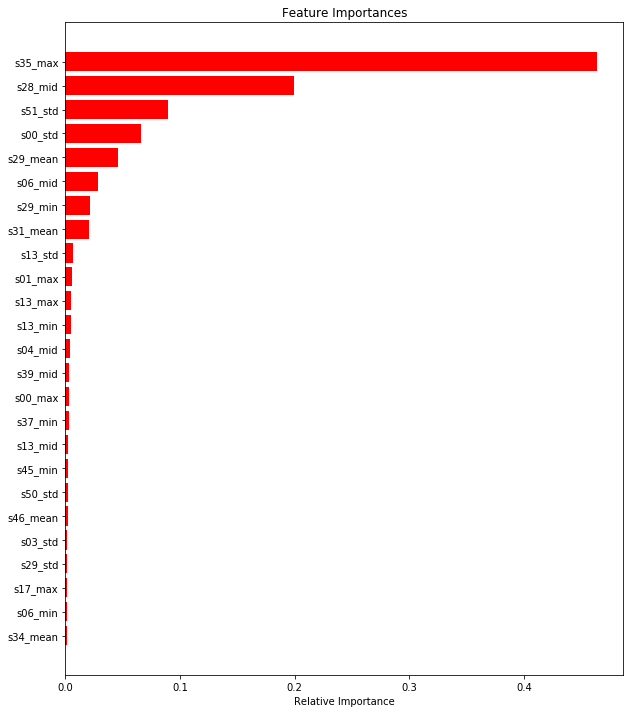

In [91]:
features = X_train_temp.columns[1:]
importances = clf.feature_importances_
indices = (np.argsort(importances))[-25:]
plt.figure(figsize=(10,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [92]:
imp_f=[features[i] for i in indices]
X_train_temp.drop(imp_f,inplace=True,axis=1)
X_test_temp.drop(imp_f,inplace=True,axis=1)

D:\study\anna\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [93]:
clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_train_temp[X_train_temp.columns[1:]], y_train_temp)
from sklearn.metrics import accuracy_score
print('train acc:',accuracy_score(y_train_temp, clf.predict(X_train_temp[X_train_temp.columns[1:]])))
print('test acc:',accuracy_score(y_test_temp, clf.predict(X_test_temp[X_train_temp.columns[1:]])))

train acc: 1.0
test acc: 0.9998228782287822


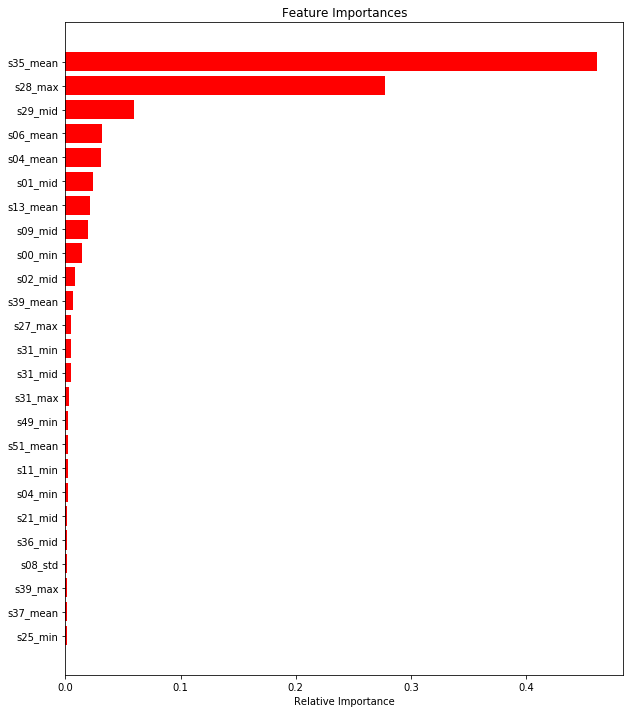

In [94]:
features = X_train_temp.columns[1:]
importances = clf.feature_importances_
indices = (np.argsort(importances))[-25:]
plt.figure(figsize=(10,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [95]:
imp_f=[features[i] for i in indices]
X_train_temp.drop(imp_f,inplace=True,axis=1)
X_test_temp.drop(imp_f,inplace=True,axis=1)

D:\study\anna\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [96]:
clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_train_temp[X_train_temp.columns[1:]], y_train_temp)
from sklearn.metrics import accuracy_score
print('train acc:',accuracy_score(y_train_temp, clf.predict(X_train_temp[X_train_temp.columns[1:]])))
print('test acc:',accuracy_score(y_test_temp, clf.predict(X_test_temp[X_train_temp.columns[1:]])))

train acc: 1.0
test acc: 0.9994391143911439


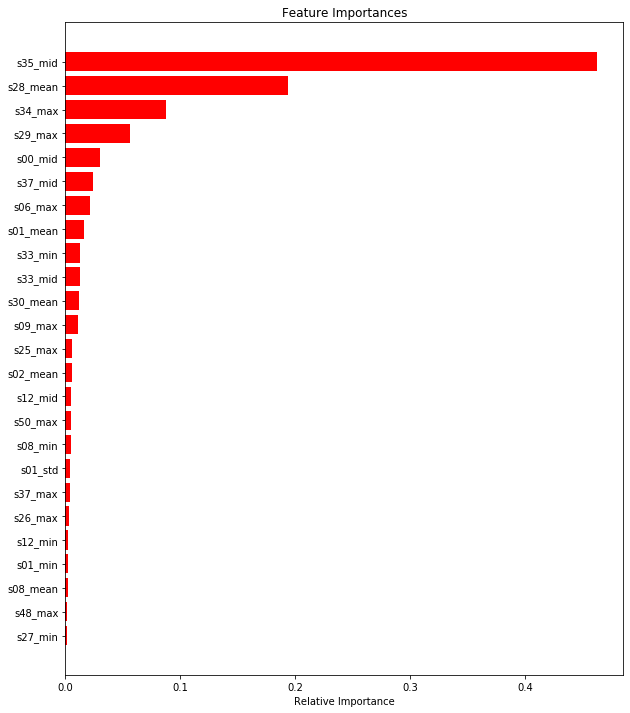

In [97]:
features = X_train_temp.columns[1:]
importances = clf.feature_importances_
indices = (np.argsort(importances))[-25:]
plt.figure(figsize=(10,12))
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='r', align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

In [98]:
imp_f=[features[i] for i in indices]
X_train_temp.drop(imp_f,inplace=True,axis=1)
X_test_temp.drop(imp_f,inplace=True,axis=1)

D:\study\anna\lib\site-packages\pandas\core\frame.py:3997: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [99]:
clf = DecisionTreeClassifier(random_state=0)
clf.fit(X_train_temp[X_train_temp.columns[1:]], y_train_temp)
from sklearn.metrics import accuracy_score
print('train acc:',accuracy_score(y_train_temp, clf.predict(X_train_temp[X_train_temp.columns[1:]])))
print('test acc:',accuracy_score(y_test_temp, clf.predict(X_test_temp[X_train_temp.columns[1:]])))

train acc: 1.0
test acc: 0.9994686346863468


#### even dropping 50% features, our model able to disfiguration train test and cv. it means almost all features have a different distribution over train cv and test.

# One class classifier: Isolation forest

-------------------- Confusion matrix --------------------


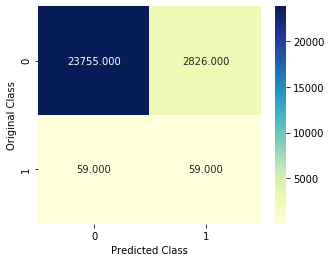

-------------------- Recall matrix (Row sum=1) --------------------


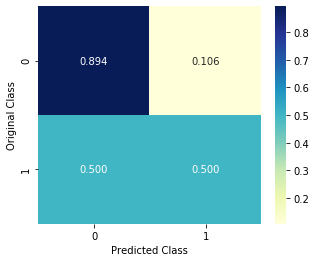

Confusion matrix for cv: None


In [103]:
from sklearn.ensemble import IsolationForest
X=X_train[y_train==0].copy()
clf = IsolationForest(random_state=0,contamination=0.05,n_estimators=50,max_features=6, bootstrap=True, n_jobs=-1).fit(X[X_train.columns[1:]])
pred=clf.predict(X_cv[X_train.columns[1:]])
pred[pred==1]=0
pred[pred==-1]=1
print('Confusion matrix for cv:',plot_confusion_matrix(y_cv, pred,(5,4)))

Confusion matrix for test:
-------------------- Confusion matrix --------------------


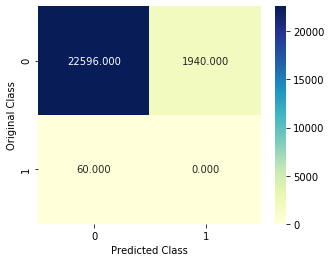

-------------------- Recall matrix (Row sum=1) --------------------


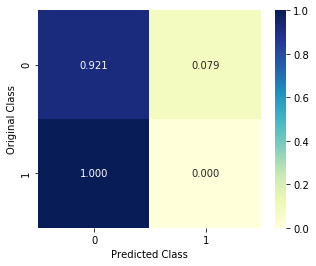

In [104]:
print('Confusion matrix for test:')
pred=clf.predict(X_test[X_train.columns[1:]])
pred[pred==1]=0
pred[pred==-1]=1
plot_confusion_matrix(y_test, pred,(5,4))

## SVM Classifier

confusion matrix for train
-------------------- Confusion matrix --------------------


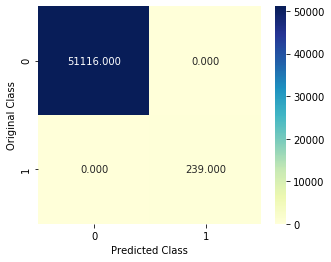

-------------------- Recall matrix (Row sum=1) --------------------


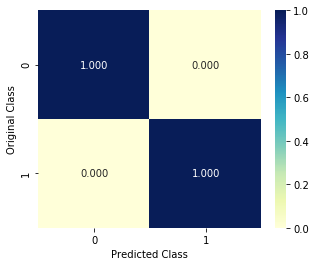

confusion matrix for cv
-------------------- Confusion matrix --------------------


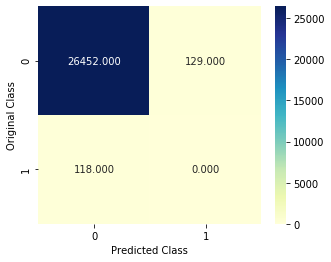

-------------------- Recall matrix (Row sum=1) --------------------


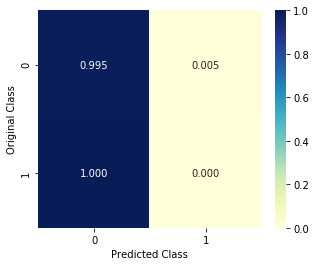

confusion matrix for test
-------------------- Confusion matrix --------------------


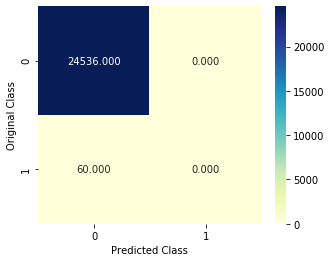

-------------------- Recall matrix (Row sum=1) --------------------


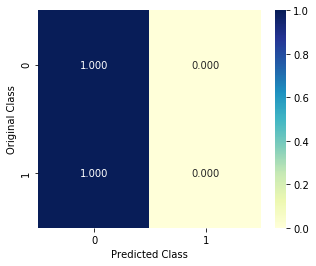

train AUC score: 1.0
cv AUC score: 0.4911026673187615
test AUC score: 0.5


In [16]:
from sklearn.svm import SVC
clf = SVC(C=1000000000, probability=True).fit(X_train[X_train.columns[1:]],y_train)
print('confusion matrix for train')
plot_confusion_matrix(y_train,clf.predict(X_train[X_train.columns[1:]]),(5,4))
print('confusion matrix for cv')
plot_confusion_matrix(y_cv,clf.predict(X_cv[X_train.columns[1:]]),(5,4))
print('confusion matrix for test')
plot_confusion_matrix(y_test,clf.predict(X_test[X_train.columns[1:]]),(5,4))
print('train AUC score:',roc_auc_score(y_train, clf.predict_proba(X_train[X_train.columns[1:]])[:,1]))
print('cv AUC score:',roc_auc_score(y_cv, clf.predict_proba(X_cv[X_train.columns[1:]])[:,1]))
print('test AUC score:',roc_auc_score(y_test, clf.predict_proba(X_test[X_train.columns[1:]])[:,1]))

## Modeling With Hack:

- As we can see we are unable to reduce overfitting with a simple random forest model, hence I have decided to use some hack which might work in our case.
- I have decided to convert this binary classification problem into a multiclass classification problem.
- I will randomly sample negative labeled data into different sets without replacement having size same as size of positive labeled dataset.
- The negative class will get breaks into different classes.
- But we have very few data points in positive class so that we will get a very high number of classes as we keep its size same as size of positive class.
- We need to increase data points in positive class hence we will use SMOTE to do that.
- SMOTE is an oversampling technique which use to create synthesized samples of dominated class.

### SMOTE (oversampling):

In [17]:
# ref: https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
np.random.seed(seed=6)
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0))) 
  
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state = 6,k_neighbors =30,sampling_strategy=0.04) 
X_train_res, y_train_res = sm.fit_sample(X_train[X_train.columns[1:]], y_train.ravel()) 
  
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0))) 


Before OverSampling, counts of label '1': 239
Before OverSampling, counts of label '0': 51116 



Using TensorFlow backend.
D:\study\anna\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
D:\study\anna\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
D:\study\anna\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
D:\study\anna\lib\site-packages\tensorflow\python\framework\dtypes.py:529: FutureWarning: Passing (type, 1) or '1

After OverSampling, the shape of train_X: (53160, 255)
After OverSampling, the shape of train_y: (53160,) 

After OverSampling, counts of label '1': 2044
After OverSampling, counts of label '0': 51116


- As we have very few points of positive class and we don't want huge synthesized samples hence we want to keep k_neighbors value not so high and not so low, I have tried some values, 30 gives good result.
- By adjusting sampling_strategy I got the required amount of synthesized samples.

### Multiclass conversion:

- We got 2044 positive class points, by dividing the negative class into sets having 2044 size we will get 25 sets.
- We will keep class 1 as failure class and other classes from 2 to 26 we will distribute it in normal class sampled sets.

In [18]:
fail_point=X_train_res[y_train_res==1]
X_train=X_train_res[y_train_res==0]
X_train=X_train.sample(frac=1) #shuffel points
j=0
X_train['machine_status']=[0]*X_train.shape[0]
for i in range(int(X_train.shape[0]/2044)): #select 2044 points randomly and assign into any class 2 to 26
    if i==(int(X_train.shape[0]/2044))-1: #if set is last set then we have to assign all remaining point into that class
        label=[i+2]*X_train['machine_status'].iloc[j:].shape[0]
        X_train['machine_status'].iloc[j:]=label
    else:
        label=[i+2]*2044
        X_train['machine_status'].iloc[j:j+2044]=label
        j=j+2044

D:\study\anna\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [19]:
X_train=pd.concat([fail_point,X_train])
X_train=X_train.sample(frac=1)
y_train=X_train['machine_status']
y_train=y_train.fillna(1)
y_cv[y_cv==0]=2
y_test[y_test==0]=2
X_train.drop(['machine_status'],inplace=True,axis=1)
print('unique classes:',np.unique(y_train))

unique classes: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 23. 24. 25. 26.]


D:\study\anna\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


### Normalization:

In [20]:
for col in X_train.columns:
    scaler = MinMaxScaler()
    X_train[col]=scaler.fit_transform(X_train[col].values.reshape(-1, 1))
    X_cv[col]=scaler.transform(X_cv[col].values.reshape(-1, 1))
    X_test[col]=scaler.transform(X_test[col].values.reshape(-1, 1))

### Modeling:

train Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


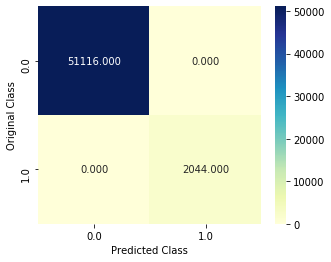

-------------------- Recall matrix (Row sum=1) --------------------


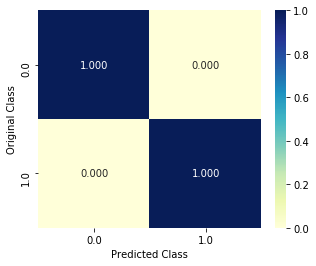

cv Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


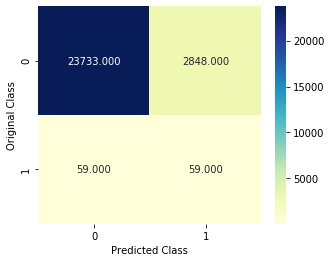

-------------------- Recall matrix (Row sum=1) --------------------


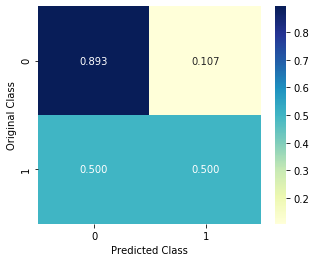

cv Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


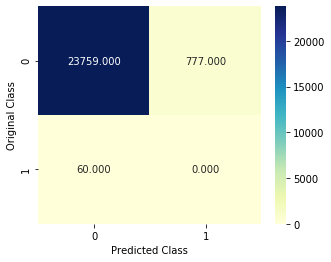

-------------------- Recall matrix (Row sum=1) --------------------


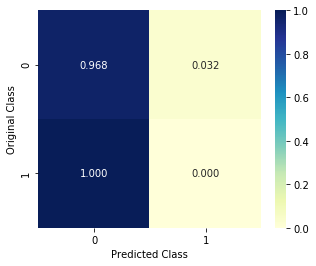

In [21]:
clf = RandomForestClassifier(n_jobs=-1,random_state=1)
clf.fit(X_train,y_train)
y=y_train.copy()
y[y>1]=0 # all point belonging to class more then 1, these all points are actully class 0 point
print('train Confusion matrix and Recall matrix')
pred=clf.predict(X_train)
pred[pred>1]=0
plot_confusion_matrix(y, pred,(5,4))
y=y_cv.copy()
y[y>1]=0
print('cv Confusion matrix and Recall matrix')
pred=clf.predict(X_cv[X_cv.columns[1:]])
pred[pred>1]=0
plot_confusion_matrix(y, pred,(5,4))
y=y_test.copy()
y[y>1]=0
print('cv Confusion matrix and Recall matrix')
pred=clf.predict(X_test[X_cv.columns[1:]])
pred[pred>1]=0
plot_confusion_matrix(y, pred,(5,4))

### Hyperparameter tuning:
- We want cv false positive very low and some good cv true positive, to get this we have to try multiple values of hyperparameters.
- I am going to create a data frame that will store all true positive and false positive values of a train, cv, and test.

In [17]:
columns=['tree','depth','split','train_tp','train_fp','cv_tp','cv_fp','test_tp','test_fp']
cv_obs=pd.DataFrame(columns=columns)
tree=[95,100,108,110,120]
depth=[5,6,7,8,10,11,12]
split=[3,5,6,7,8,10,15,18,20,30]

for t in tqdm(tree):
    for d in depth:
        for s in split:
            l=[] #it store single row to append in data frame
            l.append(t)
            l.append(d)
            l.append(s)
            clf = RandomForestClassifier(n_estimators=t,max_depth=d,min_samples_split=s,max_features='sqrt',n_jobs=-1,random_state=1)
            clf.fit(X_train,y_train)
            C = confusion_matrix(y_train, clf.predict(X_train))
            A =(((C.T)/(C.sum(axis=1))).T)
            l.append(A[0][0]) #true positive of class 1
            l.append(A[1][0]) #false positive of class 1
            C = confusion_matrix(y_cv, clf.predict(X_cv[X_cv.columns[1:]]))
            A =(((C.T)/(C.sum(axis=1))).T)
            l.append(A[0][0])
            l.append(A[1][0])
            C = confusion_matrix(y_test, clf.predict(X_test[X_test.columns[1:]]))
            A =(((C.T)/(C.sum(axis=1))).T)
            l.append(A[0][0])
            l.append(A[1][0])
            cv_obs=cv_obs.append(pd.Series(l, index=columns), ignore_index=True)

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide


In [18]:
temp1=cv_obs[cv_obs['cv_fp']<0.25] # parameter for which cv false positive is smaller then 0.25
temp2=temp1[temp1['cv_tp']>0.0]
temp2[temp2['test_tp']>0.0]

,tree,depth,split,train_tp,train_fp,cv_tp,cv_fp,test_tp,test_fp
31,95.0,8.0,5.0,1.0,0.000489,0.500000,0.237463,0.683333,0.138857
44,95.0,10.0,8.0,1.0,0.000000,0.500000,0.210752,0.150000,0.062031
52,95.0,11.0,6.0,1.0,0.000000,0.500000,0.165005,0.083333,0.047930
101,100.0,8.0,5.0,1.0,0.000000,0.500000,0.222151,0.366667,0.136697
114,100.0,10.0,8.0,1.0,0.000000,0.500000,0.208796,0.083333,0.060727
122,100.0,11.0,6.0,1.0,0.000000,0.500000,0.160378,0.016667,0.042713
126,100.0,11.0,15.0,1.0,0.000000,0.737288,0.248335,0.283333,0.046136
136,100.0,12.0,15.0,1.0,0.000000,0.500000,0.147812,0.066667,0.019319
171,108.0,8.0,5.0,1.0,0.000000,0.500000,0.214815,0.283333,0.122229
179,108.0,8.0,30.0,1.0,0.000000,0.500000,0.237500,0.183333,0.128179


## Hyper parameter tuned model
- from the above observation, we will use a set of hyperparameters for which we got very less false positive.
- n_estimators=100,max_depth=12,min_samples_split=15 this values gives lowest false positive.

train Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


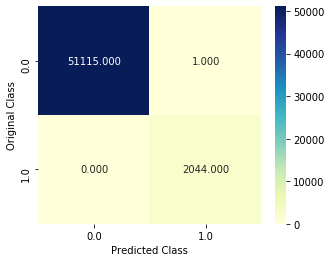

-------------------- Recall matrix (Row sum=1) --------------------


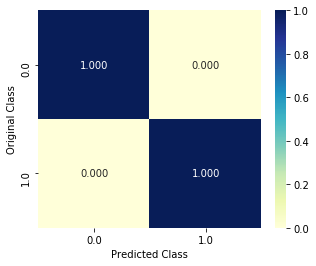

cv Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


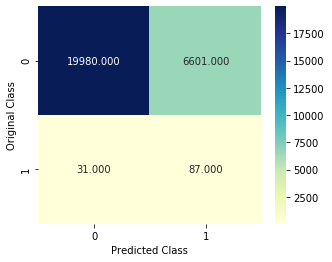

-------------------- Recall matrix (Row sum=1) --------------------


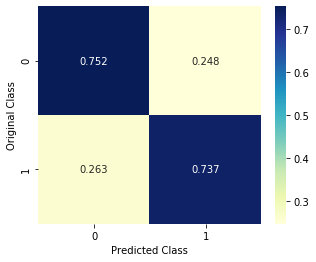

In [12]:
clf = RandomForestClassifier(n_estimators=100,max_depth=11,min_samples_split=15,max_features='sqrt',n_jobs=-1,random_state=1)
clf.fit(X_train,y_train)
y=y_train.copy()
y[y>1]=0 # all point belonging to class more then 1, these all points are actully class 0 point
print('train Confusion matrix and Recall matrix')
pred=clf.predict(X_train)
pred[pred>1]=0
plot_confusion_matrix(y, pred,(5,4))
y=y_cv.copy()
y[y>1]=0
print('cv Confusion matrix and Recall matrix')
pred=clf.predict(X_cv[X_cv.columns[1:]])
pred[pred>1]=0
plot_confusion_matrix(y, pred,(5,4))
y=y_test.copy()
y[y>1]=0
print('cv Confusion matrix and Recall matrix')
pred=clf.predict(X_test[X_cv.columns[1:]])
pred[pred>1]=0
plot_confusion_matrix(y, pred,(5,4))

### cv false positive checking

In [15]:
d=pd.DataFrame() #temp dataframe
d['time']=X_cv['timestamp']
d['true']=y_cv
d['pred']=clf.predict(X_cv[X_cv.columns[1:]])
a=d[d['true']!=1]
x=a[a['pred']==1]
x['time']=pd.to_datetime(x['time'])
g=x.groupby(by=x['time'].dt.date)
print('date of failure:',list(g.groups.keys()))

date of failure: [datetime.date(2018, 6, 26), datetime.date(2018, 6, 27), datetime.date(2018, 6, 28), datetime.date(2018, 7, 4), datetime.date(2018, 7, 5), datetime.date(2018, 7, 6), datetime.date(2018, 7, 7), datetime.date(2018, 7, 8), datetime.date(2018, 7, 9), datetime.date(2018, 7, 10), datetime.date(2018, 7, 11), datetime.date(2018, 7, 12), datetime.date(2018, 7, 13), datetime.date(2018, 7, 14), datetime.date(2018, 7, 15), datetime.date(2018, 7, 16), datetime.date(2018, 7, 17), datetime.date(2018, 7, 18), datetime.date(2018, 7, 19), datetime.date(2018, 7, 20), datetime.date(2018, 7, 21), datetime.date(2018, 7, 22), datetime.date(2018, 7, 23), datetime.date(2018, 7, 24), datetime.date(2018, 7, 25), datetime.date(2018, 7, 26), datetime.date(2018, 7, 27), datetime.date(2018, 7, 28)]


D:\study\anna\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


#### high fase positive.

## Feature set 2:
- We are using window of 30 samples and we are preding failure 30 minutes befor it happen other is same as above.

In [ ]:
if not os.path.isfile('final_data_2.csv'):
    # here we are making column's name for our dataframe. 
    columns=[]
    columns.append(data.columns[0]) 
    for col in data.columns[1:-1]:
        columns.append('s{0}_mean'.format(col[7:])) #to select sensor number
        columns.append('s{0}_std'.format(col[7:]))
        columns.append('s{0}_mid'.format(col[7:]))
        columns.append('s{0}_min'.format(col[7:]))
        columns.append('s{0}_max'.format(col[7:]))
    columns.append('machine_status')
    index=0
    final_data=pd.DataFrame(columns=columns)
    while index < data.shape[0]-80:
        print(index)
        window=data[data.columns[1:-1]].iloc[index:index+40]
        l=[] # this list store single row
        l.append(data['timestamp'].iloc[index+40]) #taking timestamp
        for col in window.columns:
            l.append(window[col].mean())#calculating features
            l.append(window[col].std())
            l.append(window[col].median())
            l.append(window[col].min())
            l.append(window[col].max())
        ms=data['machine_status'].iloc[index+80:index+120].max() #taking max class label from window so that if there is----
        #failure, we can detect it.
        l.append(ms)
        if (ms==1) and (data['machine_status'].iloc[index+80+1:index+120+1].max()==0): #if failure window is over then---
            #we should move index to next point after failutr point because we are not uing that failure window for prediction.
            index=index+81
        else:
            if ms==1:
                index=index+1 #1 spacing
            else:
                index=index+3 #2 spacing
        final_data=final_data.append(pd.Series(l, index=columns), ignore_index=True)
    final_data.to_csv('final_data_2.csv') 

## Modeling

In [22]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from tqdm.notebook import tqdm
from sklearn.metrics import accuracy_score, f1_score, recall_score, confusion_matrix

In [23]:
X=pd.read_csv('final_data_2.csv')
fail_point=X[X['machine_status']==1]
X=X[X['machine_status']==0] #store only points belonging to class 0

In [24]:
#devide 0 labeled points into train,cv and test
X_train=X.iloc[0:int((X.shape[0]*50)/100)]
X_cv=X.iloc[int((X.shape[0]*50)/100):int((X.shape[0]*76)/100)]
X_test=X.iloc[int((X.shape[0]*76)/100):]
print('train shape:',X_train.shape)
print('cv shape:',X_cv.shape)
print('test shape:',X_test.shape)

train shape: (6561, 138)
cv shape: (3411, 138)
test shape: (3150, 138)


In [25]:
fail_point['timestamp']=pd.to_datetime(fail_point['timestamp'])
g=fail_point.groupby(by=fail_point['timestamp'].dt.date) #group 1 labeled points by date, so that we should not do data leakage
cnt=0
for date in list(g.groups.keys()):
    if cnt < 4:
        X_train=pd.concat([g.get_group(date),X_train]) 
        cnt=cnt+1
    else:
        cnt=cnt+1

cnt=0
for date in list(g.groups.keys()):
    if cnt > 3 and cnt < 6:
        X_cv=pd.concat([g.get_group(date),X_cv]) 
        cnt=cnt+1
    else:
        cnt=cnt+1
    
cnt=0
for date in list(g.groups.keys()):
    if cnt == 6:
        X_test=pd.concat([g.get_group(date),X_test]) 
        cnt=cnt+1
    else:
        cnt=cnt+1

In [ ]:
y_train = X_train['machine_status']
X_train = X_train.drop(['machine_status','Unnamed: 0'], axis=1)
y_cv = X_cv['machine_status']
X_cv = X_cv.drop(['machine_status','Unnamed: 0'], axis=1)
y_test = X_test['machine_status']
X_test = X_test.drop(['machine_status','Unnamed: 0'], axis=1)

### Multiclass conversion

In [34]:
# ref: https://www.geeksforgeeks.org/ml-handling-imbalanced-data-with-smote-and-near-miss-algorithm-in-python/
np.random.seed(seed=6)
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1))) 
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0))) 
  
from imblearn.over_sampling import SMOTE 
sm = SMOTE(random_state = 6,k_neighbors =30,sampling_strategy=0.04) 
X_train_res, y_train_res = sm.fit_sample(X_train[X_train.columns[1:]], y_train.ravel()) 
  
print('After OverSampling, the shape of train_X: {}'.format(X_train_res.shape)) 
print('After OverSampling, the shape of train_y: {} \n'.format(y_train_res.shape)) 
  
print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1))) 
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0))) 


Before OverSampling, counts of label '1': 156
Before OverSampling, counts of label '0': 34155 

After OverSampling, the shape of train_X: (35521, 135)
After OverSampling, the shape of train_y: (35521,) 

After OverSampling, counts of label '1': 1366
After OverSampling, counts of label '0': 34155


In [35]:
fail_point=X_train_res[y_train_res==1]
X_train=X_train_res[y_train_res==0]
X_train=X_train.sample(frac=1) #shuffel points
j=0
X_train['machine_status']=[0]*X_train.shape[0]
for i in range(int(X_train.shape[0]/1366)): #select 2044 points randomly and assign into any class 2 to 26
    if i==(int(X_train.shape[0]/1366))-1: #if set is last set then we have to assign all remaining point into that class
        label=[i+2]*X_train['machine_status'].iloc[j:].shape[0]
        X_train['machine_status'].iloc[j:]=label
    else:
        label=[i+2]*1366
        X_train['machine_status'].iloc[j:j+1366]=label
        j=j+1366

D:\study\anna\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [36]:
X_train=pd.concat([fail_point,X_train])
X_train=X_train.sample(frac=1)
y_train=X_train['machine_status']
y_train=y_train.fillna(1)
y_cv[y_cv==0]=2
y_test[y_test==0]=2
X_train.drop(['machine_status'],inplace=True,axis=1)
print('unique classes:',np.unique(y_train))

unique classes: [ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 23. 24. 25. 26.]


D:\study\anna\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [37]:
for col in X_train.columns:
    scaler = MinMaxScaler()
    X_train[col]=scaler.fit_transform(X_train[col].values.reshape(-1, 1))
    X_cv[col]=scaler.transform(X_cv[col].values.reshape(-1, 1))
    X_test[col]=scaler.transform(X_test[col].values.reshape(-1, 1))

train Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


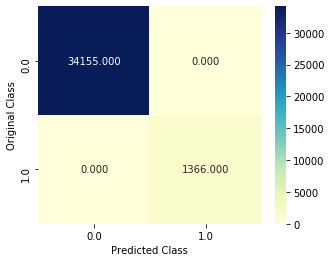

-------------------- Recall matrix (Row sum=1) --------------------


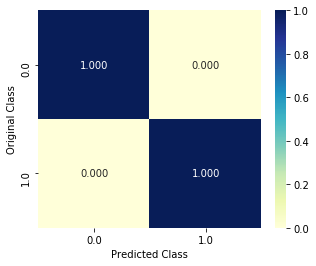

cv Confusion matrix and Recall matrix
-------------------- Confusion matrix --------------------


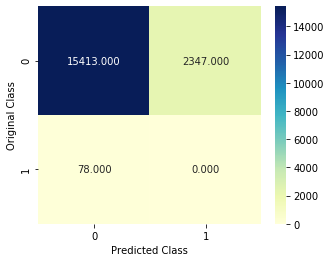

-------------------- Recall matrix (Row sum=1) --------------------


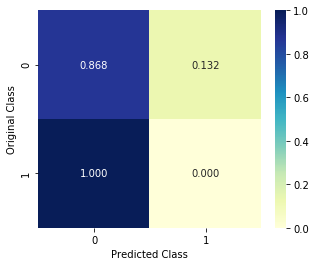

In [39]:
clf = RandomForestClassifier(n_estimators=100,max_depth=11,min_samples_split=6,max_features='sqrt',n_jobs=-1,random_state=1)
clf.fit(X_train,y_train)
y=y_train.copy()
y[y>1]=0
print('train Confusion matrix and Recall matrix')
pred=clf.predict(X_train)
pred[pred>1]=0
plot_confusion_matrix(y, pred,(5,4))
y=y_cv.copy()
y[y>1]=0
print('cv Confusion matrix and Recall matrix')
pred=clf.predict(X_cv[X_cv.columns[1:]])
pred[pred>1]=0
plot_confusion_matrix(y, pred,(5,4))

### Hyper Parameter tuning

In [40]:
columns=['tree','depth','split','train_tp','train_fp','cv_tp','cv_fp','test_tp','test_fp']
cv_obs=pd.DataFrame(columns=columns)
tree=[95,100,108,110,120]
depth=[5,6,7,8,10,11,12]
split=[3,5,6,7,8,10,15,18,20,30]

for t in tqdm(tree):
    for d in depth:
        for s in split:
            l=[] #it store single row to append in data frame
            l.append(t)
            l.append(d)
            l.append(s)
            clf = RandomForestClassifier(n_estimators=t,max_depth=d,min_samples_split=s,max_features='sqrt',n_jobs=-1,random_state=1)
            clf.fit(X_train,y_train)
            C = confusion_matrix(y_train, clf.predict(X_train))
            A =(((C.T)/(C.sum(axis=1))).T)
            l.append(A[0][0]) #true positive of class 1
            l.append(A[1][0]) #false positive of class 1
            C = confusion_matrix(y_cv, clf.predict(X_cv[X_cv.columns[1:]]))
            A =(((C.T)/(C.sum(axis=1))).T)
            l.append(A[0][0])
            l.append(A[1][0])
            C = confusion_matrix(y_test, clf.predict(X_test[X_test.columns[1:]]))
            A =(((C.T)/(C.sum(axis=1))).T)
            l.append(A[0][0])
            l.append(A[1][0])
            cv_obs=cv_obs.append(pd.Series(l, index=columns), ignore_index=True)

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide
D:\study\anna\lib\site-packages\ipykernel_launcher.py:21: RuntimeWarning: invali

D:\study\anna\lib\site-packages\ipykernel_launcher.py:25: RuntimeWarning: invalid value encountered in true_divide


In [43]:
cv_obs

,tree,depth,split,train_tp,train_fp,cv_tp,cv_fp,test_tp,test_fp
0,95.0,5.0,3.0,1.0,0.010249,0.0,0.290146,0.0,0.495578
1,95.0,5.0,5.0,1.0,0.012445,0.0,0.257545,0.0,0.454712
2,95.0,5.0,6.0,1.0,0.010981,0.0,0.332658,0.0,0.645441
3,95.0,5.0,7.0,1.0,0.010249,0.0,0.308784,0.0,0.606160
4,95.0,5.0,8.0,1.0,0.009517,0.0,0.311036,0.0,0.616529
...,...,...,...,...,...,...,...,...,...
345,120.0,12.0,10.0,1.0,0.000000,0.0,0.154054,0.0,0.274047
346,120.0,12.0,15.0,1.0,0.000000,0.0,0.155124,0.0,0.276792
347,120.0,12.0,18.0,1.0,0.000732,0.0,0.123986,0.0,0.255932
348,120.0,12.0,20.0,1.0,0.000732,0.0,0.132939,0.0,0.247941


### all cv and test true positive are zero.

# Feature set 3:
### considering recovering as broken state with window 60 and spacing of 1 with droping features which not useful.

In [33]:
data=pd.read_csv('sensor.csv')

In [34]:
data.drop(['sensor_15','Unnamed: 0'],inplace=True,axis=1)
mean=data.iloc[0:int((data.shape[0]*50)/100)][data.columns[1:-1]].mean().values
for i in tqdm(range(1,len(data.columns)-1)):
    col=data.columns[i]
    data[col]=data[col].fillna(mean[i-1])

In [35]:
data.drop(['sensor_01','sensor_03','sensor_14','sensor_16','sensor_17','sensor_18','sensor_19','sensor_20','sensor_21',
           'sensor_22','sensor_23','sensor_24','sensor_25','sensor_26','sensor_27','sensor_28','sensor_29','sensor_30',
           'sensor_31','sensor_33','sensor_34','sensor_37','sensor_36','sensor_48'],inplace=True,axis=1)

In [36]:
def map_fun(x):
    if x=='NORMAL':
        return 0
    else:
        return 1
    
data['machine_status']=data.machine_status.map(map_fun)

In [61]:
if not os.path.isfile('final_data_60.csv'):
    columns=[]
# columns.append(data.columns[0])
    for col in data.columns[1:-1]:
        columns.append('s{0}_median'.format(col[7:])) #to select sensor number
        columns.append('s{0}_mean'.format(col[7:]))
        columns.append('s{0}_std'.format(col[7:]))
        columns.append('s{0}_min'.format(col[7:]))
        columns.append('s{0}_max'.format(col[7:]))
    columns.append('machine_status')
    w=60
    
    X = []
    for i in data.columns[1:]:
        X1,X2,X3,X4,X5,X6=[],[],[],[],[],[]
        if not i =='machine_status':
            X1.append(data[i].rolling(w).median())
            X2.append(data[i].rolling(w).mean())
            X3.append(data[i].rolling(w).std())
            X4.append(data[i].rolling(w).min())
            X5.append(data[i].rolling(w).max())
            fea_data = np.hstack([np.array(X1).reshape(-1,1),np.array(X2).reshape(-1,1),\
                       np.array(X3).reshape(-1,1),np.array(X4).reshape(-1,1),\
                       np.array(X5).reshape(-1,1)])
        else:    
            X6.append(data[i].rolling(w).max())
            fea_data=np.array(X6).reshape(-1,1)
        X.append(fea_data)
        temp_data = X[0]
    for i in range(1,len(X)):
        temp_data = np.hstack([temp_data, X[i]])

    temp_data = X[0]
    for i in range(1,len(X)):
        temp_data = np.hstack([temp_data, X[i]])

    data_df = pd.DataFrame(temp_data, columns=columns)
    data_df=data_df.loc[w-1:]
    temp1=data_df['machine_status'].iloc[w+w:].values
    temp2=data['timestamp'].iloc[w:-(w+w-1)].values
    data_df=data_df.iloc[:-(w+w)].copy()
    data_df['machine_status']=temp1
    data_df['timestamp']=temp2
    data_df.to_csv('final_data_60.csv')


## Modeling:

In [32]:
X=pd.read_csv('final_data_60.csv',index_col=0)
X.head(2)

,s00_median,s00_mean,s00_std,s00_min,s00_max,s02_median,s02_mean,s02_std,s02_min,s02_max,...,s50_std,s50_min,s50_max,s51_median,s51_mean,s51_std,s51_min,s51_max,machine_status,timestamp
59,2.453588,2.454506,0.006854,2.444734,2.466377,53.125,53.142359,0.083888,53.03819,53.68924,...,9.633905,222.5116,253.7616,210.50345,210.030863,8.617958,197.9167,224.2477,0.0,2018-04-01 01:00:00
60,2.453588,2.454309,0.006704,2.444734,2.466377,53.125,53.140912,0.083418,53.03819,53.68924,...,9.718791,222.5116,253.7616,210.93750,210.243055,8.558099,197.9167,224.2477,0.0,2018-04-01 01:01:00


## Train test split:

In [33]:
X_train=X.iloc[0:int((X.shape[0]*50)/100)]
X_cv=X.iloc[int((X.shape[0]*50)/100):int((X.shape[0]*75)/100)]
X_test=X.iloc[int((X.shape[0]*75)/100):]
print('train shape:',X_train.shape)
print('cv shape:',X_cv.shape)
print('test shape:',X_test.shape)

train shape: (110070, 137)
cv shape: (55035, 137)
test shape: (55036, 137)


## checking for data leakage

In [34]:
# we have 30 points for each single failure hence there is chances of placing some points in train and 
#some points in cv those belong to singal failure. i am printing dates so that i can check data leakage.
X_train_fail=X_train[X_train['machine_status']==1].copy()
X_train_fail['timestamp']=pd.to_datetime(X_train_fail['timestamp'])
g1=X_train_fail.groupby(by=X_train_fail['timestamp'].dt.date)
print('train failure dates:\n',g1.groups.keys())

X_cv_fail=X_cv[X_cv['machine_status']==1].copy()
X_cv_fail['timestamp']=pd.to_datetime(X_cv_fail['timestamp'])
g2=X_cv_fail.groupby(by=X_cv_fail['timestamp'].dt.date)
print('cv failure dates:\n',g2.groups.keys())

train failure dates:
 dict_keys([datetime.date(2018, 4, 12), datetime.date(2018, 4, 13), datetime.date(2018, 4, 17), datetime.date(2018, 4, 18), datetime.date(2018, 4, 19), datetime.date(2018, 4, 20), datetime.date(2018, 5, 19), datetime.date(2018, 5, 20), datetime.date(2018, 5, 24), datetime.date(2018, 5, 25)])
cv failure dates:
 dict_keys([datetime.date(2018, 6, 28), datetime.date(2018, 6, 29), datetime.date(2018, 6, 30), datetime.date(2018, 7, 1), datetime.date(2018, 7, 2), datetime.date(2018, 7, 3), datetime.date(2018, 7, 4), datetime.date(2018, 7, 7)])


In [35]:
y_train = X_train['machine_status']
X_train = X_train.drop(['machine_status'], axis=1)
y_cv = X_cv['machine_status']
X_cv = X_cv.drop(['machine_status'], axis=1)
y_test = X_test['machine_status']
X_test = X_test.drop(['machine_status'], axis=1)

In [36]:
print('train labels count:\n',y_train.value_counts())
print('cv labels count:\n',y_cv.value_counts())
print('test labels count:\n',y_test.value_counts())

train labels count:
 0.0    103859
1.0      6211
Name: machine_status, dtype: int64
cv labels count:
 0.0    46484
1.0     8551
Name: machine_status, dtype: int64
test labels count:
 0.0    54901
1.0      135
Name: machine_status, dtype: int64


In [37]:
for col in X_train.columns[0:-1]:
    scaler = MinMaxScaler()
    X_train[col]=scaler.fit_transform(X_train[col].values.reshape(-1, 1))
    X_cv[col]=scaler.transform(X_cv[col].values.reshape(-1, 1))
    X_test[col]=scaler.transform(X_test[col].values.reshape(-1, 1))

train confusion and recall matrix:

-------------------- Confusion matrix --------------------


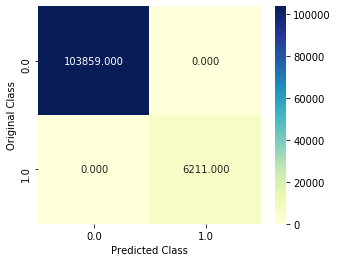

-------------------- Recall matrix (Row sum=1) --------------------


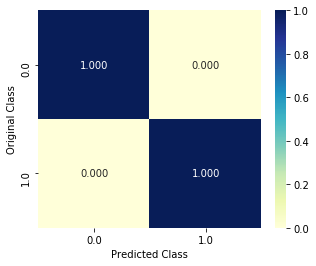

cv confusion and recall matrix:

-------------------- Confusion matrix --------------------


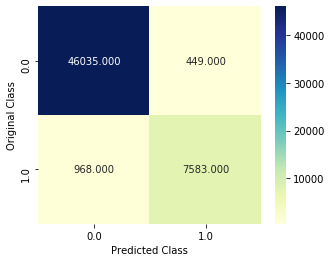

-------------------- Recall matrix (Row sum=1) --------------------


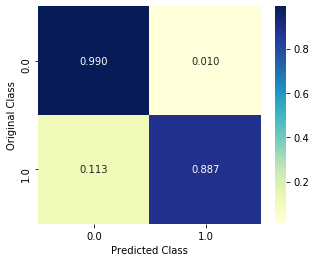

test confusion and recall matrix:

-------------------- Confusion matrix --------------------


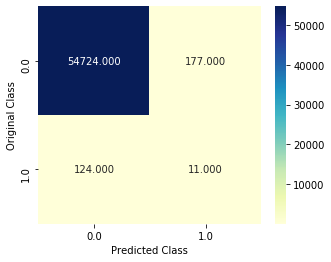

-------------------- Recall matrix (Row sum=1) --------------------


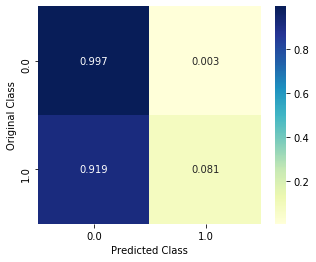

train acc: 1.0 train AUC score: 1.0
cv acc: 0.974252748251113 cv AUC score: 0.9853931277513073
test acc: 0.9945308525328875 test AUC score: 0.4640391087796418


In [39]:
clf = RandomForestClassifier(n_jobs=-1,random_state=1,max_features='sqrt')
clf.fit(X_train[X_train.columns[0:-1]], y_train)
print('train confusion and recall matrix:\n')
plot_confusion_matrix(y_train, clf.predict(X_train[X_train.columns[0:-1]]),(5,4))
print('cv confusion and recall matrix:\n')
plot_confusion_matrix(y_cv, clf.predict(X_cv[X_train.columns[0:-1]]),(5,4))
print('test confusion and recall matrix:\n')
plot_confusion_matrix(y_test, clf.predict(X_test[X_train.columns[0:-1]]),(5,4))

print('train acc:',accuracy_score(y_train, clf.predict(X_train[X_train.columns[0:-1]])),'train AUC score:',roc_auc_score(y_train, clf.predict_proba(X_train[X_train.columns[0:-1]])[:,1]))
print('cv acc:',accuracy_score(y_cv, clf.predict(X_cv[X_train.columns[0:-1]])),'cv AUC score:',roc_auc_score(y_cv, clf.predict_proba(X_cv[X_train.columns[0:-1]])[:,1]))
print('test acc:',accuracy_score(y_test, clf.predict(X_test[X_train.columns[0:-1]])),'test AUC score:',roc_auc_score(y_test, clf.predict_proba(X_test[X_train.columns[0:-1]])[:,1]))


## checking model prediction for actual 7 failure:

In [69]:
d=pd.DataFrame() #temp dataframe
d['time']=X_cv['timestamp']
d['true']=y_cv
d['pred']=clf.predict(X_cv[X_train.columns[0:-1]])
a=d[d['true']==1]
x=a[a['pred']==1]
x['time']=pd.to_datetime(x['time'])
g=x.groupby(by=x['time'].dt.date)
print('date of failure:',list(g.groups.keys()))

date of failure: [datetime.date(2018, 6, 28), datetime.date(2018, 6, 29), datetime.date(2018, 6, 30), datetime.date(2018, 7, 1), datetime.date(2018, 7, 2), datetime.date(2018, 7, 3), datetime.date(2018, 7, 4)]


D:\study\anna\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


### we have failure at  2018-07-08 00:11:00, we have not predicted here.

## Feature 4: same approch with 40 size window

In [70]:
if not os.path.isfile('final_data_40.csv'):
    columns=[]
# columns.append(data.columns[0])
    for col in data.columns[1:-1]:
        columns.append('s{0}_median'.format(col[7:])) #to select sensor number
        columns.append('s{0}_mean'.format(col[7:]))
        columns.append('s{0}_std'.format(col[7:]))
        columns.append('s{0}_min'.format(col[7:]))
        columns.append('s{0}_max'.format(col[7:]))
    columns.append('machine_status')
    w=40
    
    X = []
    for i in data.columns[1:]:
        X1,X2,X3,X4,X5,X6=[],[],[],[],[],[]
        if not i =='machine_status':
            X1.append(data[i].rolling(w).median())
            X2.append(data[i].rolling(w).mean())
            X3.append(data[i].rolling(w).std())
            X4.append(data[i].rolling(w).min())
            X5.append(data[i].rolling(w).max())
            fea_data = np.hstack([np.array(X1).reshape(-1,1),np.array(X2).reshape(-1,1),\
                       np.array(X3).reshape(-1,1),np.array(X4).reshape(-1,1),\
                       np.array(X5).reshape(-1,1)])
        else:    
            X6.append(data[i].rolling(w).max())
            fea_data=np.array(X6).reshape(-1,1)
        X.append(fea_data)
        temp_data = X[0]
    for i in range(1,len(X)):
        temp_data = np.hstack([temp_data, X[i]])

    temp_data = X[0]
    for i in range(1,len(X)):
        temp_data = np.hstack([temp_data, X[i]])

    data_df = pd.DataFrame(temp_data, columns=columns)
    data_df=data_df.loc[w-1:]
    temp1=data_df['machine_status'].iloc[w+w:].values
    temp2=data['timestamp'].iloc[w:-(w+w-1)].values
    data_df=data_df.iloc[:-(w+w)].copy()
    data_df['machine_status']=temp1
    data_df['timestamp']=temp2
    data_df.to_csv('final_data_40.csv')


## Modeling:

In [40]:
X=pd.read_csv('final_data_40.csv',index_col=0)
X.head(2)

,s00_median,s00_mean,s00_std,s00_min,s00_max,s02_median,s02_mean,s02_std,s02_min,s02_max,...,s50_std,s50_min,s50_max,s51_median,s51_mean,s51_std,s51_min,s51_max,machine_status,timestamp
39,2.453588,2.454842,0.007087,2.444734,2.465394,53.1467,53.15538,0.097400,53.03819,53.68924,...,4.772475,236.9792,253.7616,202.98030,208.362265,9.616558,197.9167,224.2477,0.0,2018-04-01 00:40:00
40,2.453588,2.454449,0.006921,2.444734,2.465394,53.1250,53.15321,0.097077,53.03819,53.68924,...,4.963596,236.9792,253.7616,203.41435,208.832462,9.726034,197.9167,224.2477,0.0,2018-04-01 00:41:00


In [41]:
X_train=X.iloc[0:int((X.shape[0]*50)/100)]
X_cv=X.iloc[int((X.shape[0]*50)/100):int((X.shape[0]*75)/100)]
X_test=X.iloc[int((X.shape[0]*75)/100):]
print('train shape:',X_train.shape)
print('cv shape:',X_cv.shape)
print('test shape:',X_test.shape)

train shape: (110100, 137)
cv shape: (55050, 137)
test shape: (55051, 137)


In [42]:
y_train = X_train['machine_status']
X_train = X_train.drop(['machine_status'], axis=1)
y_cv = X_cv['machine_status']
X_cv = X_cv.drop(['machine_status'], axis=1)
y_test = X_test['machine_status']
X_test = X_test.drop(['machine_status'], axis=1)

In [43]:
print('train labels count:\n',y_train.value_counts())
print('cv labels count:\n',y_cv.value_counts())
print('test labels count:\n',y_test.value_counts())

train labels count:
 0.0    103969
1.0      6131
Name: machine_status, dtype: int64
cv labels count:
 0.0    46539
1.0     8511
Name: machine_status, dtype: int64
test labels count:
 0.0    54936
1.0      115
Name: machine_status, dtype: int64


In [44]:
for col in X_train.columns[0:-1]:
    scaler = MinMaxScaler()
    X_train[col]=scaler.fit_transform(X_train[col].values.reshape(-1, 1))
    X_cv[col]=scaler.transform(X_cv[col].values.reshape(-1, 1))
    X_test[col]=scaler.transform(X_test[col].values.reshape(-1, 1))

train confusion and recall matrix:

-------------------- Confusion matrix --------------------


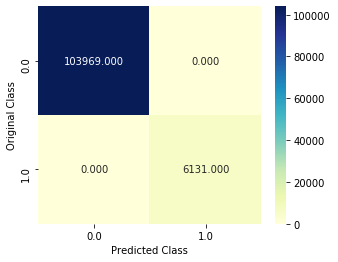

-------------------- Recall matrix (Row sum=1) --------------------


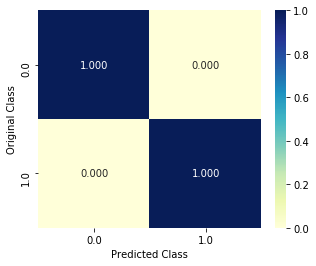

cv confusion and recall matrix:

-------------------- Confusion matrix --------------------


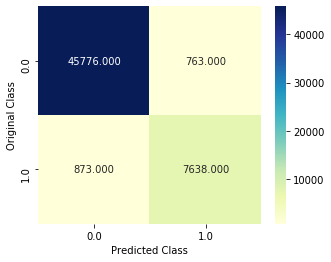

-------------------- Recall matrix (Row sum=1) --------------------


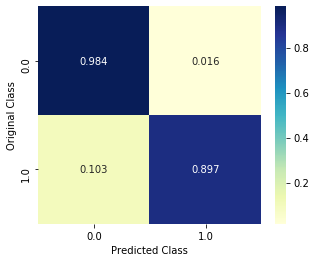

test confusion and recall matrix:

-------------------- Confusion matrix --------------------


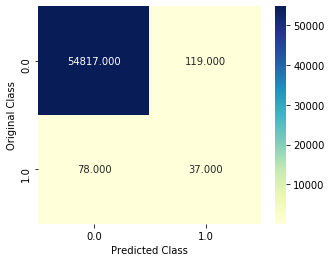

-------------------- Recall matrix (Row sum=1) --------------------


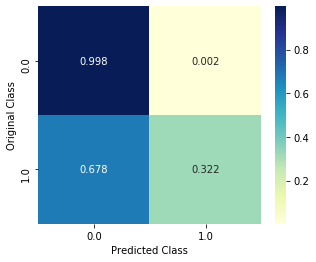

train acc: 1.0 train AUC score: 0.9999999999999999
cv acc: 0.9702815622161671 cv AUC score: 0.9873128619864078
test acc: 0.9964215000635774 test AUC score: 0.5183959516528324


In [45]:
clf = RandomForestClassifier(n_jobs=-1,random_state=1,max_features='sqrt')
clf.fit(X_train[X_train.columns[0:-1]], y_train)
print('train confusion and recall matrix:\n')
plot_confusion_matrix(y_train, clf.predict(X_train[X_train.columns[0:-1]]),(5,4))
print('cv confusion and recall matrix:\n')
plot_confusion_matrix(y_cv, clf.predict(X_cv[X_train.columns[0:-1]]),(5,4))
print('test confusion and recall matrix:\n')
plot_confusion_matrix(y_test, clf.predict(X_test[X_train.columns[0:-1]]),(5,4))

print('train acc:',accuracy_score(y_train, clf.predict(X_train[X_train.columns[0:-1]])),'train AUC score:',roc_auc_score(y_train, clf.predict_proba(X_train[X_train.columns[0:-1]])[:,1]))
print('cv acc:',accuracy_score(y_cv, clf.predict(X_cv[X_train.columns[0:-1]])),'cv AUC score:',roc_auc_score(y_cv, clf.predict_proba(X_cv[X_train.columns[0:-1]])[:,1]))
print('test acc:',accuracy_score(y_test, clf.predict(X_test[X_train.columns[0:-1]])),'test AUC score:',roc_auc_score(y_test, clf.predict_proba(X_test[X_train.columns[0:-1]])[:,1]))


## checking model prediction for actual 7 failure:

In [81]:
d=pd.DataFrame() #temp dataframe
d['time']=X_cv['timestamp']
d['true']=y_cv
d['pred']=clf.predict(X_cv[X_train.columns[0:-1]])
a=d[d['true']==1]
x=a[a['pred']==1]
x['time']=pd.to_datetime(x['time'])
g=x.groupby(by=x['time'].dt.date)
print('date of failure:',list(g.groups.keys()))

date of failure: [datetime.date(2018, 6, 28), datetime.date(2018, 6, 29), datetime.date(2018, 6, 30), datetime.date(2018, 7, 1), datetime.date(2018, 7, 2), datetime.date(2018, 7, 3), datetime.date(2018, 7, 4), datetime.date(2018, 7, 8)]


D:\study\anna\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


In [82]:
print('all FP points of date:',list(g.groups.keys())[-1])
g.get_group(list(g.groups.keys())[-1])

all FP points of date: 2018-07-08


,time,true,pred
141124,2018-07-08 00:05:00,1.0,1.0
141125,2018-07-08 00:06:00,1.0,1.0
141126,2018-07-08 00:07:00,1.0,1.0
141127,2018-07-08 00:08:00,1.0,1.0
141128,2018-07-08 00:09:00,1.0,1.0
141129,2018-07-08 00:10:00,1.0,1.0
141130,2018-07-08 00:11:00,1.0,1.0
141131,2018-07-08 00:12:00,1.0,1.0


- we have failure at 2018-07-08 00:11:00 we are not predicting this failure before 40 minutes.